Analista: Iury Montenegro Farias

In [1]:
!pip install ta


[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [2]:
# Importando Bibliotecas
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.graph_objects as go

In [3]:
# Configura o Pandas para não truncar o output
pd.set_option('display.max_rows', None)

# 1. Entendimento do Negócio
## Objetivo
Nosso objetivo é desenvolver um modelo preditivo que possa prever o preço futuro das ações com alta precisão, auxiliando na tomada de decisões mais informadas e estratégicas dentro do meu painel de investidor pessoal. Este painel integrará os resultados do modelo para melhorar a gestão de portfólio e otimizar as estratégias de investimento.

## Problema de Negócio
Os preços das ações são altamente voláteis e influenciados por uma variedade de fatores econômicos e de mercado. A previsão precisa desses preços pode resultar em retornos financeiros significativos e, ao mesmo tempo, mitigar riscos. No meu contexto como investidor, a capacidade de antecipar movimentos de preços de ações é crucial para a maximização do retorno sobre o investimento.

## Benefícios
Um modelo preditivo bem-sucedido permitirá:

- Maximizar o retorno sobre o investimento: Ao prever corretamente os movimentos de preços, posso ajustar minhas posições de acordo, otimizando ganhos.
- Minimizar riscos: Ao identificar possíveis quedas de preço, posso tomar medidas preventivas para proteger meu portfólio.
- Tomada de decisão informada: O painel oferecerá insights baseados em dados, permitindo decisões mais fundamentadas e estratégicas.

## Definição dos Stakeholders
Os usuários finais deste modelo serão exclusivamente eu, como investidor, e possivelmente outros stakeholders que possam ter interesse no desempenho do meu portfólio. O modelo será utilizado dentro de um painel personalizado de análise e gestão de investimentos, auxiliando na tomada de decisões diárias sobre compra e venda de ações.

## Critérios de Sucesso
- Métricas de Performance: O sucesso do modelo será avaliado principalmente pela métrica de RMSE (Root Mean Squared Error). A meta é alcançar um RMSE inferior a 0.05, indicando uma alta precisão nas previsões.
- Impacto no Negócio: Considero o modelo bem-sucedido se ele permitir um aumento no retorno sobre o investimento em pelo menos 10% ao longo de um período de 6 meses, com uma redução de 5% nas transações mal sucedidas.

## Contexto Econômico e de Mercado
Devido à alta volatilidade do mercado de ações, especialmente em tempos de incerteza econômica global, prever os preços das ações se tornou uma necessidade crucial para investidores que buscam não apenas maximizar seus retornos, mas também proteger seu capital contra grandes oscilações. Este modelo visa fornecer previsões que me permitam agir rapidamente diante das mudanças no mercado, mantendo um portfólio robusto e resiliente.

## Indicadores Financeiros Considerados
Os seguintes indicadores financeiros foram selecionados para serem utilizados na previsão do preço da ação:

### Indicadores de Preço:
- Open: Preço de abertura da ação.
- High: Preço máximo da ação durante o dia.
- Low: Preço mínimo da ação durante o dia.
- Close: Preço de fechamento da ação (que está sendo previsto).
### Indicadores de Volume:
- Volume: Volume de ações negociadas.
- Indicadores de Médias Móveis:
- SMA (Simple Moving Average): Média móvel simples calculada sobre um período de tempo específico.
- EMA (Exponential Moving Average): Média móvel exponencial que dá mais peso aos preços mais recentes.
### Indicadores de Volatilidade:
- Bollinger Bands: Indicadores que consistem em uma média móvel simples e duas bandas de desvio padrão (uma superior e uma inferior).
- ATR (Average True Range): Média da faixa verdadeira, utilizada para medir a volatilidade do ativo.
### Indicadores de Tendência:
- MACD (Moving Average Convergence Divergence): Indicador que mostra a relação entre duas médias móveis de preços.
- RSI (Relative Strength Index): Índice de Força Relativa, que mede a velocidade e a mudança dos movimentos de preços.
### Indicadores de Momento:
- Momentum: Mede a velocidade do movimento do preço de um ativo.
- CCI (Commodity Channel Index): Indica desvios do preço atual em relação à sua média.
### Indicadores de Volume e Fluxo de Dinheiro:
- OBV (On-Balance Volume): Relaciona o volume ao movimento de preço.
- CMF (Chaikin Money Flow): Mede o volume de dinheiro num determinado período.

## Justificativa para a Seleção dos Indicadores
Os indicadores foram escolhidos com base em sua relevância histórica para prever movimentos de preços de ações. A seleção foi orientada por práticas comuns em análise técnica, onde cada indicador fornece uma perspectiva diferente sobre a tendência, volatilidade e momento do ativo. A combinação desses indicadores visa capturar uma visão holística do comportamento dos preços das ações, maximizando a precisão das previsões.

## Discussão sobre Limitações
O modelo pode enfrentar limitações em cenários de alta volatilidade ou durante eventos de "cisne negro", como crises financeiras ou mudanças políticas inesperadas. Essas situações podem impactar a precisão das previsões. Para mitigar esse risco, será importante monitorar continuamente a performance do modelo e considerar ajustes ou inclusão de novos dados e indicadores conforme o mercado evolui.

## Benchmarking
Não foram considerados benchmarks externos ou modelos de mercado para comparação direta, uma vez que o modelo é destinado a uso exclusivo no meu painel de investidor. No entanto, o desempenho será avaliado contra minhas estratégias atuais de investimento para determinar o valor agregado pelo modelo.

## Cronograma e Recursos

Plano de Ação: O desenvolvimento do modelo será realizado ao longo de 3 meses, com a seguinte distribuição:
- 1º Mês: Coleta de dados e análise exploratória.
- 2º Mês: Desenvolvimento e validação do modelo.
- 3º Mês: Integração no painel de investidor e testes em ambiente real.

Recursos: Será utilizado um ambiente local com Jupyter Notebook para o desenvolvimento, Python como linguagem principal e bibliotecas como scikit-learn, TensorFlow, pandas e numpy para análise e modelagem dos dados.
## Potenciais Impactos Éticos e Regulatórios
Dado que o modelo será utilizado exclusivamente para fins pessoais, não existem impactos regulatórios diretos a serem considerados. No entanto, é importante garantir que o modelo não influencie negativamente a tomada de decisões de trading de forma automatizada e não se baseie em dados manipulados ou viesados.

# 2. Entendimento dos Dados:

In [4]:
# Carregando os dados historicos da ação usando yfinace
acao = yf.Ticker('ITUB4.SA')
historico = acao.history(period="max")

historico.reset_index(inplace=True)
historico['Date'] = pd.to_datetime(historico['Date'])

# Carregando os dados
df = pd.DataFrame(historico)

- Date:
  - Descrição: Representa a data em que os preços foram registrados. É essencial para ordenar e analisar a evolução temporal dos preços da ação.
  - Tipo: datetime64[ns, America/Sao_Paulo]


- Open:
  - Descrição: O preço de abertura é o valor pelo qual a ação começou a ser negociada no início do dia. É importante para comparar com o fechamento anterior e observar tendências de curto prazo.
  - Tipo: float64


- High:
  - Descrição: O preço máximo alcançado pela ação durante o dia de negociação. Essa informação ajuda a entender até onde os compradores estavam dispostos a pagar no dia.
  - Tipo: float64


- Low:
  - Descrição: O preço mínimo ao qual a ação foi negociada durante o dia. Ele mostra o ponto mais baixo de venda e pode indicar pressões de venda.
  - Tipo: float64


- Close:
  - Descrição: O preço de fechamento é o valor final pelo qual a ação foi negociada no fim do dia. Este é um dos valores mais importantes para análises, pois reflete a última percepção do mercado sobre o valor da ação no dia.
  - Tipo: float64


- Volume:
  - Descrição: Refere-se ao número de ações negociadas durante o dia. Um volume alto pode indicar forte interesse na ação, enquanto um volume baixo pode sugerir menos interesse.
  - Tipo: int64


- Dividends:
  - Descrição: Esta coluna mostra o valor dos dividendos pagos pela ação em uma data específica. Dividendos são importantes para investidores focados em renda, pois representam retornos diretos do investimento.
  - Tipo: float64


- Stock Splits:
  - Descrição: Indica o número de subdivisões da ação. Um split não altera o valor total do investimento, mas aumenta o número de ações em circulação, o que pode tornar a ação mais acessível a um maior número de investidores.
  - Tipo: float64


- Dividend_Event:
  - Descrição: Coluna booleana que indica se houve pagamento de dividendos no dia específico.
  - Tipo: bool


- Stock_Split_Event:
  - Descrição: Coluna booleana que indica se houve um desdobramento de ações (stock split) no dia específico.
  - Tipo: bool


- Return:
  - Descrição: Representa o retorno percentual da ação para o dia específico. Este valor reflete a variação percentual em relação ao dia anterior. Este é um indicador essencial para análise de desempenho da ação ao longo do tempo.
  - Tipo: float64

In [5]:
# Visão Geral dos Dados
df.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,2000-12-21 00:00:00-02:00,1.635266,1.735763,1.635074,1.719510,74224,0.0,0.0
1,2000-12-22 00:00:00-02:00,1.702200,1.702200,1.634882,1.644980,23312,0.0,0.0
2,2000-12-25 00:00:00-02:00,1.644980,1.644980,1.644980,1.644980,0,0.0,0.0
3,2000-12-26 00:00:00-02:00,1.635939,1.646422,1.620456,1.644499,7851,0.0,0.0
4,2000-12-27 00:00:00-02:00,1.673350,1.700278,1.644499,1.700278,26996,0.0,0.0


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5944 entries, 0 to 5943
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype                            
---  ------        --------------  -----                            
 0   Date          5944 non-null   datetime64[ns, America/Sao_Paulo]
 1   Open          5944 non-null   float64                          
 2   High          5944 non-null   float64                          
 3   Low           5944 non-null   float64                          
 4   Close         5944 non-null   float64                          
 5   Volume        5944 non-null   int64                            
 6   Dividends     5944 non-null   float64                          
 7   Stock Splits  5944 non-null   float64                          
dtypes: datetime64[ns, America/Sao_Paulo](1), float64(6), int64(1)
memory usage: 371.6 KB


In [7]:
# Estatísticas Descritivas
df.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
count,5944.000000,5944.000000,5944.000000,5944.000000,5.944000e+03,5944.000000,5944.000000
mean,12.995256,13.159965,12.824862,12.993478,4.318882e+07,0.002162,0.003407
std,9.070320,9.168252,8.970048,9.068015,6.765439e+07,0.027197,0.138374
min,1.096332,1.125183,1.058057,1.115566,0.000000e+00,0.000000,0.000000
25%,6.276742,6.375559,6.154848,6.251018,1.350894e+07,0.000000,0.000000
50%,10.044397,10.149786,9.941120,10.049239,2.171041e+07,0.000000,0.000000
75%,21.222770,21.577634,20.928635,21.217126,4.160155e+07,0.000000,0.000000
max,37.312048,37.471971,36.942223,37.352024,1.679561e+09,1.125125,10.000000


In [8]:
# Verificando se há NaN no DataFrame original
print(df.isna().sum())

Date            0
Open            0
High            0
Low             0
Close           0
Volume          0
Dividends       0
Stock Splits    0
dtype: int64


## 1. Distribuição dos Valores
É importante entender como os valores de cada variável estão distribuídos. Você pode usar histogramas ou box plots para visualizar a distribuição das variáveis numéricas. Isso ajuda a identificar possíveis outliers e a assimetria dos dados.

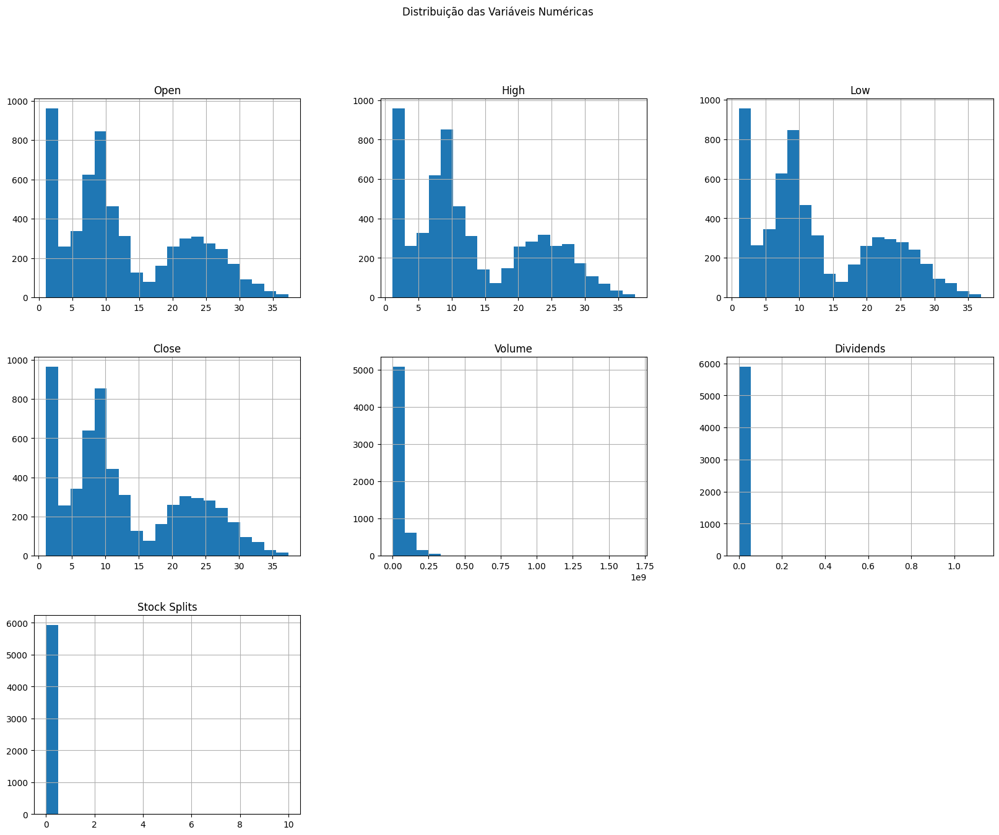

In [9]:
numeric_columns = df.columns.drop(['Date'])

# Plotando histogramas para as principais variáveis
df[numeric_columns].hist(bins=20, figsize=(20, 15))
plt.suptitle('Distribuição das Variáveis Numéricas')
plt.show()

### 1. Linha do Tempo de Preços (Time Series Plot)
Objetivo: Visualizar a evolução dos preços de abertura, fechamento, máxima e mínima ao longo do tempo.

Descrição: Um gráfico de linha onde o eixo X representa o tempo (Date) e o eixo Y representa os preços. É útil para identificar tendências de longo prazo, ciclos sazonais e volatilidade.

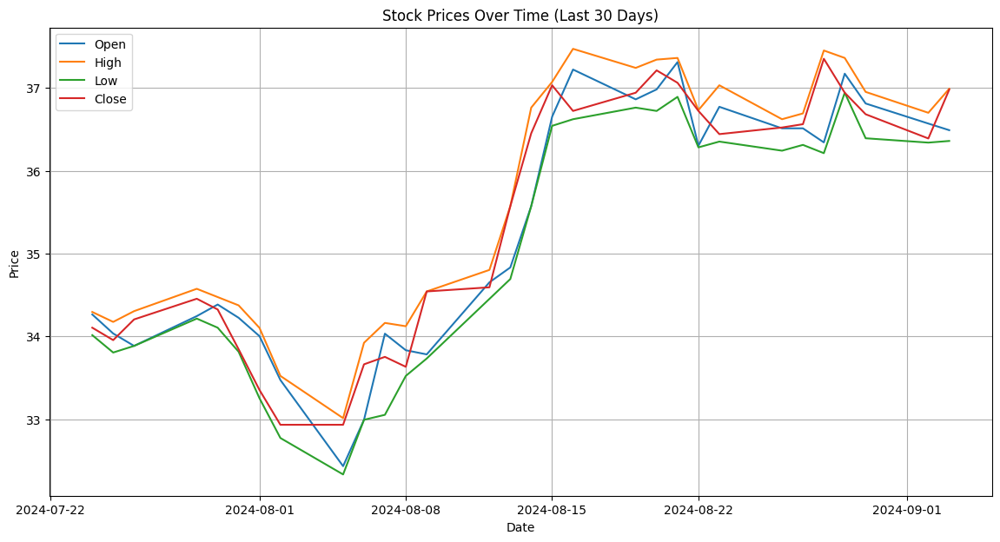

In [10]:
import matplotlib.pyplot as plt

# Seleciona as últimas 30 linhas
df_last_30 = df.tail(30)

plt.figure(figsize=(14, 7))
plt.plot(df_last_30['Date'], df_last_30['Open'], label='Open')
plt.plot(df_last_30['Date'], df_last_30['High'], label='High')
plt.plot(df_last_30['Date'], df_last_30['Low'], label='Low')
plt.plot(df_last_30['Date'], df_last_30['Close'], label='Close')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Stock Prices Over Time (Last 30 Days)')
plt.legend()
plt.grid(True)
plt.show()

### 2. Volume de Negociação (Bar Plot)

Objetivo: Visualizar o volume de negociação ao longo do tempo.

Descrição: Um gráfico de barras pode mostrar o volume de negociações diário. Ele ajuda a entender o interesse do mercado em determinados períodos, como durante altos ou baixos pronunciados nos preços.

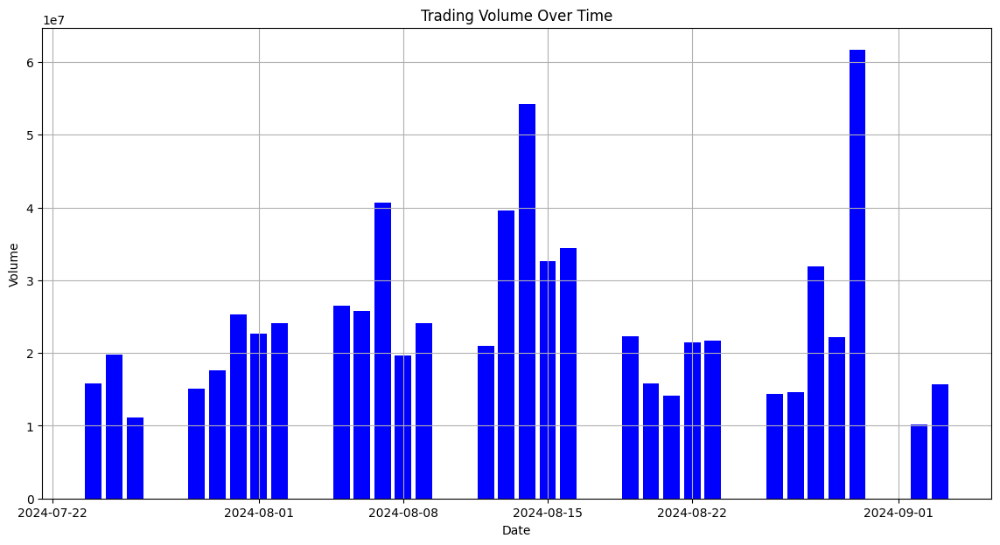

In [11]:
plt.figure(figsize=(14, 7))
plt.bar(df_last_30['Date'], df_last_30['Volume'], color='blue')
plt.xlabel('Date')
plt.ylabel('Volume')
plt.title('Trading Volume Over Time')
plt.grid(True)
plt.show()

### 3. Boxplot de Preços Diários

Objetivo: Comparar a distribuição dos preços de abertura, fechamento, alta e baixa.

Descrição: Um boxplot pode ser usado para cada uma dessas colunas, destacando a mediana, quartis e possíveis outliers. É útil para entender a variação dos preços e a presença de outliers.

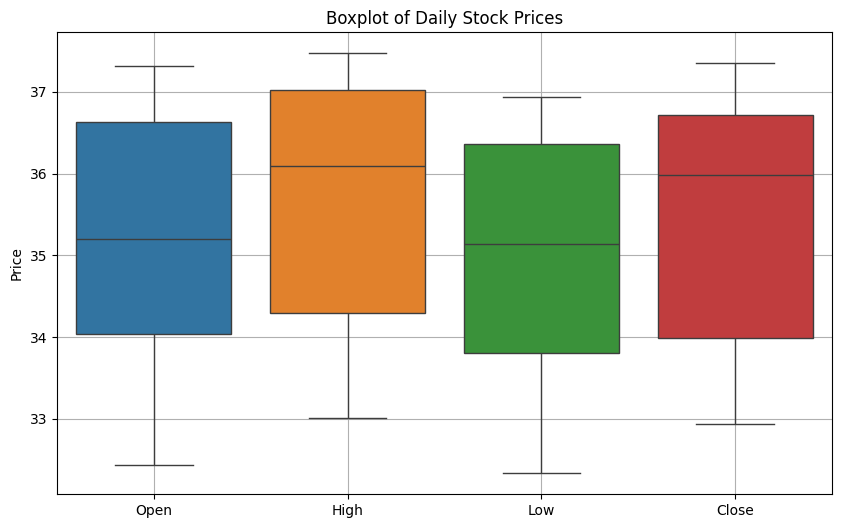

In [12]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.boxplot(data=df_last_30[['Open', 'High', 'Low', 'Close']])
plt.title('Boxplot of Daily Stock Prices')
plt.ylabel('Price')
plt.grid(True)
plt.show()

### 4. Gráfico de Velas (Candlestick Chart)

Objetivo: Visualizar a variação diária dos preços de uma ação, incluindo abertura, fechamento, alta e baixa.

Descrição: Cada "vela" representa um dia de negociação, com a parte superior e inferior do corpo da vela mostrando os preços de abertura e fechamento, e as sombras (linhas finas) representando os preços alto e baixo. Este gráfico é amplamente utilizado em análises técnicas.

In [13]:
fig = go.Figure(data=[go.Candlestick(x=df_last_30['Date'],
                                     open=df_last_30['Open'],
                                     high=df_last_30['High'],
                                     low=df_last_30['Low'],
                                     close=df_last_30['Close'])])

fig.update_layout(title='Candlestick Chart of Stock Prices (Last 30 Days)',
                  xaxis_title='Date',
                  yaxis_title='Price',
                  xaxis_rangeslider_visible=False)  # Remove o range slider para focar nas últimas 30 linhas

fig.show()


### 5. Correlação entre Variáveis (Heatmap)

Objetivo: Identificar relações entre diferentes variáveis, como preços e volumes.

Descrição: Um mapa de calor (heatmap) pode ser usado para visualizar a correlação entre diferentes colunas (Open, High, Low, Close, Volume). É útil para ver se há colunas que estão fortemente correlacionadas, o que pode influenciar a modelagem futura.

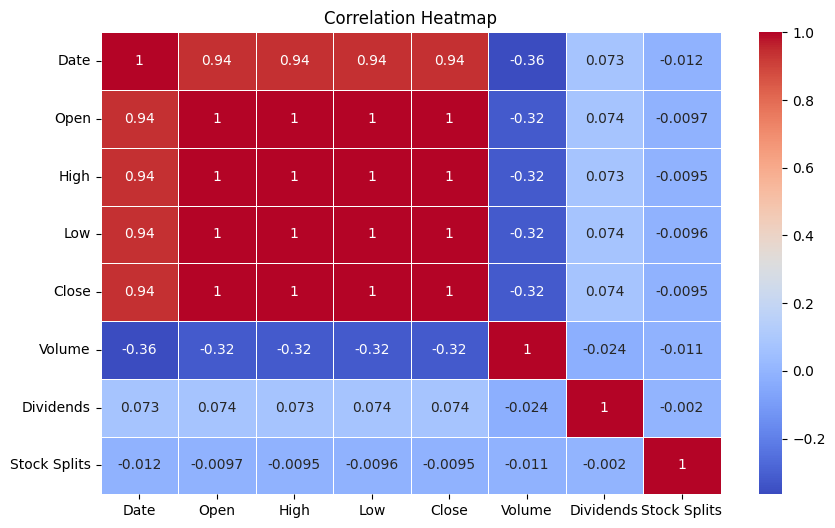

In [14]:
plt.figure(figsize=(10, 6))
corr = df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [15]:
dividends_above_zero_count = (df['Dividends'] > 0).sum()
stock_splits_above_zero_count = (df['Stock Splits'] > 0).sum()

print(f"Quantidade de dividendos maiores que 0: {dividends_above_zero_count}")
print(f"Quantidade de stock splits maiores que 0: {stock_splits_above_zero_count}")

total_days = len(df)
dividends_percentage = (dividends_above_zero_count / total_days) * 100
stock_splits_percentage = (stock_splits_above_zero_count / total_days) * 100

print(f"Porcentagem de dias com dividendos: {dividends_percentage:.2f}%")
print(f"Porcentagem de dias com stock splits: {stock_splits_percentage:.2f}%")

Quantidade de dividendos maiores que 0: 219
Quantidade de stock splits maiores que 0: 10
Porcentagem de dias com dividendos: 3.68%
Porcentagem de dias com stock splits: 0.17%


In [16]:
# Filtrar linhas onde 'Dividends' é maior que 0
dividends_above_zero_df = df[df['Dividends'] > 0]

# Filtrar linhas onde 'Stock Splits' é maior que 0
stock_splits_above_zero_df = df[df['Stock Splits'] > 0]

# Exibir as primeiras 10 linhas onde 'Dividends' é maior que 0
print("Primeiras 10 linhas com 'Dividends' acima de 0:")
print(dividends_above_zero_df.tail(10))

# Exibir as primeiras 10 linhas onde 'Stock Splits' é maior que 0
print("\nPrimeiras 10 linhas com 'Stock Splits' acima de 0:")
print(stock_splits_above_zero_df.tail(10))

Primeiras 10 linhas com 'Dividends' acima de 0:
                          Date       Open       High        Low      Close  \
5808 2024-02-22 00:00:00-03:00  34.058805  34.088249  33.528782  33.528782   
5814 2024-03-01 00:00:00-03:00  33.506945  33.654251  33.300719  33.457844   
5829 2024-03-22 00:00:00-03:00  33.724071  33.822971  33.239475  33.348263   
5834 2024-04-01 00:00:00-03:00  34.216218  34.424007  33.078314  33.088207   
5856 2024-05-02 00:00:00-03:00  31.601984  31.790092  31.205970  31.483179   
5877 2024-06-03 00:00:00-03:00  30.867113  31.352507  30.797772  31.154388   
5891 2024-06-21 00:00:00-03:00  31.830723  32.130260  31.591094  31.830723   
5897 2024-07-01 00:00:00-03:00  32.347566  32.627284  32.137773  32.207706   
5920 2024-08-01 00:00:00-03:00  34.003639  34.103590  33.254000  33.353951   
5942 2024-09-02 00:00:00-03:00  36.570000  36.700001  36.340000  36.389999   

        Volume  Dividends  Stock Splits  
5808  21460700   1.125125           0.0  
5814  145

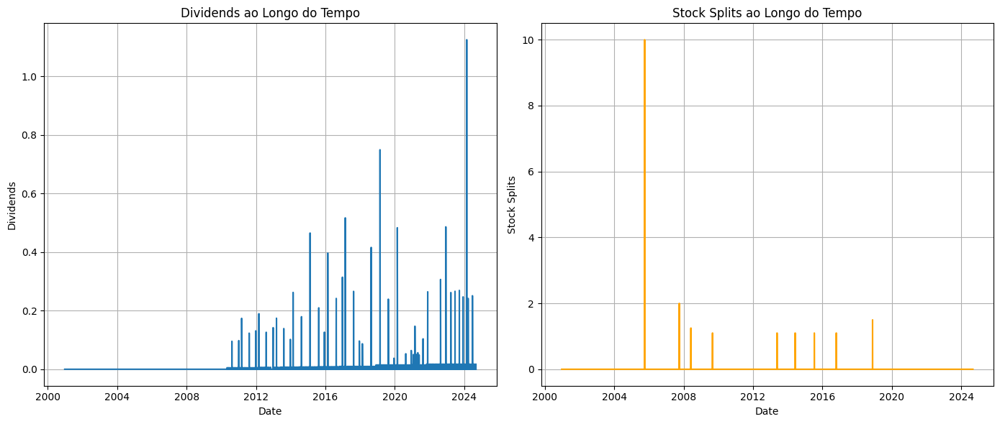

In [17]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(df['Date'], df['Dividends'], label='Dividends')
plt.title('Dividends ao Longo do Tempo')
plt.xlabel('Date')
plt.ylabel('Dividends')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(df['Date'], df['Stock Splits'], label='Stock Splits', color='orange')
plt.title('Stock Splits ao Longo do Tempo')
plt.xlabel('Date')
plt.ylabel('Stock Splits')
plt.grid(True)

plt.tight_layout()
plt.show()

# 3. Preparação dos Dados

### Retorno Diário (daily_return)

Descrição: A variação percentual do preço de fechamento entre dias consecutivos.

Importância: O retorno diário é um indicador básico de performance da ação, utilizado amplamente em modelos de previsão financeira.

In [18]:
df['daily_return'] = df['Close'].pct_change()

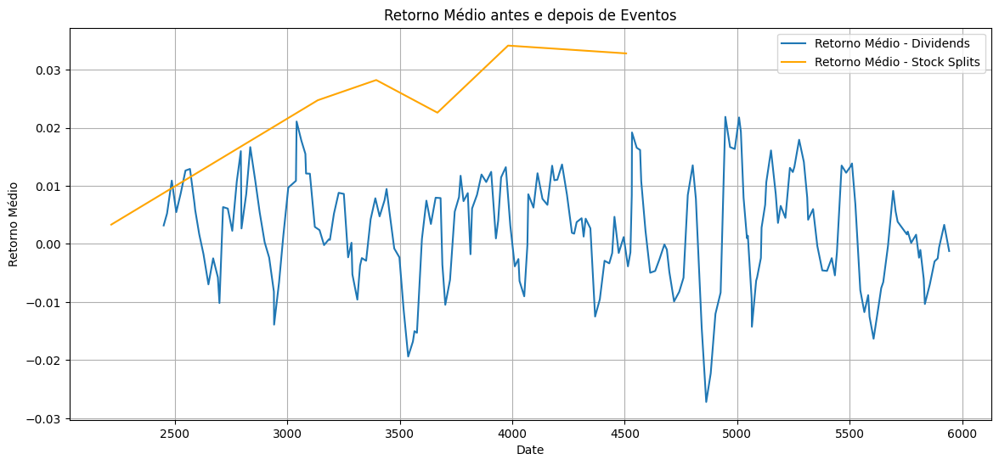

In [19]:
df['Dividend_Event'] = df['Dividends'] > 0
df['Stock_Split_Event'] = df['Stock Splits'] > 0

dividend_event_returns = df[df['Dividend_Event']]['daily_return'].rolling(window=5).mean()
stock_split_event_returns = df[df['Stock_Split_Event']]['daily_return'].rolling(window=5).mean()

plt.figure(figsize=(14, 6))

plt.plot(dividend_event_returns.index, dividend_event_returns, label='Retorno Médio - Dividends')
plt.plot(stock_split_event_returns.index, stock_split_event_returns, label='Retorno Médio - Stock Splits', color='orange')
plt.title('Retorno Médio antes e depois de Eventos')
plt.xlabel('Date')
plt.ylabel('Retorno Médio')
plt.legend()
plt.grid(True)
plt.show()

Objetivo: Analisar a distribuição dos retornos diários.

Descrição: Um histograma mostrando os retornos diários calculados com base nos preços de fechamento. Ajuda a entender a volatilidade e a tendência de retornos negativos ou positivos.

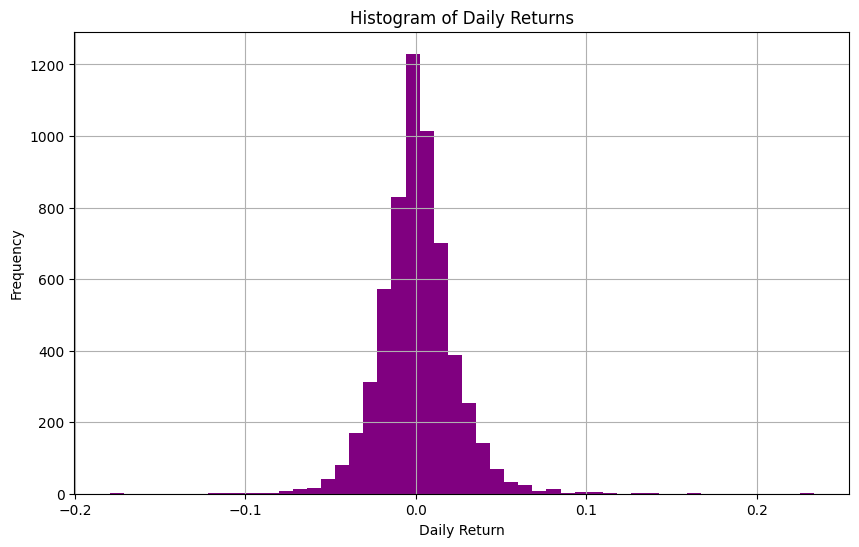

In [20]:
plt.figure(figsize=(10, 6))
plt.hist(df['daily_return'].dropna(), bins=50, color='purple')
plt.xlabel('Daily Return')
plt.ylabel('Frequency')
plt.title('Histogram of Daily Returns')
plt.grid(True)
plt.show()

### Diferença entre Fechamento e Abertura (close_open_diff)

Descrição: A diferença entre o preço de fechamento e o preço de abertura de um dia.

Importância: Isso pode indicar o movimento intradiário do preço da ação. Uma diferença positiva pode sugerir uma tendência de alta durante o dia, enquanto uma diferença negativa pode indicar uma tendência de baixa.

In [21]:
df['close_open_diff'] = df['Close'] - df['Open']

Objetivo: Identificar a direção e a magnitude da mudança de preço ao longo do dia.

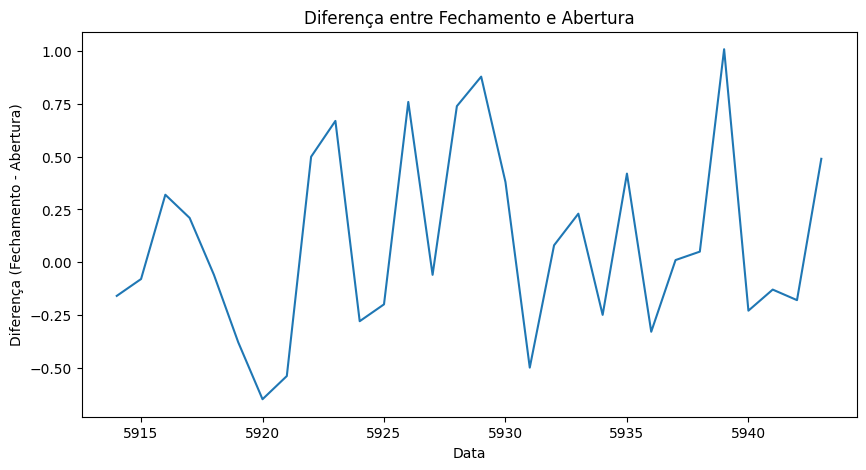

In [22]:
# Seleciona as últimas 30 linhas
df_last_30 = df.tail(30)

plt.figure(figsize=(10, 5))
df_last_30['close_open_diff'].plot()
plt.title('Diferença entre Fechamento e Abertura')
plt.xlabel('Data')
plt.ylabel('Diferença (Fechamento - Abertura)')
plt.show()

### Amplitude do Dia (high_low_diff)

Descrição: A diferença entre o preço máximo e mínimo do dia.

Importância: A amplitude (volatilidade) do dia pode ser um indicador da incerteza ou volatilidade do mercado, que é um fator importante para prever movimentos futuros.

In [23]:
df['high_low_diff'] = df['High'] - df['Low']

Objetivo: Capturar a volatilidade intradiária.

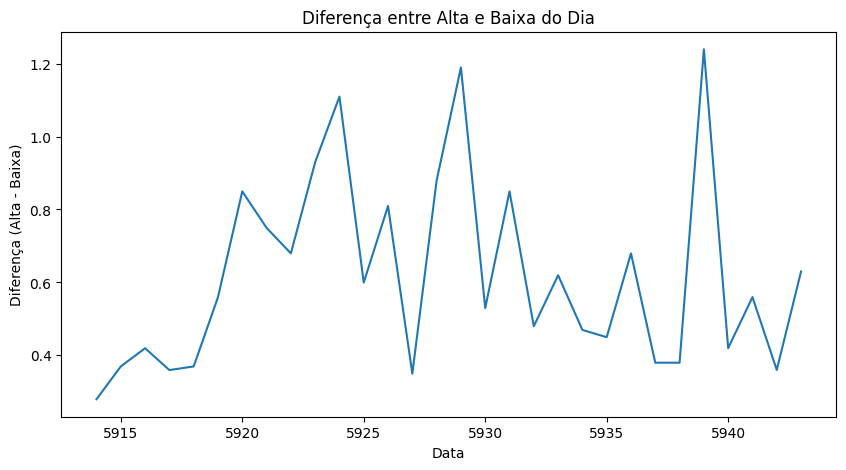

In [24]:
# Seleciona as últimas 30 linhas
df_last_30 = df.tail(30)

plt.figure(figsize=(10, 5))
df_last_30['high_low_diff'].plot()
plt.title('Diferença entre Alta e Baixa do Dia')
plt.xlabel('Data')
plt.ylabel('Diferença (Alta - Baixa)')
plt.show()

### Média Móvel Simples de 7 dias (SMA_7)

Descrição: A média móvel simples dos últimos 7 dias de preços de fechamento.

Importância: As médias móveis ajudam a suavizar o preço ao longo do tempo, permitindo identificar tendências subjacentes. A média móvel de 7 dias captura tendências de curto prazo.

In [25]:
df['SMA_7'] = df['Close'].rolling(window=7).mean()

Objetivo: Identificar tendências de curto prazo.

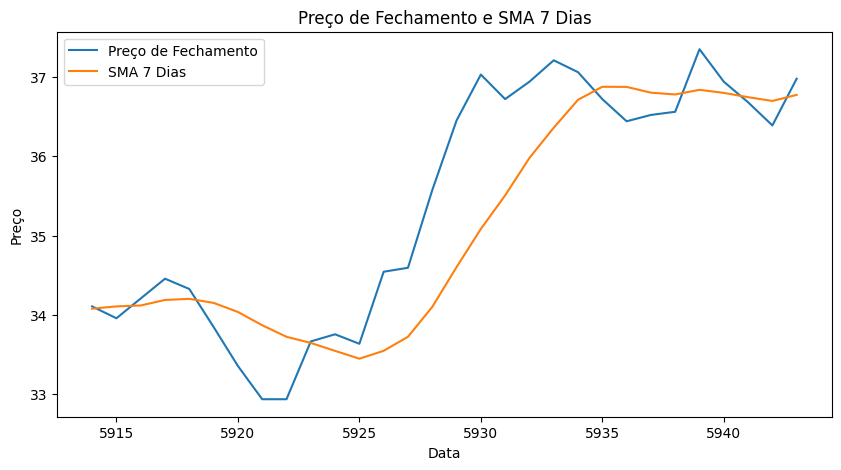

In [26]:
# Seleciona as últimas 30 linhas
df_last_30 = df.tail(30)

plt.figure(figsize=(10, 5))
df_last_30['Close'].plot(label='Preço de Fechamento')
df_last_30['SMA_7'].plot(label='SMA 7 Dias')
plt.title('Preço de Fechamento e SMA 7 Dias')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.legend()
plt.show()

### Média Móvel Simples de 21 dias (SMA_21)

Descrição: A média móvel simples dos últimos 21 dias de preços de fechamento.
    
Importância: Captura tendências de médio prazo. Comparar SMA de curto e médio prazo pode ajudar a identificar cruzamentos de médias móveis, um sinal comum usado em estratégias de trading.

In [27]:
df['SMA_21'] = df['Close'].rolling(window=21).mean()

Objetivo: Identificar tendências de médio prazo.

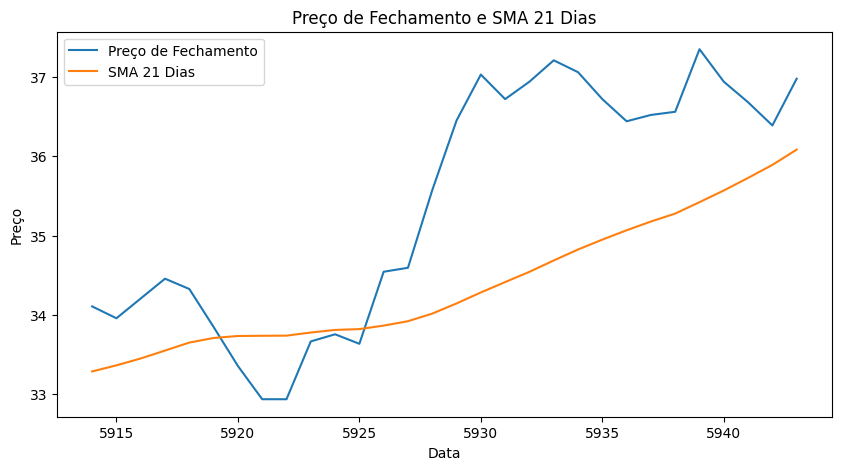

In [28]:
# Seleciona as últimas 30 linhas
df_last_30 = df.tail(30)

plt.figure(figsize=(10, 5))
df_last_30['Close'].plot(label='Preço de Fechamento')
df_last_30['SMA_21'].plot(label='SMA 21 Dias')
plt.title('Preço de Fechamento e SMA 21 Dias')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.legend()
plt.show()

### Desvio Padrão de 7 dias (STD_7)

Descrição: O desvio padrão dos últimos 7 dias de preços de fechamento.

Importância: O desvio padrão mede a volatilidade do preço. Um alto desvio padrão indica alta volatilidade, enquanto um baixo desvio padrão sugere estabilidade no preço.

In [29]:
df['STD_7'] = df['Close'].rolling(window=7).std()

Objetivo: Medir a volatilidade de curto prazo.

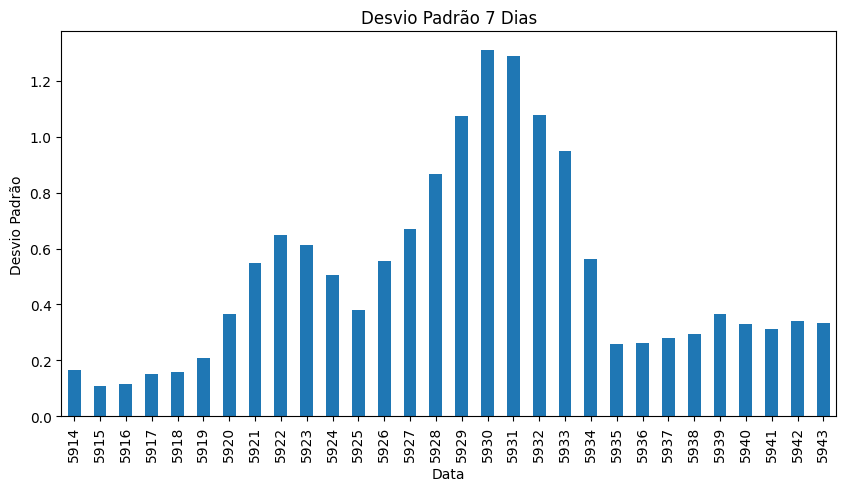

In [30]:
# Seleciona as últimas 30 linhas
df_last_30 = df.tail(30)

plt.figure(figsize=(10, 5))
df_last_30['STD_7'].plot(kind='bar')
plt.title('Desvio Padrão 7 Dias')
plt.xlabel('Data')
plt.ylabel('Desvio Padrão')
plt.show()

### Indicador de Tendência (trend_indicator)

Descrição: Uma coluna binária que indica se o fechamento foi maior que a abertura (1) ou menor (0).

Importância: Esse indicador simples pode ajudar o modelo a identificar padrões de tendência.

In [31]:
df['trend_indicator'] = (df['Close'] > df['Open']).astype(int)

Objetivo: Identificar a direção geral do mercado.

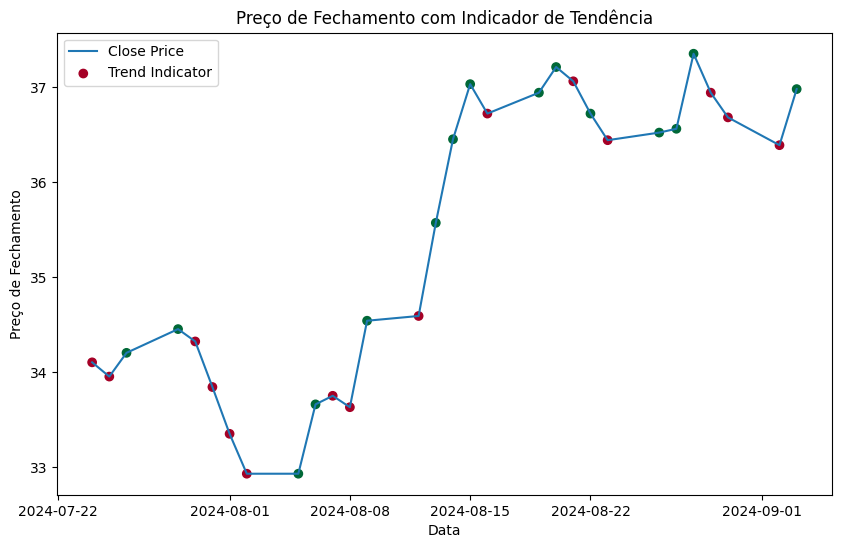

In [32]:
# Seleciona as últimas 30 linhas
df_last_30 = df.tail(30)

plt.figure(figsize=(10, 6))
plt.plot(df_last_30['Date'], df_last_30['Close'], label='Close Price')
plt.scatter(df_last_30['Date'], df_last_30['Close'], c=df_last_30['trend_indicator'], cmap='RdYlGn', label='Trend Indicator')
plt.title('Preço de Fechamento com Indicador de Tendência')
plt.xlabel('Data')
plt.ylabel('Preço de Fechamento')
plt.legend()
plt.show()

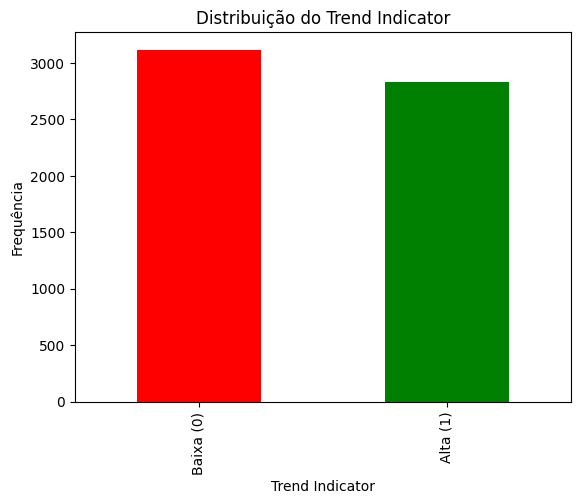

In [33]:
import matplotlib.pyplot as plt

df['trend_indicator'].value_counts().plot(kind='bar', color=['red', 'green'])
plt.title('Distribuição do Trend Indicator')
plt.xlabel('Trend Indicator')
plt.ylabel('Frequência')
plt.xticks([0, 1], ['Baixa (0)', 'Alta (1)'])
plt.show()

### Preço Médio do Dia (daily_avg_price)

Descrição: A média entre o preço de abertura, fechamento, máximo e mínimo do dia.

Importância: Representa uma média ponderada do preço, oferecendo uma visão mais completa do comportamento do preço durante o dia.

In [34]:
df['daily_avg_price'] = (df['Open'] + df['Close'] + df['High'] + df['Low']) / 4

Objetivo: Fornecer uma visão mais suavizada do preço diário.

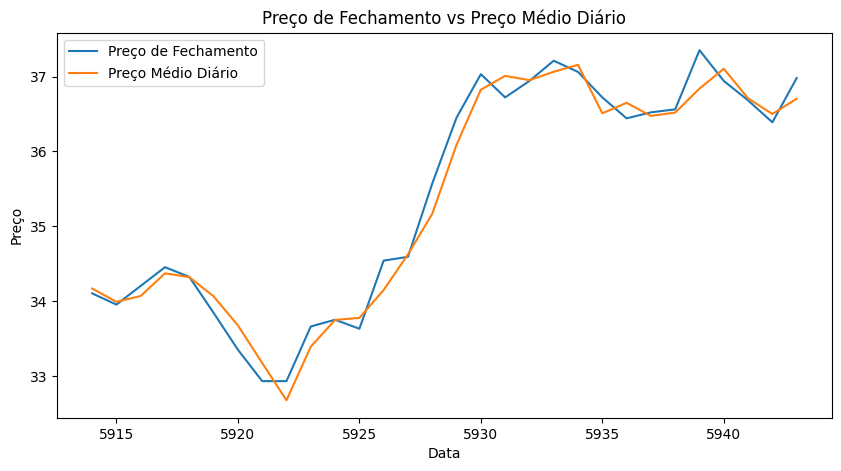

In [35]:
# Seleciona as últimas 30 linhas
df_last_30 = df.tail(30)

plt.figure(figsize=(10, 5))
df_last_30['Close'].plot(label='Preço de Fechamento')
df_last_30['daily_avg_price'].plot(label='Preço Médio Diário')
plt.title('Preço de Fechamento vs Preço Médio Diário')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.legend()
plt.show()

### Retorno Acumulado (cumulative_return)

Descrição: O retorno acumulado ao longo do tempo, calculado como o produto dos retornos diários.

Importância: Esse campo mostra o crescimento percentual do investimento ao longo do período, útil para análise de longo prazo.

In [36]:
df['cumulative_return'] = (1 + df['daily_return']).cumprod() - 1

Objetivo: Avaliar o desempenho total da ação desde o início do período.

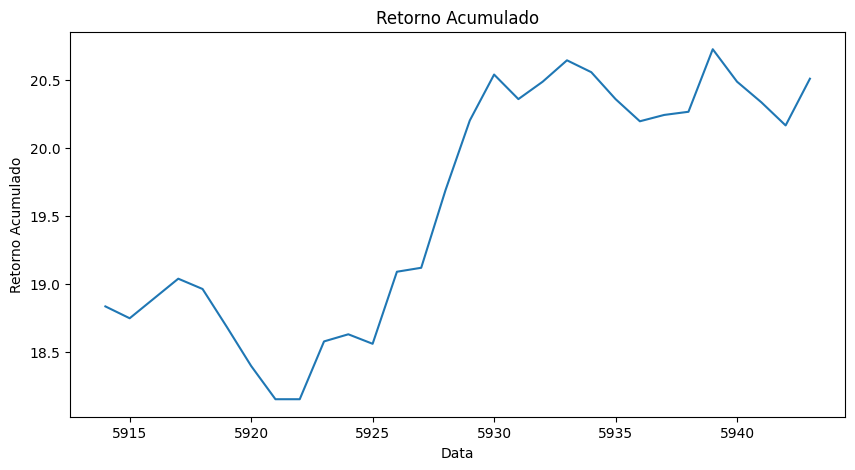

In [37]:
# Seleciona as últimas 30 linhas
df_last_30 = df.tail(30)

plt.figure(figsize=(10, 5))
df_last_30['cumulative_return'].plot()
plt.title('Retorno Acumulado')
plt.xlabel('Data')
plt.ylabel('Retorno Acumulado')
plt.show()

### Volume Médio de 7 dias (volume_avg_7)

Descrição: A média do volume de negociação dos últimos 7 dias.

Importância: Volume é um indicador chave para analisar a força de um movimento de preço. Um movimento de preço acompanhado por alto volume é considerado mais forte.

In [38]:
df['volume_avg_7'] = df['Volume'].rolling(window=7).mean()

Objetivo: Avaliar o volume de negociações recente.

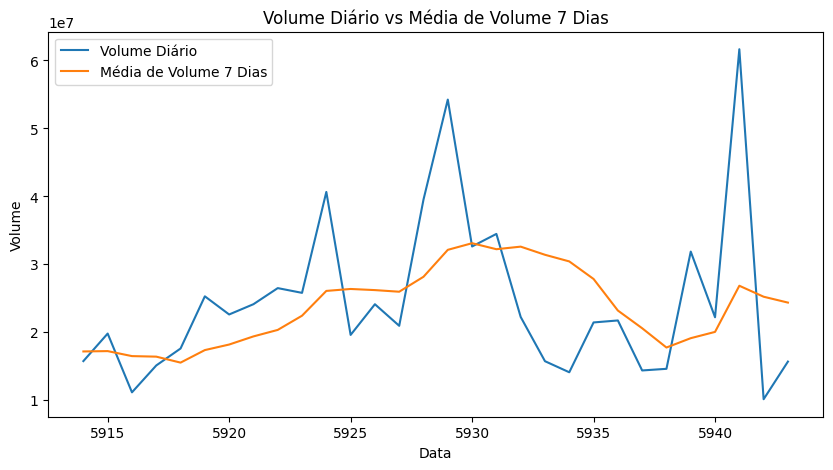

In [39]:
# Seleciona as últimas 30 linhas
df_last_30 = df.tail(30)

plt.figure(figsize=(10, 5))
df_last_30['Volume'].plot(label='Volume Diário')
df_last_30['volume_avg_7'].plot(label='Média de Volume 7 Dias')
plt.title('Volume Diário vs Média de Volume 7 Dias')
plt.xlabel('Data')
plt.ylabel('Volume')
plt.legend()
plt.show()

### Média Móvel Curta (short_moving_average)

Descrição: A média móvel curta é a média dos preços de fechamento ao longo de um curto período (e.g., 5 dias).

Importância: As médias móveis curtas são cruciais para detectar mudanças rápidas no mercado, ajudando os modelos a capturar reversões de tendência ou confirmações de direção em períodos mais curtos.

In [40]:
df['short_moving_average'] = df['Close'].rolling(window=5).mean()

Objetivo: Identificar tendências de curto prazo.

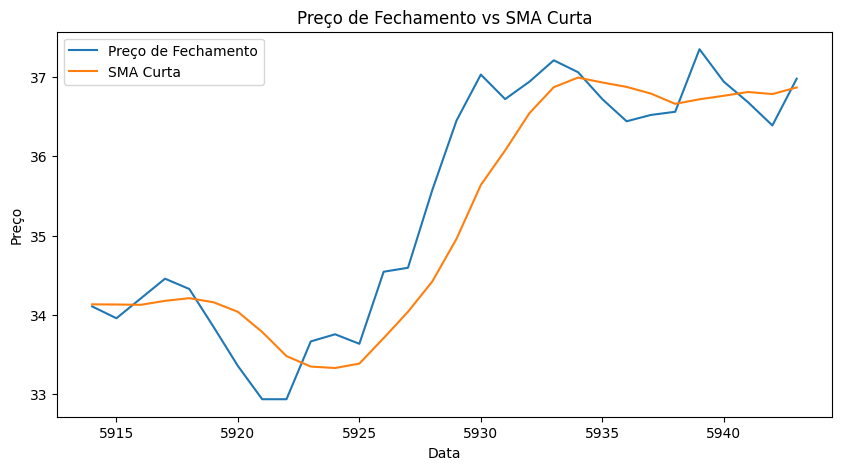

In [41]:
# Seleciona as últimas 30 linhas
df_last_30 = df.tail(30)

plt.figure(figsize=(10, 5))
df_last_30['Close'].plot(label='Preço de Fechamento')
df_last_30['short_moving_average'].plot(label='SMA Curta')
plt.title('Preço de Fechamento vs SMA Curta')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.legend()
plt.show()

### Média Móvel Longa (long_moving_average)

Descrição: A média móvel longa é a média dos preços de fechamento ao longo de um período mais longo (e.g., 20 dias).

Importância: As médias móveis longas ajudam a suavizar as flutuações de curto prazo, permitindo que os modelos se concentrem em tendências subjacentes mais estáveis e de longo prazo.



In [42]:
df['long_moving_average'] = df['Close'].rolling(window=20).mean()

Objetivo: Identificar tendências de longo prazo.

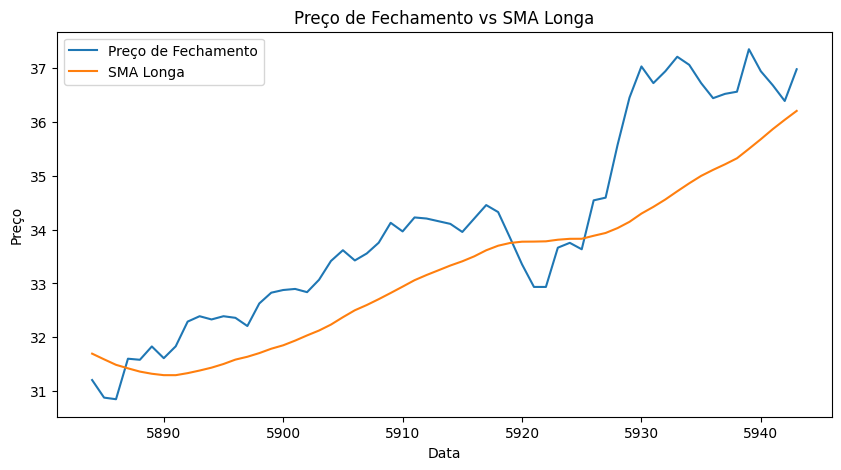

In [43]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(10, 5))
df_last_60['Close'].plot(label='Preço de Fechamento')
df_last_60['long_moving_average'].plot(label='SMA Longa')
plt.title('Preço de Fechamento vs SMA Longa')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.legend()
plt.show()

### Volatilidade (volatility)

Descrição: A volatilidade mede a dispersão dos retornos diários, calculada como o desvio padrão dos retornos diários ao longo de um período específico.

Importância: A volatilidade é um indicador-chave de risco, essencial para modelos que precisam avaliar a incerteza ou a probabilidade de grandes movimentos de preço, tanto para cima quanto para baixo.

In [44]:
df['volatility'] = df['daily_return'].rolling(window=20).std()

Objetivo: Avaliar a volatilidade da ação.

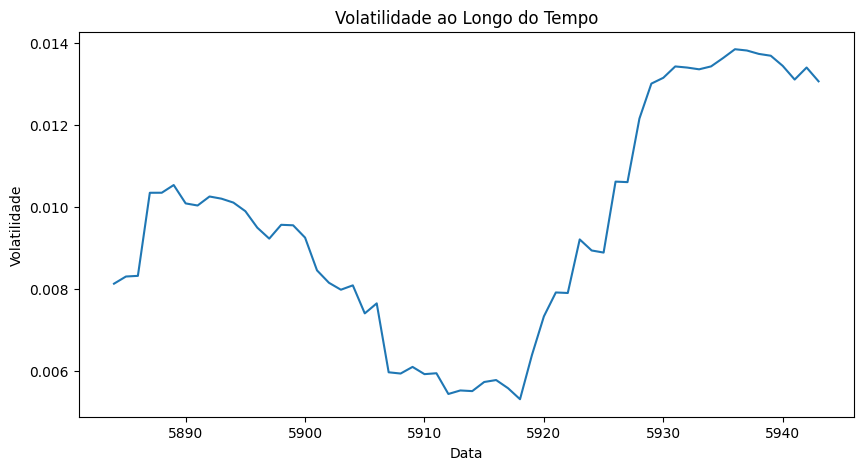

In [45]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(10, 5))
df_last_60['volatility'].plot()
plt.title('Volatilidade ao Longo do Tempo')
plt.xlabel('Data')
plt.ylabel('Volatilidade')
plt.show()

### Média Móvel Exponencial 12 Dias (ema_12)

Descrição: A Média Móvel Exponencial (EMA) é similar à média móvel simples, mas dá mais peso aos preços mais recentes.

Importância: A EMA permite que os modelos respondam mais rapidamente às mudanças nos preços, sendo crucial para prever movimentos de curto prazo com maior precisão.

In [46]:
df['ema_12'] = df['Close'].ewm(span=12, adjust=False).mean()

Objetivo: Identificar tendências de curto prazo.

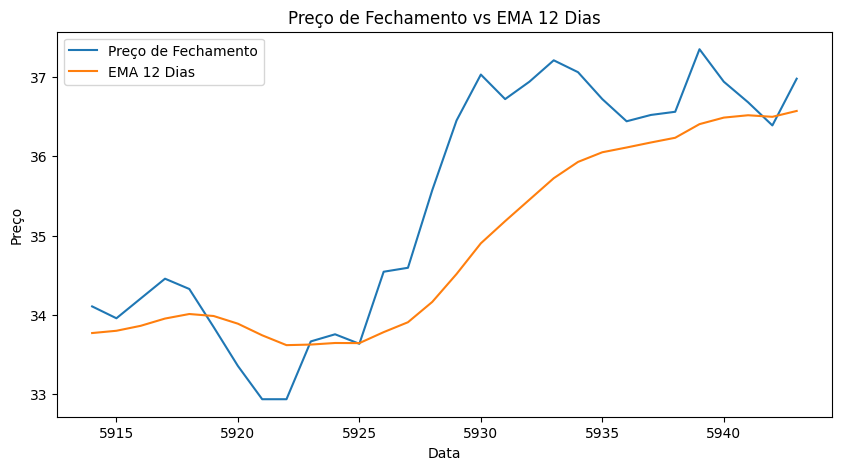

In [47]:
# Seleciona as últimas 30 linhas
df_last_30 = df.tail(30)

plt.figure(figsize=(10, 5))
df_last_30['Close'].plot(label='Preço de Fechamento')
df_last_30['ema_12'].plot(label='EMA 12 Dias')
plt.title('Preço de Fechamento vs EMA 12 Dias')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.legend()
plt.show()

### Média Móvel Exponencial 26 Dias (ema_26)

Descrição: A Média Móvel Exponencial (EMA) de 26 dias é utilizada para identificar tendências mais de longo prazo em comparação com a EMA de 12 dias.

Importância: A EMA de 26 dias ajuda os modelos a capturar as tendências de médio a longo prazo, mantendo uma sensibilidade às mudanças recentes, mas sem ser influenciada por ruídos de curto prazo.

In [48]:
df['ema_26'] = df['Close'].ewm(span=26, adjust=False).mean()

Objetivo: Identificar tendências de médio prazo.

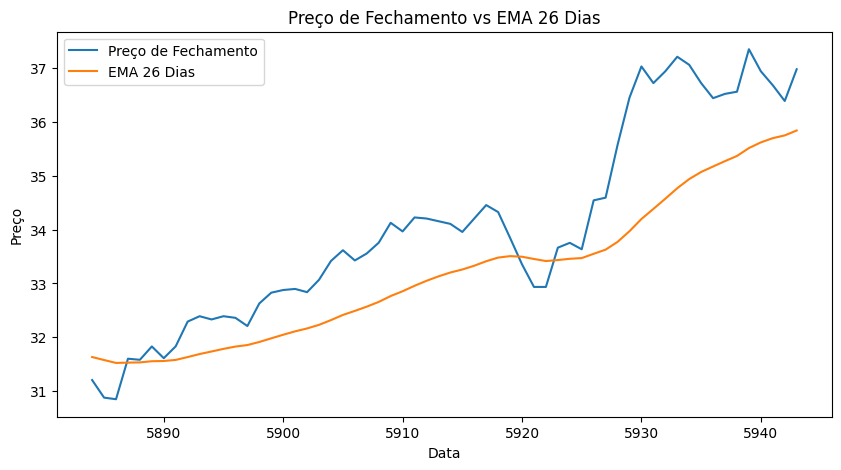

In [49]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(10, 5))
df_last_60['Close'].plot(label='Preço de Fechamento')
df_last_60['ema_26'].plot(label='EMA 26 Dias')
plt.title('Preço de Fechamento vs EMA 26 Dias')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.legend()
plt.show()

### Convergência/Divergência de Médias Móveis (macd)

Descrição: A Convergência/Divergência de Médias Móveis (MACD) é calculada subtraindo a EMA de 26 dias da EMA de 12 dias.

Importância: O MACD é um indicador amplamente utilizado para detectar mudanças no momento e na direção da tendência, sendo valioso para modelos que precisam prever quando uma tendência pode estar se revertendo.

In [50]:
df['macd'] = df['ema_12'] - df['ema_26']

### Linha de Sinal (signal_line)

Descrição: A linha de sinal é a EMA de 9 dias da linha MACD.

Importância: A linha de sinal refina as previsões baseadas no MACD, fornecendo pontos claros de entrada e saída que podem melhorar a precisão dos modelos ao tomar decisões de negociação.

In [51]:
df['signal_line'] = df['macd'].ewm(span=9, adjust=False).mean()

MACD e Signal Line

Descrição: O gráfico de MACD (Moving Average Convergence Divergence) e Signal Line é usado para identificar sinais de compra e venda em mercados financeiros. O MACD é calculado subtraindo a média móvel exponencial (EMA) de 26 dias da EMA de 12 dias. A Signal Line é a EMA de 9 dias do MACD.

Objetivo: O gráfico ajuda a identificar pontos de cruzamento entre o MACD e a Signal Line, que indicam potenciais pontos de entrada ou saída de uma operação. Um histograma pode ser adicionado para mostrar a diferença entre o MACD e a Signal Line, destacando a força do movimento.

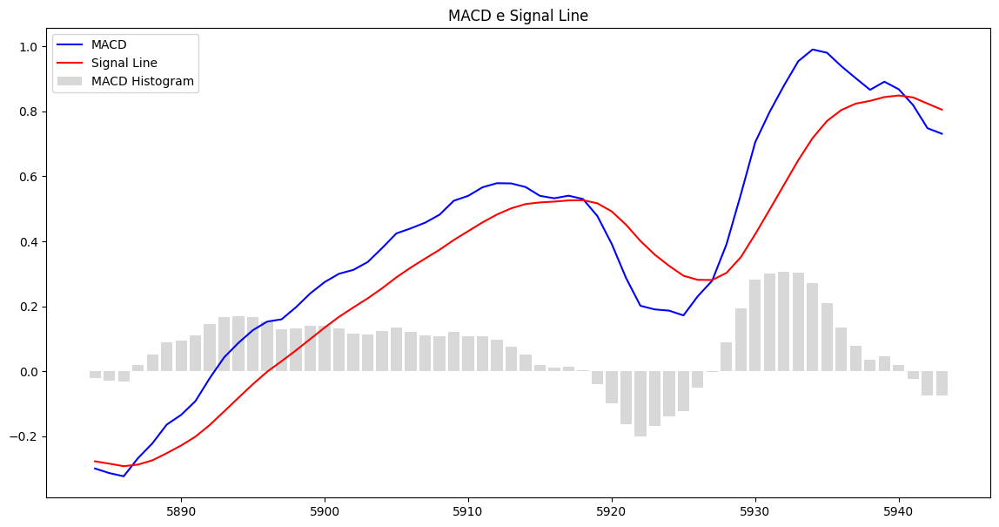

In [52]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['macd'], label='MACD', color='blue')
plt.plot(df_last_60['signal_line'], label='Signal Line', color='red')
plt.bar(df_last_60.index, df_last_60['macd'] - df_last_60['signal_line'], label='MACD Histogram', color='gray', alpha=0.3)
plt.title('MACD e Signal Line')
plt.legend(loc='upper left')
plt.show()

### Índice de Força Relativa (rsi)

Descrição: O Índice de Força Relativa (RSI) mede a magnitude dos ganhos recentes em comparação com as perdas recentes para avaliar condições de sobrecompra ou sobrevenda.

Importância: O RSI é essencial para detectar condições extremas de mercado, ajudando os modelos a identificar quando uma ação pode estar prestes a reverter sua direção devido a condições de sobrecompra ou sobrevenda.

In [53]:
delta = df['Close'].diff()
gain = (delta.where(delta > 0, 0)).rolling(window=20).mean()
loss = (-delta.where(delta < 0, 0)).rolling(window=20).mean()
rs = gain / loss
df['rsi'] = 100 - (100 / (1 + rs))

Descrição: O RSI (Índice de Força Relativa) é um indicador de momentum que mede a velocidade e a mudança dos movimentos de preço. Ele varia de 0 a 100 e é geralmente usado para identificar condições de sobrecompra ou sobrevenda.

Objetivo: O gráfico de RSI é utilizado para identificar quando um ativo está sobrecomprado (acima de 70) ou sobrevendido (abaixo de 30). Esses níveis podem sinalizar uma possível reversão de tendência.

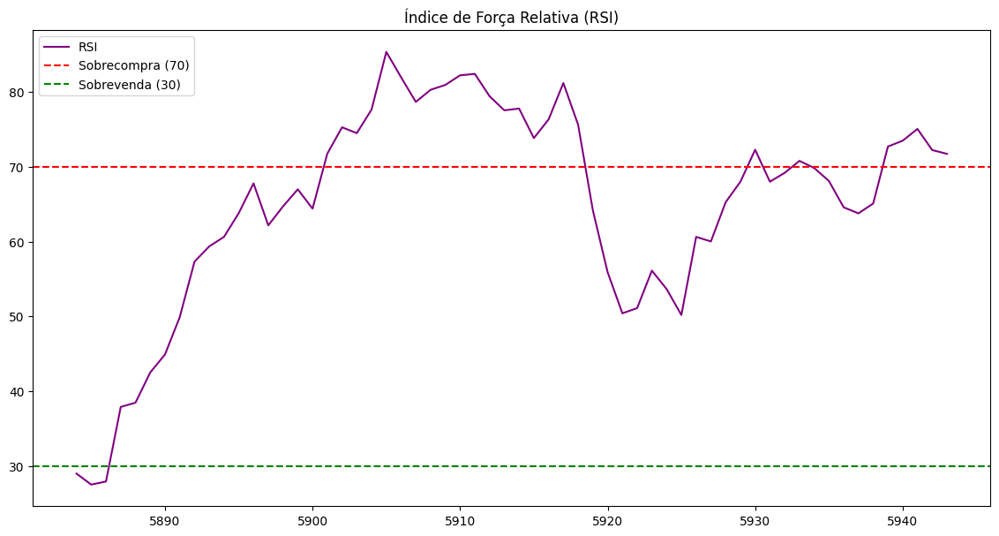

In [54]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['rsi'], label='RSI', color='purple')
plt.axhline(70, color='red', linestyle='--', label='Sobrecompra (70)')
plt.axhline(30, color='green', linestyle='--', label='Sobrevenda (30)')
plt.title('Índice de Força Relativa (RSI)')
plt.legend(loc='upper left')
plt.show()

### Banda de Bollinger Superior (bollinger_band_upper)

Descrição: A Banda de Bollinger superior é calculada como a média móvel simples de 20 dias mais duas vezes o desvio padrão dos preços de fechamento.

Importância: As bandas de Bollinger ajudam a identificar níveis de preço onde a ação pode encontrar resistência, auxiliando os modelos a prever reversões ou pausas em uma tendência de alta.

In [55]:
df['bollinger_band_upper'] = df['Close'].rolling(window=20).mean() + 2 * df['Close'].rolling(window=20).std()

### Banda de Bollinger Inferior (bollinger_band_lower)

Descrição: A Banda de Bollinger inferior é calculada como a média móvel simples de 20 dias menos duas vezes o desvio padrão dos preços de fechamento.

Importância: As bandas de Bollinger também ajudam a identificar níveis de suporte, onde os preços podem encontrar um piso, sendo útil para prever recuperações em mercados em baixa.

In [56]:
df['bollinger_band_lower'] = df['Close'].rolling(window=20).mean() - 2 * df['Close'].rolling(window=20).std()

Bollinger Bands (Upper & Lower)

Descrição: As Bollinger Bands consistem em uma média móvel simples (SMA) e duas bandas (superior e inferior) que representam desvio padrão acima e abaixo da SMA. Essas bandas se ajustam à volatilidade do mercado.

Objetivo: O gráfico de Bollinger Bands é usado para visualizar a volatilidade e potenciais pontos de reversão. Quando o preço se aproxima ou ultrapassa as bandas, isso pode indicar que o ativo está sobrecomprado ou sobrevendido.

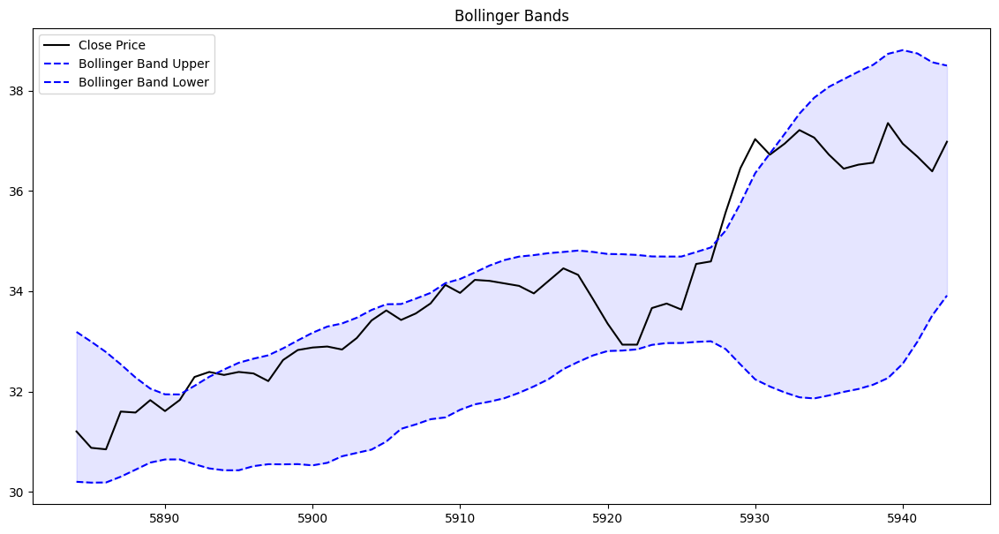

In [57]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Close'], label='Close Price', color='black')
plt.plot(df_last_60['bollinger_band_upper'], label='Bollinger Band Upper', color='blue', linestyle='--')
plt.plot(df_last_60['bollinger_band_lower'], label='Bollinger Band Lower', color='blue', linestyle='--')
plt.fill_between(df_last_60.index, df_last_60['bollinger_band_upper'], df_last_60['bollinger_band_lower'], color='blue', alpha=0.1)
plt.title('Bollinger Bands')
plt.legend(loc='upper left')
plt.show()

### Faixa Média Verdadeira (average_true_range)

Descrição: A Faixa Média Verdadeira (ATR) mede a volatilidade ao calcular a média das faixas verdadeiras diárias em um período específico.

Importância: O ATR fornece uma medida da volatilidade diária, essencial para modelos que precisam ajustar as previsões com base nas condições de mercado em constante mudança.

In [58]:
high_low = df['High'] - df['Low']
high_close = (df['High'] - df['Close'].shift()).abs()
low_close = (df['Low'] - df['Close'].shift()).abs()
true_range = high_low.combine(high_close, max).combine(low_close, max)
df['average_true_range'] = true_range.rolling(window=14).mean()

Descrição: O Average True Range (ATR) é um indicador de volatilidade que mede a amplitude média de oscilação de um ativo durante um período específico.

Objetivo: O gráfico de ATR é utilizado para avaliar a volatilidade do mercado. Um aumento no ATR indica maior volatilidade, enquanto uma diminuição sugere um mercado mais estável.

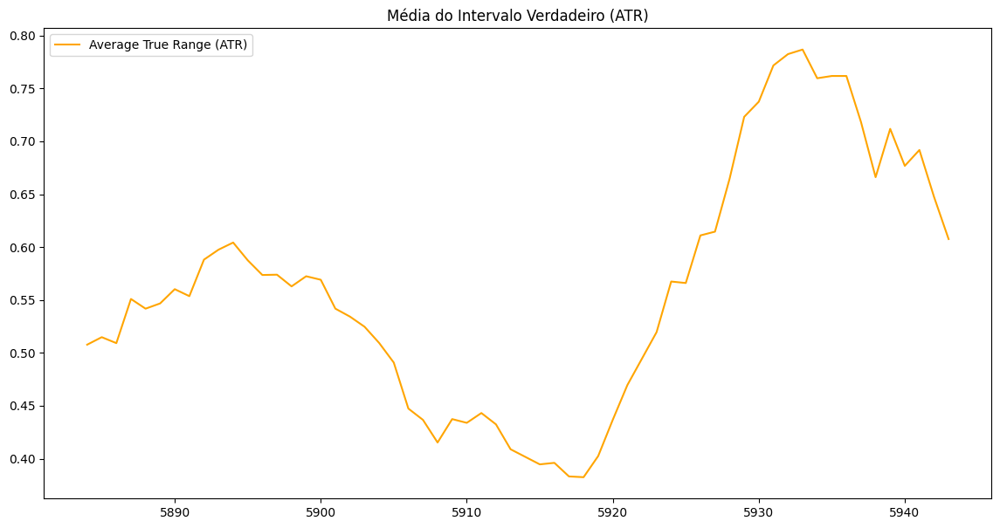

In [59]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['average_true_range'], label='Average True Range (ATR)', color='orange')
plt.title('Média do Intervalo Verdadeiro (ATR)')
plt.legend(loc='upper left')
plt.show()

### Convergência de Médias Móveis (moving_average_convergence)

Descrição: A Convergência de Médias Móveis (Moving Average Convergence) é um indicador técnico que reflete a diferença entre duas médias móveis de diferentes períodos.

Importância: Este indicador é valioso para detectar pontos de virada em uma tendência, ajudando os modelos a identificar quando uma nova tendência pode estar se formando.

In [60]:
df['moving_average_convergence'] = df['short_moving_average'] - df['long_moving_average']

Descrição: A Moving Average Convergence (MAC) compara duas médias móveis de preços, uma de curto e outra de longo prazo, para identificar a direção e a força de uma tendência.

Objetivo: O gráfico que mostra as médias móveis de curto e longo prazo junto com a convergência entre elas é útil para identificar mudanças de tendência e avaliar a força dessa tendência.

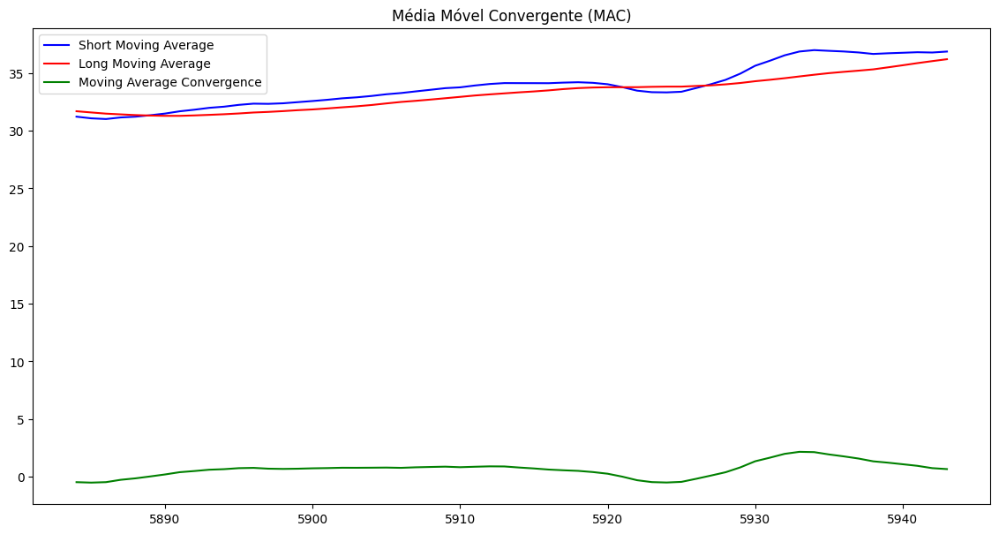

In [61]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['short_moving_average'], label='Short Moving Average', color='blue')
plt.plot(df_last_60['long_moving_average'], label='Long Moving Average', color='red')
plt.plot(df_last_60['moving_average_convergence'], label='Moving Average Convergence', color='green')
plt.title('Média Móvel Convergente (MAC)')
plt.legend(loc='upper left')
plt.show()

### Momento (momentum)

Descrição: O Momento mede a taxa de mudança no preço do ativo.

Importância: O momentum é crucial para prever a continuidade ou reversão de uma tendência, fornecendo aos modelos uma medida da força por trás dos movimentos de preço.

In [62]:
df['momentum'] = df['Close'] - df['Close'].shift(14)

Descrição: O Momentum é um indicador que mede a velocidade das mudanças de preço de um ativo. Ele é calculado como a diferença entre o preço atual e o preço de fechamento anterior.

Objetivo: O gráfico de Momentum é utilizado para identificar a força da tendência. Valores positivos indicam uma tendência de alta, enquanto valores negativos sugerem uma tendência de baixa.

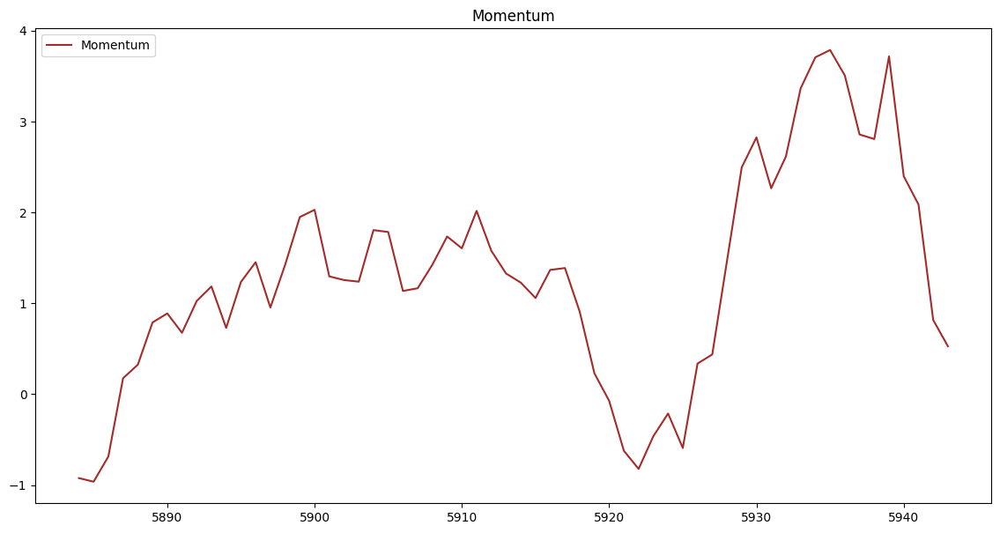

In [63]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['momentum'], label='Momentum', color='brown')
plt.title('Momentum')
plt.legend(loc='upper left')
plt.show()

### Average Directional Index (ADX)

Descrição: O ADX é um indicador de tendência que mede a força da tendência atual, sem indicar se a tendência é de alta ou baixa.

Objetivo: O ADX é útil para identificar se o mercado está em uma tendência forte (quando o ADX é maior que 20) ou em uma fase lateral (quando o ADX é menor que 20).

In [64]:
from ta.trend import ADXIndicator

adx = ADXIndicator(df['High'], df['Low'], df['Close'], window=14)
df['adx'] = adx.adx()

Descrição da Visualização:
O gráfico exibe o ADX junto com o preço de fechamento.

Objetivo:
O ADX é usado para medir a força de uma tendência. Um valor de ADX acima de 25 geralmente indica uma tendência forte, enquanto valores abaixo de 20 indicam uma tendência fraca ou um mercado lateral.

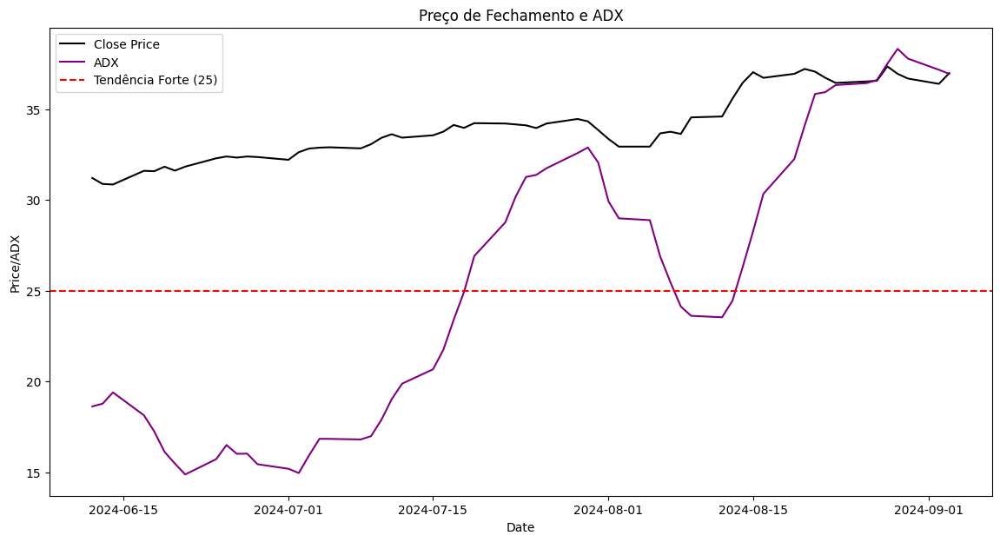

In [65]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['Close'], label='Close Price', color='black')
plt.plot(df_last_60['Date'], df_last_60['adx'], label='ADX', color='purple')
plt.axhline(y=25, color='red', linestyle='--', label='Tendência Forte (25)')
plt.title('Preço de Fechamento e ADX')
plt.xlabel('Date')
plt.ylabel('Price/ADX')
plt.legend()
plt.show()

### Commodity Channel Index (CCI)

Descrição: O CCI mede a variação do preço atual em relação à sua média móvel. É utilizado para identificar condições de sobrecompra ou sobrevenda.

Objetivo: Ajuda a identificar pontos de reversão de tendência e também pode ser usado para detectar divergências entre o preço e o indicador.

In [66]:
from ta.trend import CCIIndicator

cci = CCIIndicator(df['High'], df['Low'], df['Close'], window=20)
df['cci'] = cci.cci()

Descrição da Visualização:
Este gráfico mostra o CCI com a linha de preço de fechamento.

Objetivo:
O CCI é usado para identificar condições de sobrecompra e sobrevenda. Valores acima de +100 indicam sobrecompra, enquanto valores abaixo de -100 indicam sobrevenda.

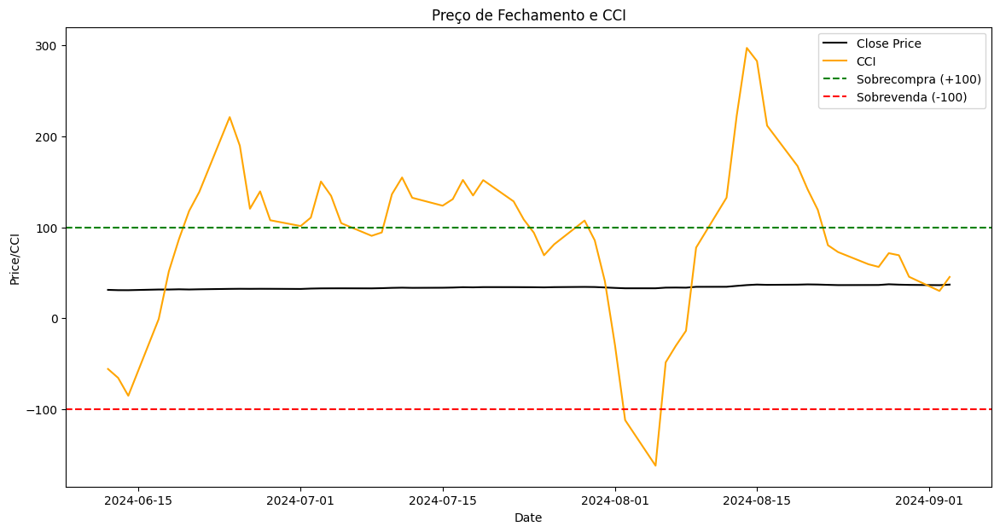

In [67]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['Close'], label='Close Price', color='black')
plt.plot(df_last_60['Date'], df_last_60['cci'], label='CCI', color='orange')
plt.axhline(y=100, color='green', linestyle='--', label='Sobrecompra (+100)')
plt.axhline(y=-100, color='red', linestyle='--', label='Sobrevenda (-100)')
plt.title('Preço de Fechamento e CCI')
plt.xlabel('Date')
plt.ylabel('Price/CCI')
plt.legend()
plt.show()

### Fibonacci Retracement Levels

Descrição: Os níveis de Fibonacci são baseados na sequência de Fibonacci e são usados para identificar possíveis níveis de suporte e resistência.

Objetivo: São frequentemente usados para prever reversões de preço em níveis específicos.

In [68]:
# Exemplo básico para calcular os níveis de Fibonacci
max_price = df['High'].max()
min_price = df['Low'].min()
difference = max_price - min_price

df['fib_23.6'] = max_price - difference * 0.236
df['fib_38.2'] = max_price - difference * 0.382
df['fib_50.0'] = max_price - difference * 0.5
df['fib_61.8'] = max_price - difference * 0.618
df['fib_100'] = min_price

Descrição da Visualização:
O gráfico exibe os níveis de retração de Fibonacci (23.6%, 38.2%, 50.0%, 61.8%, e 100%) sobrepostos ao preço de fechamento.

Objetivo:
Os níveis de retração de Fibonacci são usados para identificar possíveis níveis de suporte e resistência, que podem ser pontos de reversão de preços.

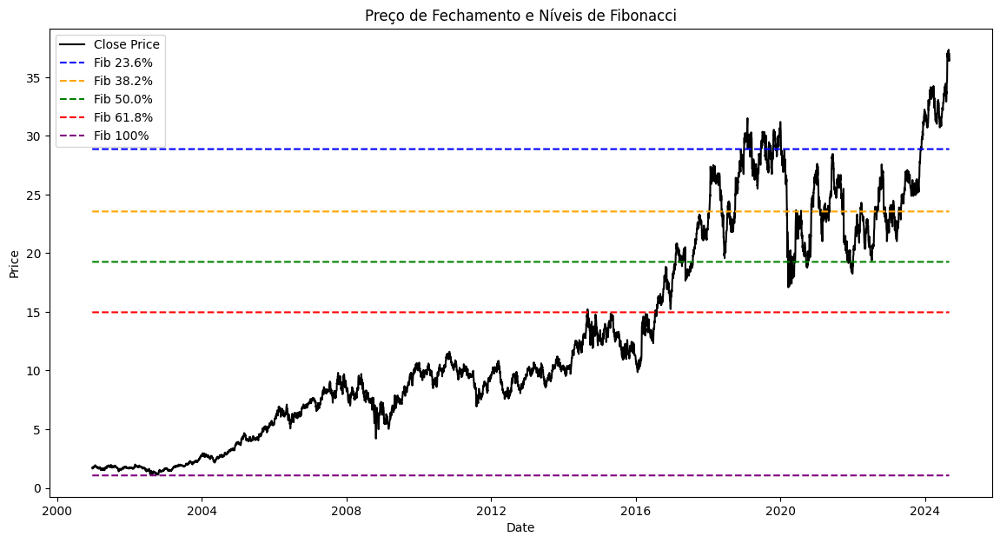

In [69]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['Close'], label='Close Price', color='black')
plt.plot(df['Date'], df['fib_23.6'], label='Fib 23.6%', linestyle='--', color='blue')
plt.plot(df['Date'], df['fib_38.2'], label='Fib 38.2%', linestyle='--', color='orange')
plt.plot(df['Date'], df['fib_50.0'], label='Fib 50.0%', linestyle='--', color='green')
plt.plot(df['Date'], df['fib_61.8'], label='Fib 61.8%', linestyle='--', color='red')
plt.plot(df['Date'], df['fib_100'], label='Fib 100%', linestyle='--', color='purple')
plt.title('Preço de Fechamento e Níveis de Fibonacci')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

### Williams %R

Descrição: O Williams %R é um indicador de momentum que mostra o nível de fechamento em relação à faixa alta/baixa nos últimos n períodos.

Objetivo: Similar ao RSI, ele é usado para identificar condições de sobrecompra ou sobrevenda.

In [70]:
from ta.momentum import WilliamsRIndicator

williams_r = WilliamsRIndicator(df['High'], df['Low'], df['Close'], lbp=14)
df['williams_r'] = williams_r.williams_r()

Descrição da Visualização:
Este gráfico mostra o indicador Williams %R com a linha de preço de fechamento.

Objetivo:
Williams %R é usado para identificar condições de sobrecompra e sobrevenda. Valores abaixo de -80 indicam sobrevenda, enquanto valores acima de -20 indicam sobrecompra.

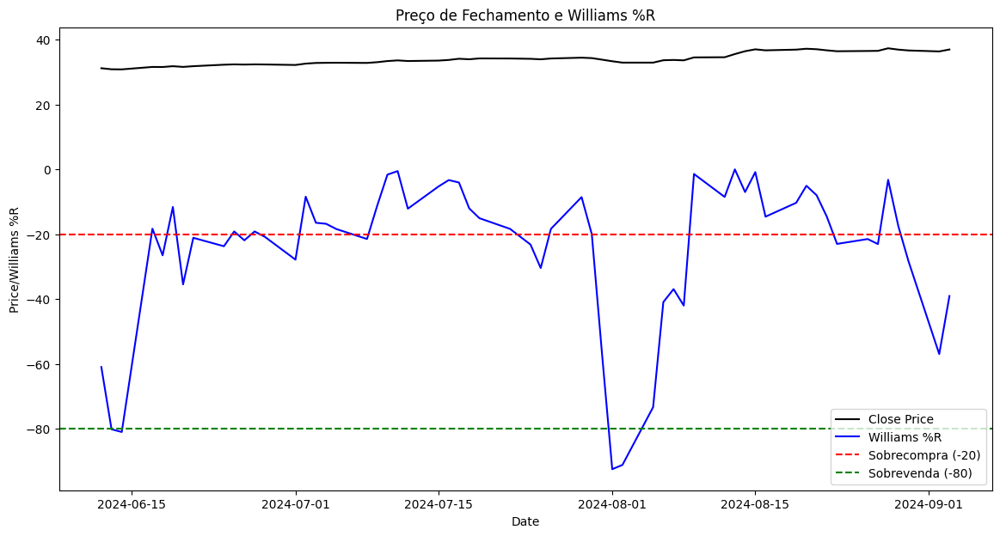

In [71]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['Close'], label='Close Price', color='black')
plt.plot(df_last_60['Date'], df_last_60['williams_r'], label='Williams %R', color='blue')
plt.axhline(y=-20, color='red', linestyle='--', label='Sobrecompra (-20)')
plt.axhline(y=-80, color='green', linestyle='--', label='Sobrevenda (-80)')
plt.title('Preço de Fechamento e Williams %R')
plt.xlabel('Date')
plt.ylabel('Price/Williams %R')
plt.legend()
plt.show()

### Chaikin Money Flow (CMF)

Descrição: O CMF mede a pressão de compra e venda ao comparar os preços de fechamento com as altas e baixas diárias, ponderados pelo volume.

Objetivo: É utilizado para confirmar tendências e detectar a força do movimento do preço.

In [72]:
from ta.volume import ChaikinMoneyFlowIndicator

cmf = ChaikinMoneyFlowIndicator(df['High'], df['Low'], df['Close'], df['Volume'], window=20)
df['cmf'] = cmf.chaikin_money_flow()

Descrição da Visualização:
O gráfico exibe o CMF com o preço de fechamento.

Objetivo:
O CMF mede o fluxo de dinheiro em uma ação ao longo do tempo. Valores positivos indicam pressão de compra, enquanto valores negativos indicam pressão de venda.

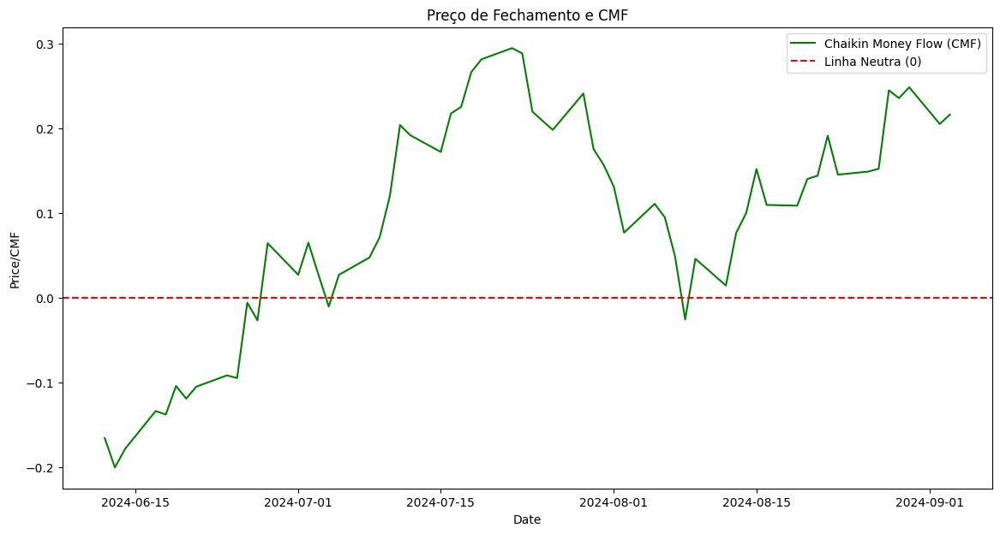

In [73]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
#plt.plot(df_last_60['Date'], df_last_60['Close'], label='Close Price', color='black')
plt.plot(df_last_60['Date'], df_last_60['cmf'], label='Chaikin Money Flow (CMF)', color='green')
plt.axhline(y=0, color='red', linestyle='--', label='Linha Neutra (0)')
plt.title('Preço de Fechamento e CMF')
plt.xlabel('Date')
plt.ylabel('Price/CMF')
plt.legend()
plt.show()

### On-Balance Volume (OBV)

Descrição: O OBV é um indicador de volume que combina o volume com os movimentos de preço.

Objetivo: O OBV ajuda a identificar divergências entre o volume e o movimento de preço, o que pode sinalizar uma reversão.

In [74]:
df['obv'] = (np.sign(df['Close'].diff()) * df['Volume']).cumsum()

Descrição da Visualização:
Este gráfico mostra o OBV com a linha de preço de fechamento.

Objetivo:
O OBV é um indicador de momento que relaciona o volume ao movimento do preço. Ele é usado para confirmar tendências de preços, onde um aumento no OBV sugere que a tendência de alta é suportada pelo volume.

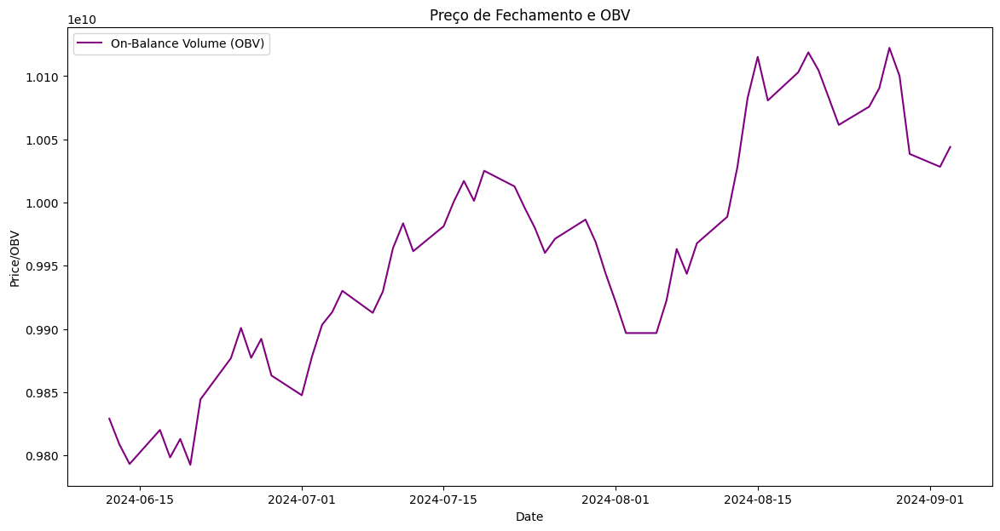

In [75]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
#plt.plot(df_last_60['Date'], df_last_60['Close'], label='Close Price', color='black')
plt.plot(df_last_60['Date'], df_last_60['obv'], label='On-Balance Volume (OBV)', color='purple')
plt.title('Preço de Fechamento e OBV')
plt.xlabel('Date')
plt.ylabel('Price/OBV')
plt.legend()
plt.show()

### Ichimoku Cloud

#### Ichimoku Conversion Line (Tenkan-sen)

Descrição: Calcula a média entre a máxima e a mínima nos últimos 9 períodos.

Objetivo: Identificar tendências de curto prazo.

#### Ichimoku Base Line (Kijun-sen)

Descrição: Calcula a média entre a máxima e a mínima nos últimos 26 períodos.

Objetivo: Identificar tendências de médio prazo.

#### Leading Span A (Senkou Span A)

Descrição: Calcula a média da linha de conversão e da linha de base, projetando 26 períodos à frente.

Objetivo: Junto com o Leading Span B, forma a nuvem que é usada para identificar suporte e resistência futuros.

#### Leading Span B (Senkou Span B)

Descrição: Calcula a média entre a máxima e a mínima dos últimos 52 períodos, projetando 26 períodos à frente.

Objetivo: Forma a segunda linha da nuvem para identificar níveis de suporte e resistência mais distantes.

In [76]:
from ta.trend import IchimokuIndicator

# Configurando o IchimokuIndicator com parâmetros corretos
ichimoku = IchimokuIndicator(high=df['High'], low=df['Low'], window1=9, window2=26, window3=52, visual=False, fillna=False)

# Calculando os componentes do Ichimoku Cloud
df['ichimoku_conversion'] = ichimoku.ichimoku_conversion_line()
df['ichimoku_base'] = ichimoku.ichimoku_base_line()
df['ichimoku_a'] = ichimoku.ichimoku_a()
df['ichimoku_b'] = ichimoku.ichimoku_b()

Ichimoku Indicator (Todos os Componentes)

Descrição da Visualização:
Este gráfico combina todas as componentes do Ichimoku Indicator: Ichimoku Conversion Line, Ichimoku Base Line, Senkou Span A e Senkou Span B, sobre o gráfico de preços.

Objetivo:
Este gráfico fornece uma visão completa do indicador Ichimoku, permitindo que o usuário identifique a tendência atual, possíveis suportes e resistências, bem como os pontos de reversão potenciais.

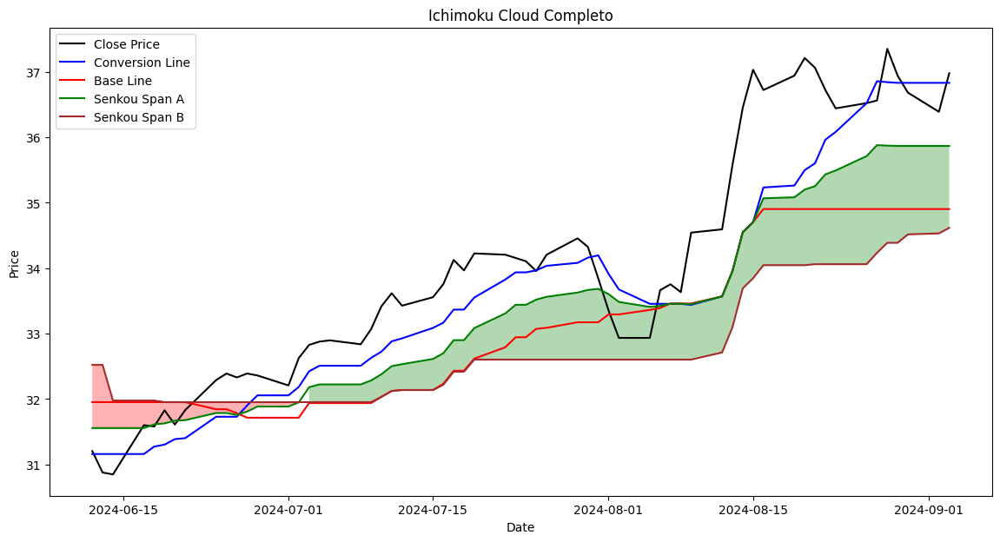

In [77]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['Close'], label='Close Price', color='black')
plt.plot(df_last_60['Date'], df_last_60['ichimoku_conversion'], label='Conversion Line', color='blue')
plt.plot(df_last_60['Date'], df_last_60['ichimoku_base'], label='Base Line', color='red')
plt.plot(df_last_60['Date'], df_last_60['ichimoku_a'], label='Senkou Span A', color='green')
plt.plot(df_last_60['Date'], df_last_60['ichimoku_b'], label='Senkou Span B', color='brown')
plt.fill_between(df_last_60['Date'], df_last_60['ichimoku_a'], df_last_60['ichimoku_b'], where=(df_last_60['ichimoku_a'] >= df_last_60['ichimoku_b']), facecolor='green', alpha=0.3)
plt.fill_between(df_last_60['Date'], df_last_60['ichimoku_a'], df_last_60['ichimoku_b'], where=(df_last_60['ichimoku_a'] < df_last_60['ichimoku_b']), facecolor='red', alpha=0.3)
plt.title('Ichimoku Cloud Completo')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

### Parabolic SAR

Descrição: O Parabolic SAR (Stop and Reverse) é um indicador que ajuda a identificar a direção de uma tendência e potenciais pontos de reversão. Ele é útil para definir pontos de entrada e saída em uma posição.

Objetivo: Este indicador é particularmente útil em mercados com tendência bem definida e pode ajudar o modelo a identificar mudanças na direção da tendência.

In [78]:
from ta.trend import PSARIndicator

# Adiciona o Parabolic SAR ao dataframe
psar = PSARIndicator(df['High'], df['Low'], df['Close'], step=0.02, max_step=0.2)
df['parabolic_sar'] = psar.psar()

Descrição do Gráfico: Um gráfico de linhas com o preço de fechamento ao longo do tempo, sobreposto ao Parabolic SAR.

Objetivo: Visualizar como o Parabolic SAR se move em relação ao preço de fechamento, ajudando a identificar possíveis pontos de reversão.

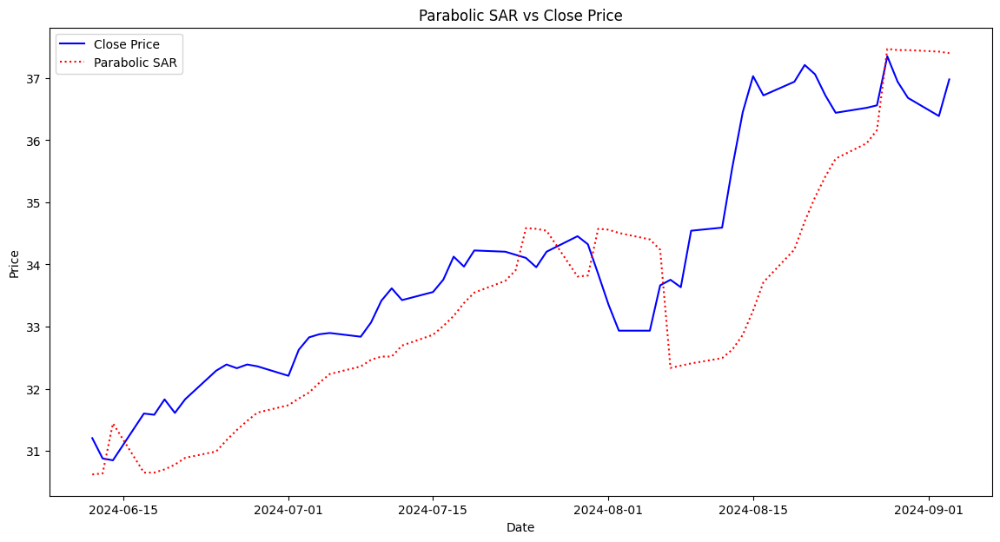

In [79]:
import matplotlib.pyplot as plt

# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['Close'], label='Close Price', color='blue')
plt.plot(df_last_60['Date'], df_last_60['parabolic_sar'], label='Parabolic SAR', color='red', linestyle='dotted')
plt.title('Parabolic SAR vs Close Price')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

### ADX com DI+ e DI-

Descrição: O ADX (Average Directional Index) mede a força de uma tendência, enquanto o DI+ (Directional Indicator Plus) e o DI- (Directional Indicator Minus) indicam a direção da tendência.

Objetivo: Esses indicadores ajudam o modelo a distinguir entre tendências fortes e fracas, além de identificar a direção da tendência, o que é essencial para estratégias de tendência.

In [80]:
from ta.trend import ADXIndicator

# Adiciona ADX, DI+ e DI- ao dataframe
adx = ADXIndicator(df['High'], df['Low'], df['Close'], window=14)
df['adx'] = adx.adx()
df['di_plus'] = adx.adx_pos()
df['di_minus'] = adx.adx_neg()

DI+ e DI- (di_plus, di_minus) com ADX

Descrição do Gráfico: Um gráfico de linhas mostrando DI+, DI-, e ADX ao longo do tempo.

Objetivo: Visualizar a força da tendência e identificar quando o DI+ cruza acima ou abaixo do DI-, sinalizando uma mudança na direção da tendência.

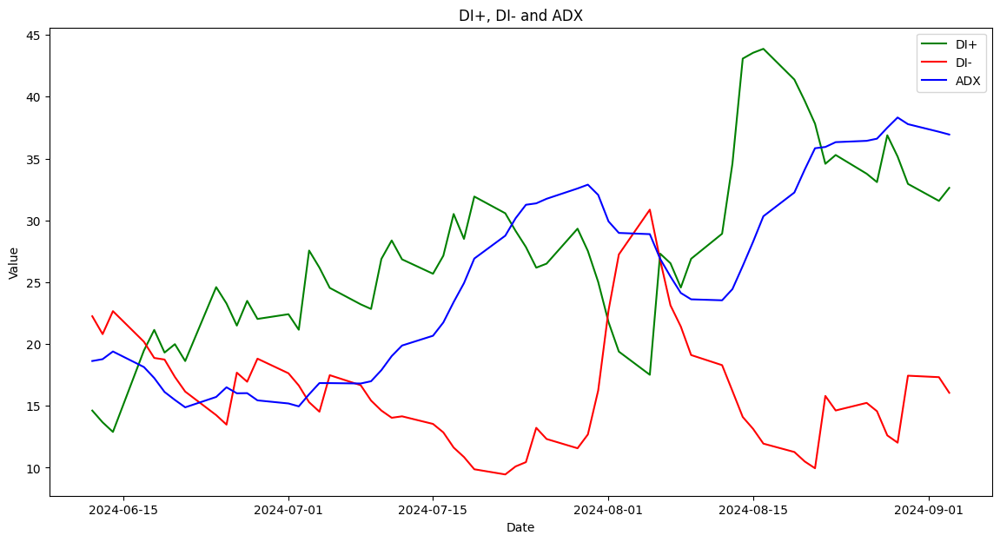

In [81]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['di_plus'], label='DI+', color='green')
plt.plot(df_last_60['Date'], df_last_60['di_minus'], label='DI-', color='red')
plt.plot(df_last_60['Date'], df_last_60['adx'], label='ADX', color='blue')
plt.title('DI+, DI- and ADX')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

### Elder's Force Index

Descrição: O Elder's Force Index combina preço e volume para medir a força por trás dos movimentos de preço. É útil para identificar entradas e saídas em mercados com tendência.

Objetivo: Este indicador pode ajudar a identificar a força das tendências de alta e baixa, auxiliando o modelo a reconhecer movimentos de preço sustentáveis.

In [82]:
from ta.volume import ForceIndexIndicator

# Adiciona o Elder's Force Index ao dataframe
force_index = ForceIndexIndicator(df['Close'], df['Volume'], window=13)
df['elders_force_index'] = force_index.force_index()

Descrição do Gráfico: Um gráfico de barras para o Elder's Force Index ao longo do tempo, sobreposto ao gráfico de preços.

Objetivo: Visualizar a força por trás dos movimentos de preço, ajudando a identificar potenciais reversões.

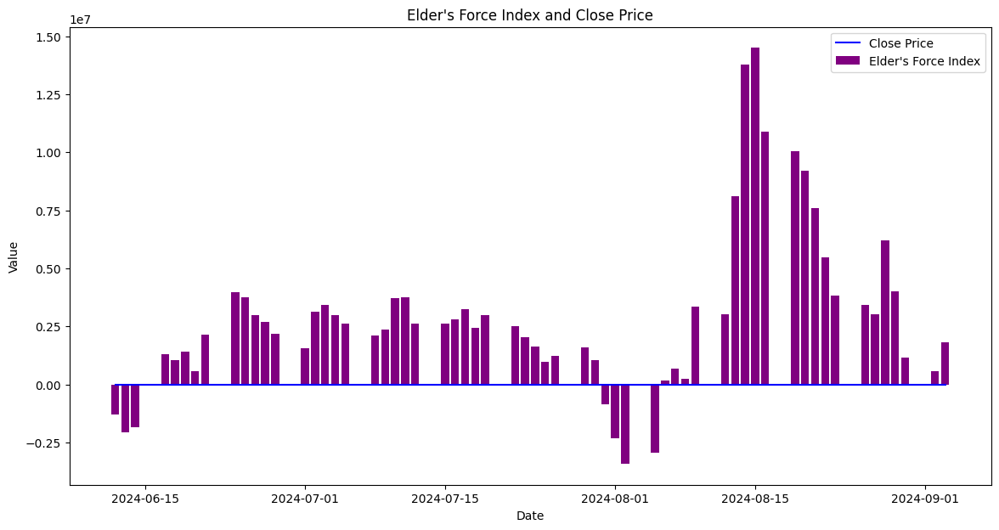

In [83]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.bar(df_last_60['Date'], df_last_60['elders_force_index'], label="Elder's Force Index", color='purple')
plt.plot(df_last_60['Date'], df_last_60['Close'], label='Close Price', color='blue')
plt.title("Elder's Force Index and Close Price")
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

### Commodity Channel Index (CCI)

Descrição: O CCI mede a variação do preço de um ativo em relação ao seu preço médio. É útil para identificar condições de sobrecompra ou sobrevenda.

Objetivo: O CCI pode ser usado para detectar condições extremas no mercado que poderiam preceder uma reversão, fornecendo sinais de compra ou venda.

In [84]:
import pandas as pd

def calculate_cci(high, low, close, window):
    tp = (high + low + close) / 3
    cci = (tp - tp.rolling(window=window).mean()) / (0.015 * tp.rolling(window=window).std())
    return cci

df['cci'] = calculate_cci(df['High'], df['Low'], df['Close'], window=20)

### Vortex Indicator (VI+ e VI-)

Descrição: O Vortex Indicator consiste em dois componentes, VI+ e VI-, que identificam a força e a direção de uma tendência.

Objetivo: Este indicador pode ajudar a identificar reversões de tendência e confirmar a força de uma tendência atual.

In [85]:
from ta.trend import VortexIndicator

# Adiciona o Vortex Indicator ao dataframe
vortex = VortexIndicator(df['High'], df['Low'], df['Close'], window=14)
df['vortex_plus'] = vortex.vortex_indicator_pos()
df['vortex_minus'] = vortex.vortex_indicator_neg()

Descrição do Gráfico: Um gráfico de linhas mostrando Vortex Plus e Vortex Minus ao longo do tempo.

Objetivo: Visualizar a força e direção da tendência, com cruzamentos entre Vortex Plus e Vortex Minus indicando mudanças na tendência.

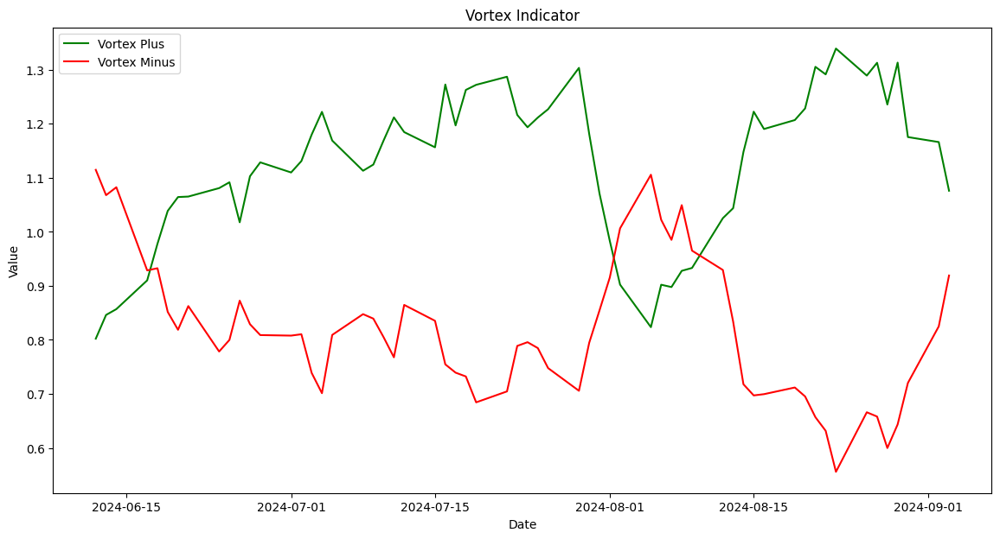

In [86]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['vortex_plus'], label='Vortex Plus', color='green')
plt.plot(df_last_60['Date'], df_last_60['vortex_minus'], label='Vortex Minus', color='red')
plt.title('Vortex Indicator')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

### Money Flow Index (MFI)

Descrição: O MFI é um indicador de momentum que utiliza tanto preço quanto volume para medir a pressão de compra e venda.

Objetivo: O MFI é útil para identificar condições de sobrecompra ou sobrevenda e pode ajudar a prever reversões de preço.

In [87]:
from ta.volume import MFIIndicator

# Adiciona o Money Flow Index ao dataframe
mfi = MFIIndicator(df['High'], df['Low'], df['Close'], df['Volume'], window=14)
df['mfi'] = mfi.money_flow_index()

Descrição do Gráfico: Um gráfico de linhas para o MFI ao longo do tempo.

Objetivo: Identificar condições de sobrecompra ou sobrevenda, onde valores acima de 80 indicam sobrecompra e abaixo de 20 indicam sobrevenda.

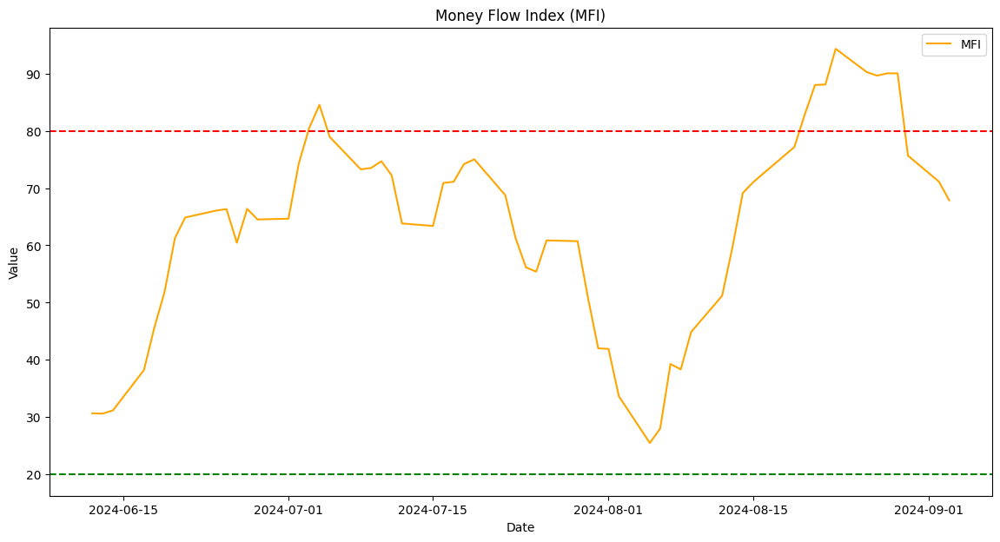

In [88]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['mfi'], label='MFI', color='orange')
plt.axhline(80, color='red', linestyle='--')
plt.axhline(20, color='green', linestyle='--')
plt.title('Money Flow Index (MFI)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

### True Strength Index (TSI)

Descrição: O TSI é um indicador de momentum que suaviza os movimentos de preço para ajudar a identificar tendências e possíveis reversões.

Objetivo: O TSI pode ser usado para confirmar a direção da tendência e detectar pontos de reversão de maneira mais precisa.

In [89]:
from ta.momentum import TSIIndicator

# Adiciona o True Strength Index ao dataframe
tsi = TSIIndicator(df['Close'], window_slow=25, window_fast=13)
df['tsi'] = tsi.tsi()

Descrição do Gráfico: Um gráfico de linhas para o TSI ao longo do tempo.

Objetivo: Identificar a força da tendência e pontos de reversão, com base no momentum suavizado.

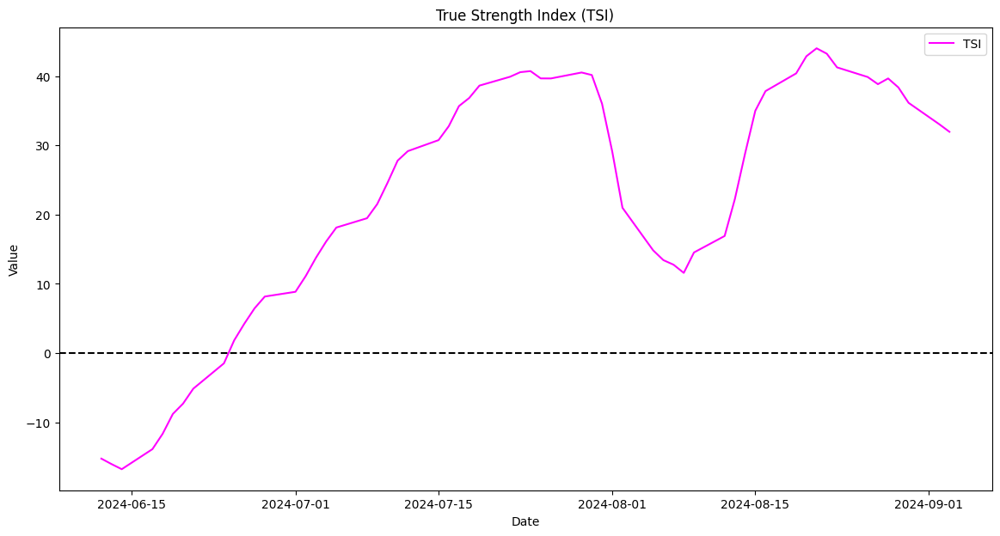

In [90]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['tsi'], label='TSI', color='magenta')
plt.axhline(0, color='black', linestyle='--')
plt.title('True Strength Index (TSI)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

### Accumulation/Distribution Line (ADL)

Descrição: O ADL é um indicador de volume que tenta medir o fluxo de dinheiro em um ativo, considerando tanto o preço quanto o volume.

Objetivo: O ADL pode ajudar a identificar divergências entre o preço e o volume, o que pode sinalizar uma reversão iminente.

In [91]:
from ta.volume import AccDistIndexIndicator

# Adiciona o Accumulation/Distribution Line ao dataframe
adl = AccDistIndexIndicator(df['High'], df['Low'], df['Close'], df['Volume'])
df['adl'] = adl.acc_dist_index()

Descrição do Gráfico: Um gráfico de linhas mostrando o ADL ao longo do tempo.

Objetivo: Avaliar o fluxo de dinheiro no ativo, observando divergências entre o preço e o ADL, que podem sinalizar reversões.

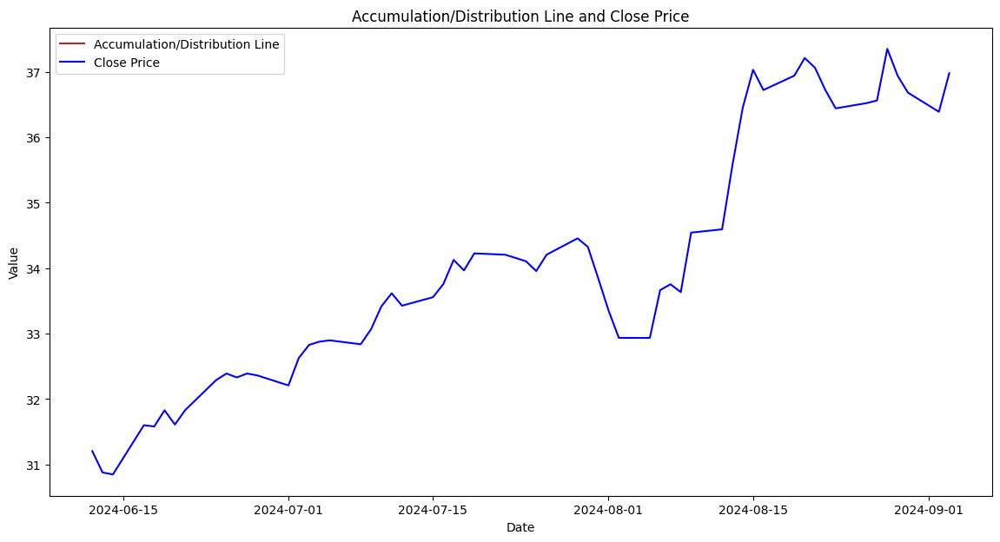

In [92]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['adl'], label='Accumulation/Distribution Line', color='brown')
plt.plot(df_last_60['Date'], df_last_60['Close'], label='Close Price', color='blue')
plt.title('Accumulation/Distribution Line and Close Price')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

### Combinação de Indicadores para Melhor Interpretação

Descrição do Gráfico: Uma combinação de indicadores (por exemplo, ADX com DI+, DI-, e TSI) para fornecer uma visão abrangente da força e direção da tendência.

Objetivo: Visualizar como diferentes indicadores interagem e confirmam (ou contradizem) sinais uns dos outros, ajudando a tomar decisões mais informadas.

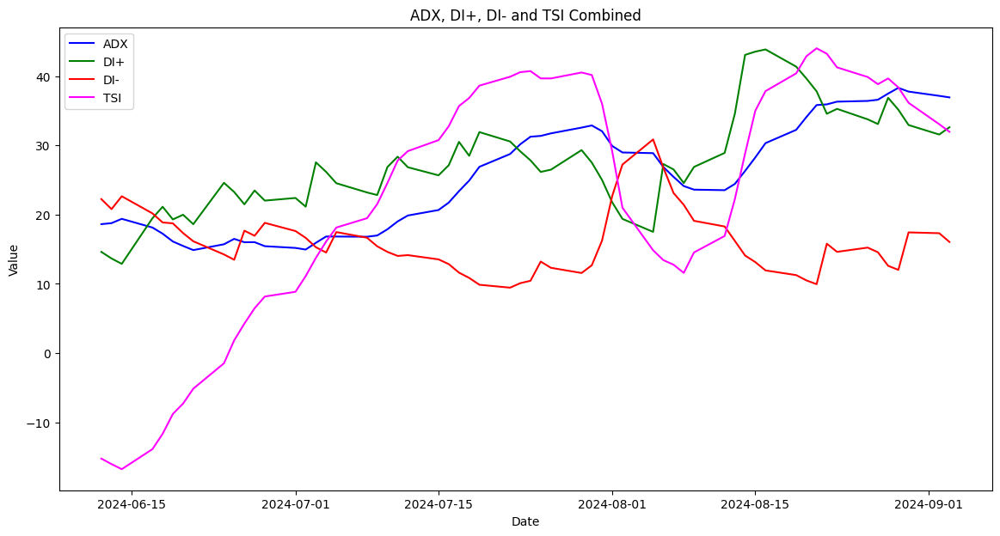

In [93]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['adx'], label='ADX', color='blue')
plt.plot(df_last_60['Date'], df_last_60['di_plus'], label='DI+', color='green')
plt.plot(df_last_60['Date'], df_last_60['di_minus'], label='DI-', color='red')
plt.plot(df_last_60['Date'], df_last_60['tsi'], label='TSI', color='magenta')
plt.title('ADX, DI+, DI- and TSI Combined')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

### Keltner Channels

Descrição: Keltner Channels são formados por uma média móvel exponencial (EMA) como a linha central e bandas acima e abaixo da EMA baseadas no Average True Range (ATR).

Objetivo: Identificar reversões de preço e fornecer zonas de suporte e resistência. As bandas superiores e inferiores são usadas para determinar as condições de sobrecompra e sobrevenda.

In [94]:
from ta.volatility import KeltnerChannel

keltner = KeltnerChannel(high=df['High'], low=df['Low'], close=df['Close'], window=20, window_atr=10, fillna=False)
df['keltner_middle'] = keltner.keltner_channel_mband()
df['keltner_upper'] = keltner.keltner_channel_hband()
df['keltner_lower'] = keltner.keltner_channel_lband()

Descrição: O gráfico das Keltner Channels mostra a média móvel exponencial (EMA) como uma linha central, com as bandas superiores e inferiores baseadas no Average True Range (ATR). Ele ajuda a identificar reversões de preço e zonas de suporte e resistência.

Objetivo: Usado para determinar condições de sobrecompra e sobrevenda, ajudando a identificar possíveis pontos de reversão de preço.

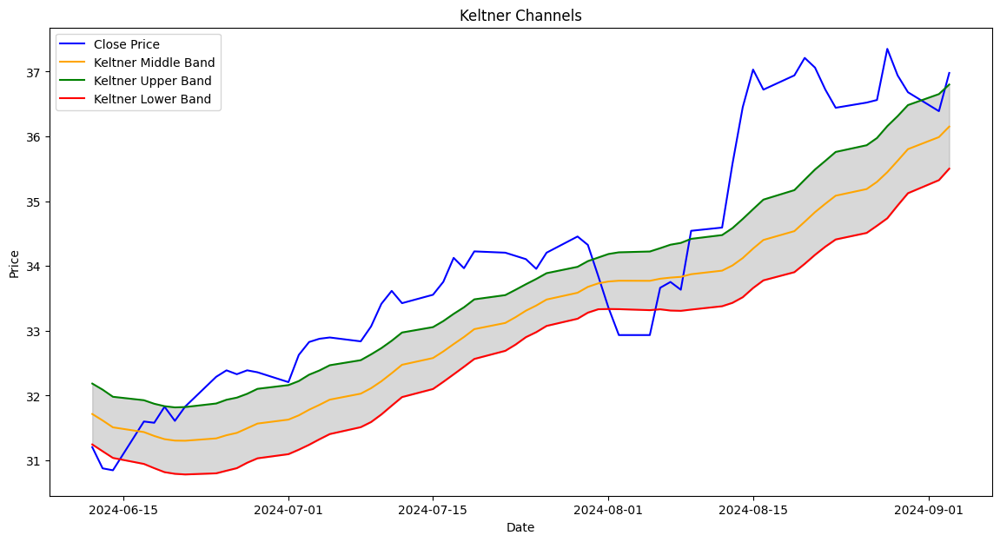

In [95]:
import matplotlib.pyplot as plt

# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['Close'], label='Close Price', color='blue')
plt.plot(df_last_60['Date'], df_last_60['keltner_middle'], label='Keltner Middle Band', color='orange')
plt.plot(df_last_60['Date'], df_last_60['keltner_upper'], label='Keltner Upper Band', color='green')
plt.plot(df_last_60['Date'], df_last_60['keltner_lower'], label='Keltner Lower Band', color='red')
plt.fill_between(df_last_60['Date'], df_last_60['keltner_lower'], df_last_60['keltner_upper'], color='grey', alpha=0.3)
plt.title('Keltner Channels')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

### Donchian Channels

Descrição: Donchian Channels são formados pelas maiores altas e menores baixas ao longo de um determinado período de tempo.

Objetivo: Usado principalmente para identificar rompimentos de tendência e níveis de suporte e resistência.

In [96]:
df['donchian_upper'] = df['High'].rolling(window=20).max()
df['donchian_lower'] = df['Low'].rolling(window=20).min()
df['donchian_middle'] = (df['donchian_upper'] + df['donchian_lower']) / 2

Donchian Channels

Descrição: O gráfico das Donchian Channels exibe as maiores altas e menores baixas ao longo de um período, formando uma banda superior e uma inferior. A linha média é a média dessas duas bandas.

Objetivo: Usado para identificar rompimentos de tendência e níveis de suporte e resistência, ajudando a visualizar potenciais pontos de entrada e saída.

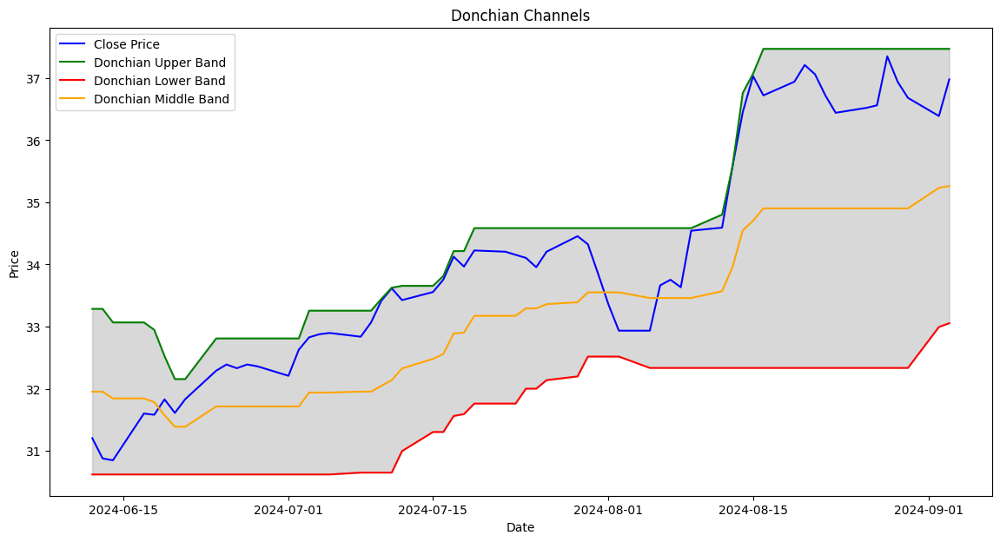

In [97]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['Close'], label='Close Price', color='blue')
plt.plot(df_last_60['Date'], df_last_60['donchian_upper'], label='Donchian Upper Band', color='green')
plt.plot(df_last_60['Date'], df_last_60['donchian_lower'], label='Donchian Lower Band', color='red')
plt.plot(df_last_60['Date'], df_last_60['donchian_middle'], label='Donchian Middle Band', color='orange')
plt.fill_between(df_last_60['Date'], df_last_60['donchian_lower'], df_last_60['donchian_upper'], color='grey', alpha=0.3)
plt.title('Donchian Channels')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

### Chaikin Oscillator

Descrição: O Chaikin Oscillator mede o momento da linha de Accumulation/Distribution (ADL). É calculado subtraindo a EMA de 10 dias da ADL da EMA de 3 dias da ADL.

Objetivo: Usado para identificar mudanças na tendência de curto prazo e divergências entre o preço e o volume.

In [98]:
from ta.volume import ChaikinMoneyFlowIndicator

df['chaikin_oscillator'] = df['adl'].ewm(span=3, adjust=False).mean() - df['adl'].ewm(span=10, adjust=False).mean()

Descrição: O gráfico do Chaikin Oscillator mostra a diferença entre a EMA de 3 dias e a EMA de 10 dias da linha de Accumulation/Distribution (ADL). Ele é representado como uma linha oscilante.

Objetivo: Usado para identificar mudanças na tendência de curto prazo e divergências entre o preço e o volume.

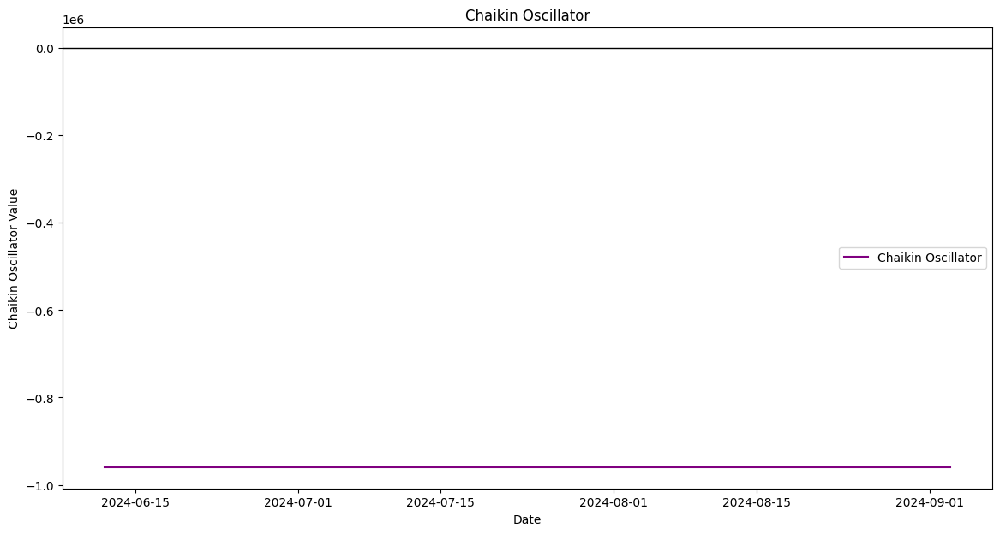

In [99]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['chaikin_oscillator'], label='Chaikin Oscillator', color='purple')
plt.axhline(0, color='black', linewidth=1)
plt.title('Chaikin Oscillator')
plt.xlabel('Date')
plt.ylabel('Chaikin Oscillator Value')
plt.legend()
plt.show()

### ADX com Ajuste de Período

Descrição: O Average Directional Index (ADX) mede a força de uma tendência, com ajustes de período para verificar qual oferece melhor previsibilidade.

Objetivo: Identificar a força da tendência; quanto mais alto o valor do ADX, mais forte a tendência.

In [100]:
from ta.trend import ADXIndicator

adx_adjusted = ADXIndicator(high=df['High'], low=df['Low'], close=df['Close'], window=14, fillna=False)
df['adx_adjusted'] = adx_adjusted.adx()

ADX com Ajuste de Período

Descrição: O gráfico do ADX ajustado exibe a força da tendência ao longo do tempo, mostrando como ela varia com o tempo.

Objetivo: Determinar a força da tendência; valores mais altos indicam uma tendência mais forte.

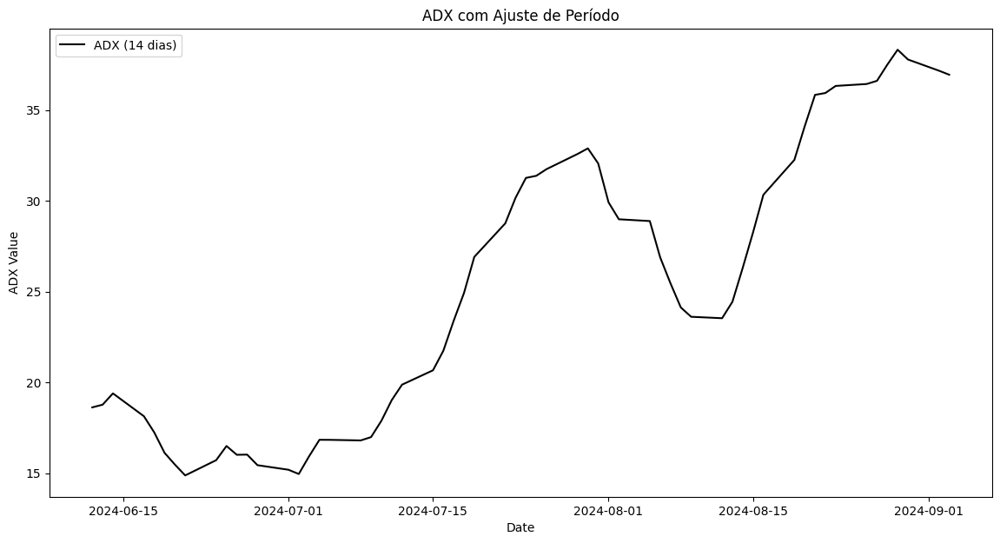

In [101]:
# Seleciona as últimas 60 linhas
df_last_60 = df.tail(60)

plt.figure(figsize=(14, 7))
plt.plot(df_last_60['Date'], df_last_60['adx_adjusted'], label='ADX (14 dias)', color='black')
plt.title('ADX com Ajuste de Período')
plt.xlabel('Date')
plt.ylabel('ADX Value')
plt.legend()
plt.show()

In [102]:
# Adicionar o valor para fechamento do próximo dia que será o target dos modelos
df['next_close'] = df['Close'].shift(1)

In [103]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5944 entries, 0 to 5943
Data columns (total 65 columns):
 #   Column                      Non-Null Count  Dtype                            
---  ------                      --------------  -----                            
 0   Date                        5944 non-null   datetime64[ns, America/Sao_Paulo]
 1   Open                        5944 non-null   float64                          
 2   High                        5944 non-null   float64                          
 3   Low                         5944 non-null   float64                          
 4   Close                       5944 non-null   float64                          
 5   Volume                      5944 non-null   int64                            
 6   Dividends                   5944 non-null   float64                          
 7   Stock Splits                5944 non-null   float64                          
 8   daily_return                5943 non-null   float64       

In [104]:
df.describe().T

/Users/iurymontenegro/.pyenv/versions/3.10.12/lib/python3.10/site-packages/pandas/core/nanops.py:1010: RuntimeWarning:

invalid value encountered in subtract

/Users/iurymontenegro/.pyenv/versions/3.10.12/lib/python3.10/site-packages/numpy/lib/function_base.py:4655: RuntimeWarning:

invalid value encountered in subtract



,count,mean,std,min,25%,50%,75%,max
Open,5944.0,1.299526e+01,9.070320e+00,1.096332e+00,6.276742e+00,1.004440e+01,2.122277e+01,3.731205e+01
High,5944.0,1.315997e+01,9.168252e+00,1.125183e+00,6.375559e+00,1.014979e+01,2.157763e+01,3.747197e+01
Low,5944.0,1.282486e+01,8.970048e+00,1.058057e+00,6.154848e+00,9.941120e+00,2.092863e+01,3.694222e+01
Close,5944.0,1.299348e+01,9.068015e+00,1.115566e+00,6.251018e+00,1.004924e+01,2.121713e+01,3.735202e+01
Volume,5944.0,4.318882e+07,6.765439e+07,0.000000e+00,1.350894e+07,2.171041e+07,4.160155e+07,1.679561e+09
Dividends,5944.0,2.161570e-03,2.719653e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.125125e+00
Stock Splits,5944.0,3.406965e-03,1.383744e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+01
daily_return,5943.0,7.553424e-04,2.191073e-02,-1.796428e-01,-1.160658e-02,0.000000e+00,1.191132e-02,2.337262e-01
close_open_diff,5944.0,-1.777853e-03,2.480856e-01,-1.449312e+00,-9.978857e-02,0.000000e+00,9.376508e-02,1.517574e+00
high_low_diff,5944.0,3.351032e-01,2.743591e-01,0.000000e+00,1.346373e-01,2.716785e-01,4.723536e-01,2.940272e+00


# 4. Análise Exploratória Inicial (EDA)

## 1. Distribuição dos Valores
É importante entender como os valores de cada variável estão distribuídos. Você pode usar histogramas ou box plots para visualizar a distribuição das variáveis numéricas. Isso ajuda a identificar possíveis outliers e a assimetria dos dados.

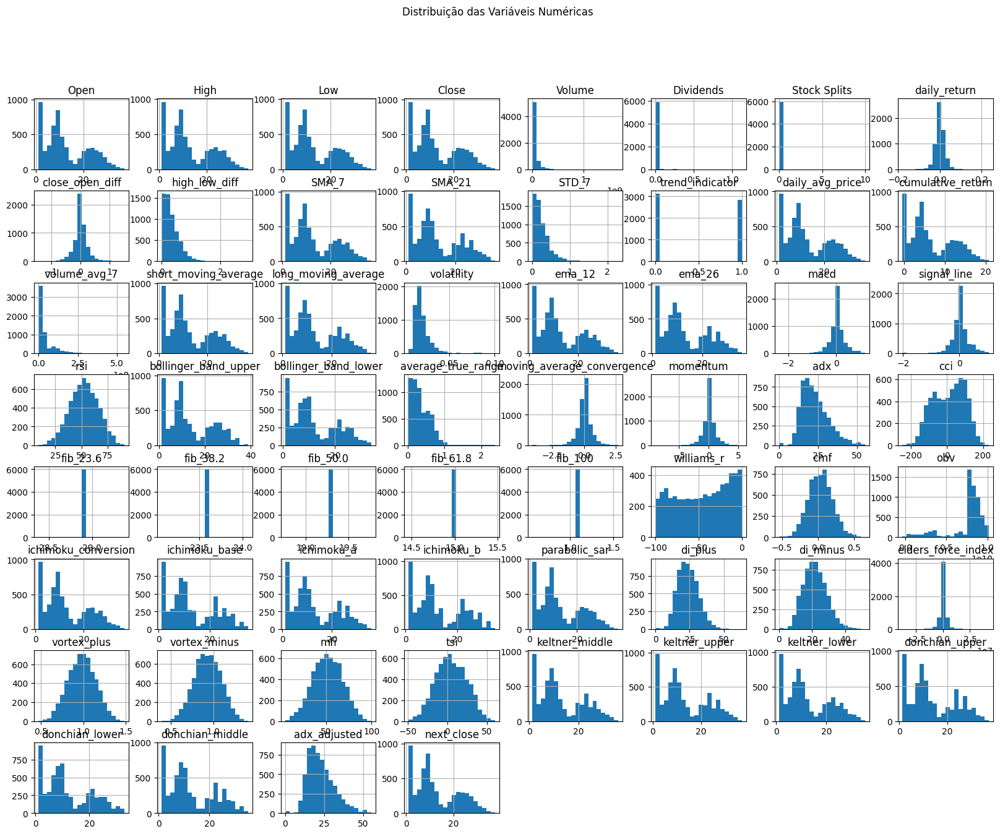

In [105]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric_columns = df.columns.drop(['Date','chaikin_oscillator','adl'])

# Plotando histogramas para as principais variáveis
df[numeric_columns].hist(bins=20, figsize=(20, 15))
plt.suptitle('Distribuição das Variáveis Numéricas')
plt.show()

## 2. Matriz de Correlação
Analisar a correlação entre as variáveis pode ajudar a entender como elas estão relacionadas entre si. Variáveis altamente correlacionadas podem ser redundantes e, em alguns casos, podem ser removidas para simplificar o modelo.

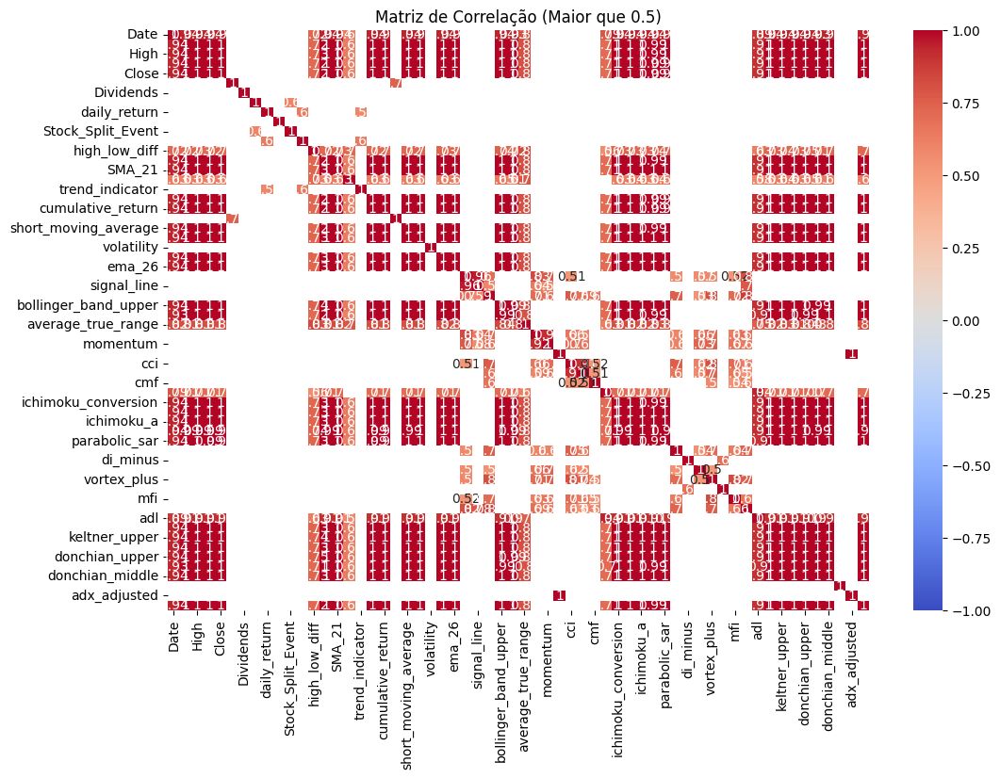

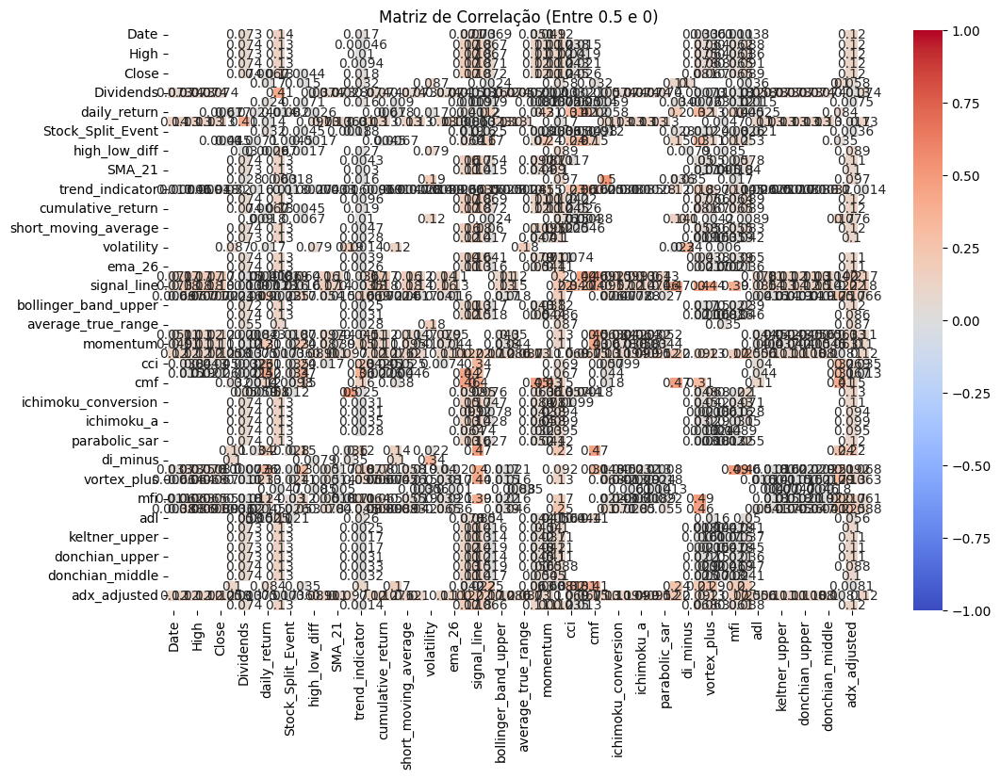

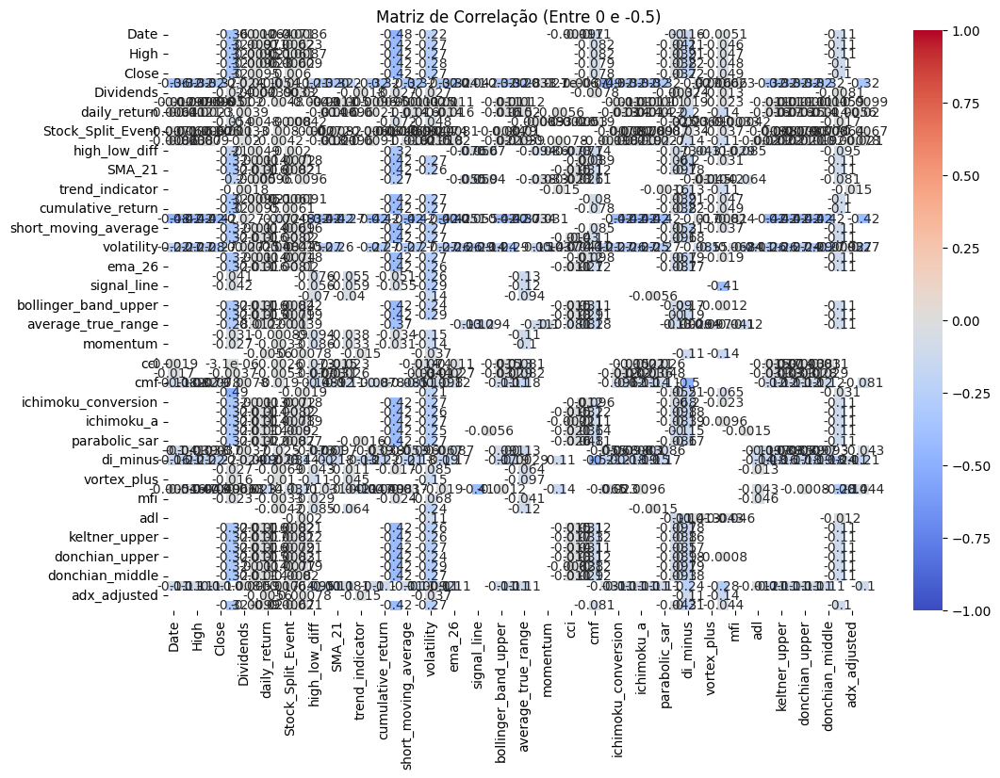

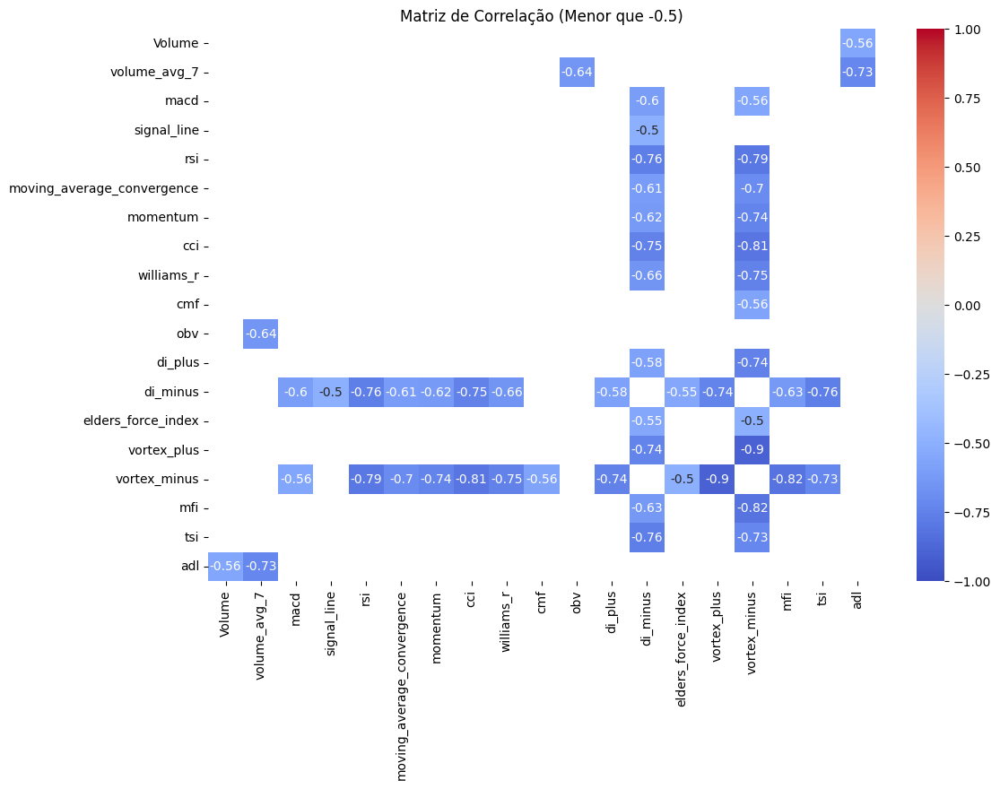

In [106]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Calculando a matriz de correlação
corr_matrix = df.corr()

# Definindo os intervalos de correlação
corr_high_pos = corr_matrix[(corr_matrix > 0.5) & (corr_matrix <= 1.0)].dropna(how='all', axis=0).dropna(how='all', axis=1)
corr_low_pos = corr_matrix[(corr_matrix > 0.0) & (corr_matrix <= 0.5)].dropna(how='all', axis=0).dropna(how='all', axis=1)
corr_low_neg = corr_matrix[(corr_matrix < 0.0) & (corr_matrix >= -0.5)].dropna(how='all', axis=0).dropna(how='all', axis=1)
corr_high_neg = corr_matrix[(corr_matrix < -0.5) & (corr_matrix >= -1.0)].dropna(how='all', axis=0).dropna(how='all', axis=1)

# Função para plotar o heatmap com correlações filtradas
def plot_correlation_matrix(corr, title):
    if not corr.empty:  # Verifica se a matriz de correlação não está vazia
        plt.figure(figsize=(12, 8))
        sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1, cbar=True)
        plt.title(title)
        plt.show()
    else:
        print(f"{title} não tem valores de correlação significativos.")

# Plotando as diferentes matrizes de correlação
plot_correlation_matrix(corr_high_pos, 'Matriz de Correlação (Maior que 0.5)')
plot_correlation_matrix(corr_low_pos, 'Matriz de Correlação (Entre 0.5 e 0)')
plot_correlation_matrix(corr_low_neg, 'Matriz de Correlação (Entre 0 e -0.5)')
plot_correlation_matrix(corr_high_neg, 'Matriz de Correlação (Menor que -0.5)')


## 3. Análise de Outliers
Outliers podem afetar significativamente a performance do modelo. Identificar e tratar esses valores pode melhorar a precisão das previsões.

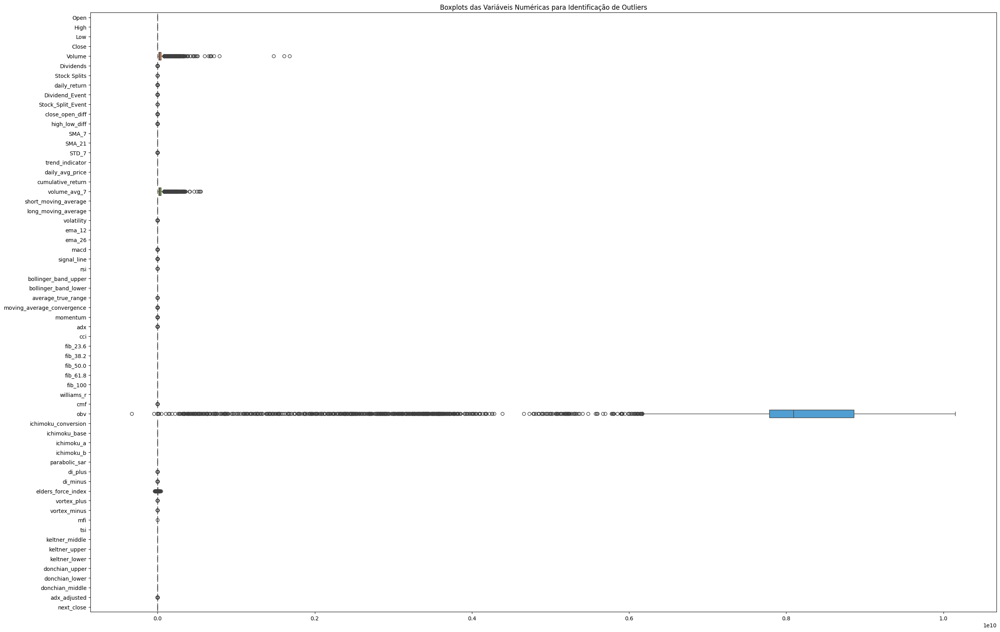

In [107]:
plt.figure(figsize=(30, 20))
sns.boxplot(data=df[numeric_columns], orient='h')
plt.title('Boxplots das Variáveis Numéricas para Identificação de Outliers')
plt.show()

## 4. Relação entre Variáveis e o Target (next_close)
Entender como cada variável se relaciona com o target (preço de fechamento do próximo dia) é crucial. Gráficos de dispersão podem ser úteis aqui.

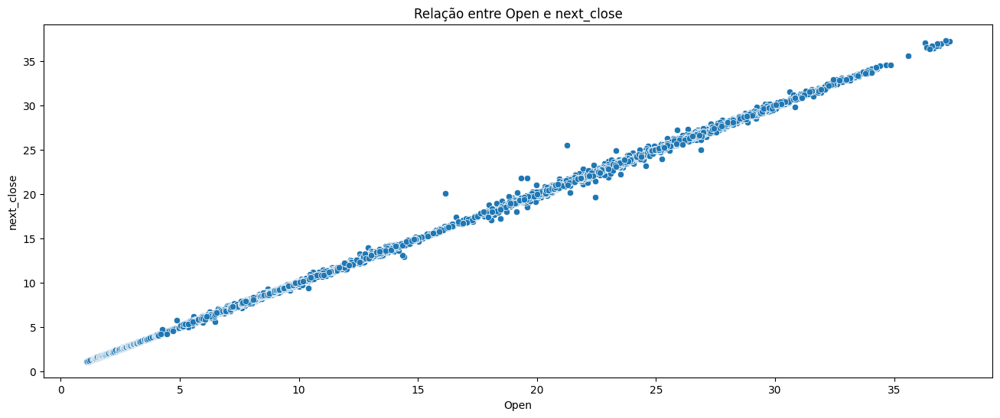

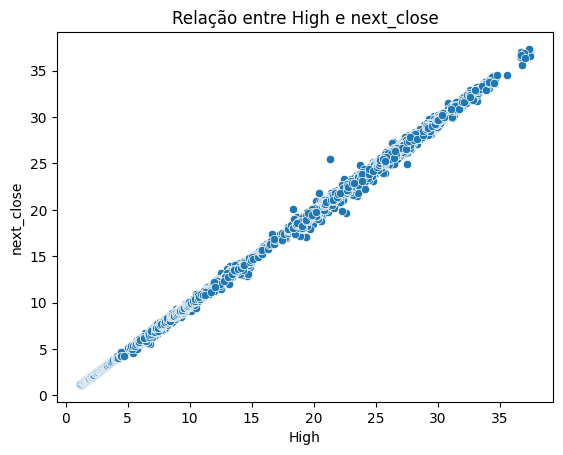

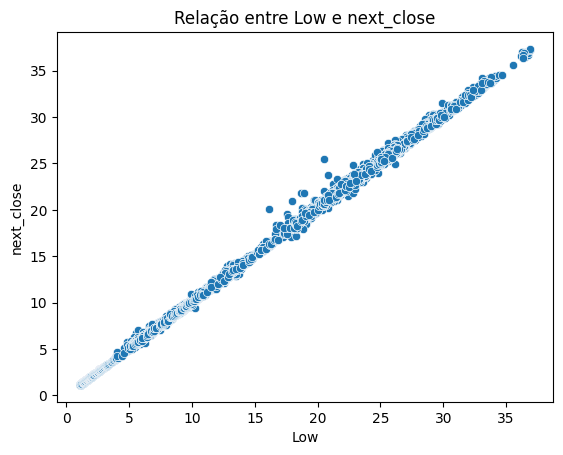

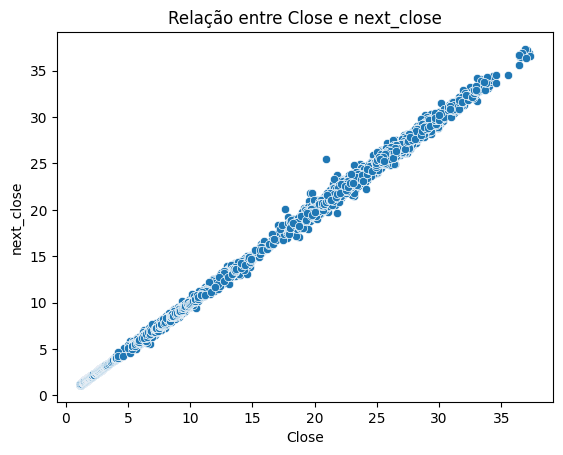

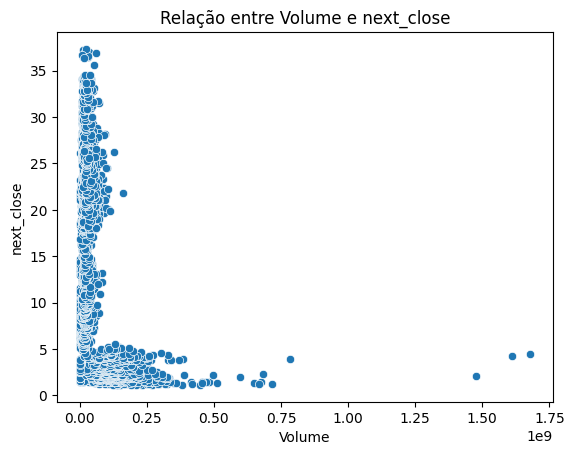

...

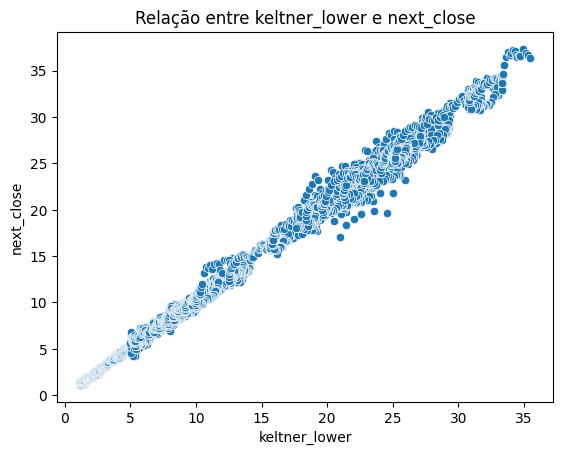

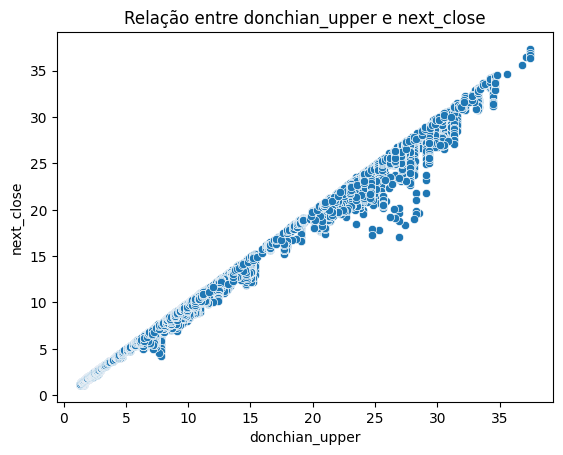

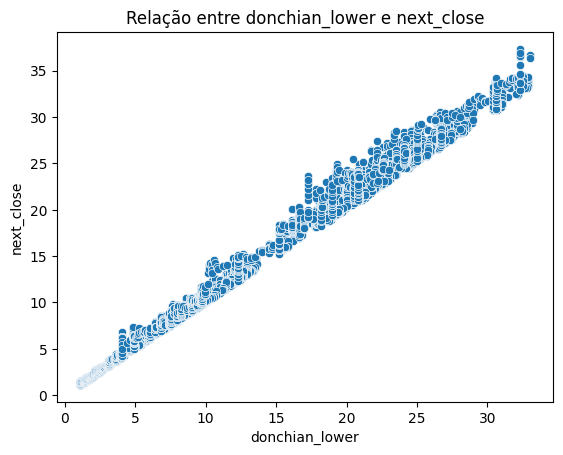

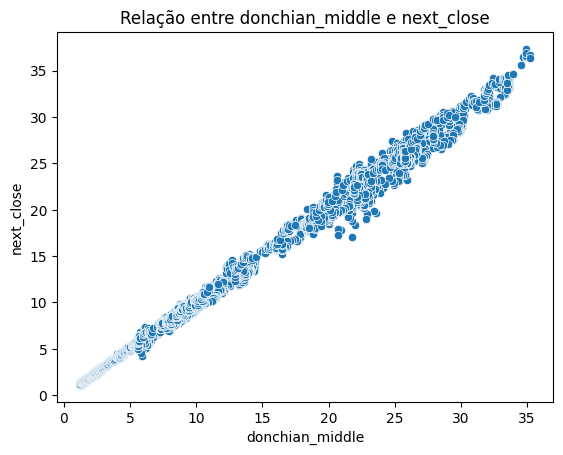

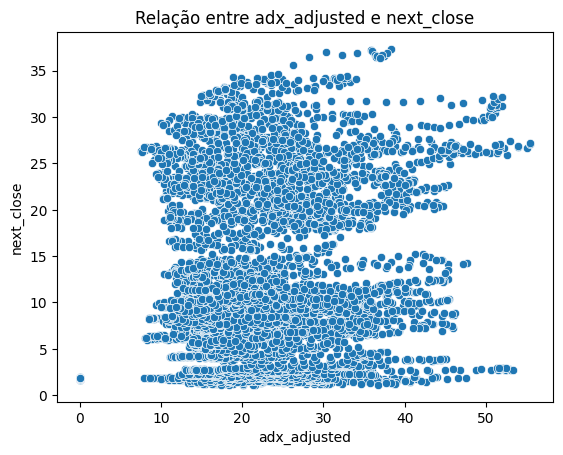

In [108]:
plt.figure(figsize=(16, 6))
for column in numeric_columns:
    if column != 'next_close':
        sns.scatterplot(x=df[column], y=df['next_close'])
        plt.title(f'Relação entre {column} e next_close')
        plt.show()

## 5. Análise de Multicolinearidade (VIF - Variance Inflation Factor)
O que é?: O VIF mede o quanto a variância de uma feature é inflacionada devido à correlação com outras features. Se o VIF for muito alto (geralmente acima de 10), isso indica que a feature está altamente correlacionada com outras e pode ser redundante.

Como usar?: Calcule o VIF para cada feature e remova aquelas que apresentam valores muito altos, mantendo aquelas com valores mais baixos.

In [109]:
# Verificando se há NaN no DataFrame original
print(df.isna().sum())

Date                            0
Open                            0
High                            0
Low                             0
Close                           0
Volume                          0
Dividends                       0
Stock Splits                    0
daily_return                    1
Dividend_Event                  0
Stock_Split_Event               0
close_open_diff                 0
high_low_diff                   0
SMA_7                           6
SMA_21                         20
STD_7                           6
trend_indicator                 0
daily_avg_price                 0
cumulative_return               1
volume_avg_7                    6
short_moving_average            4
long_moving_average            19
volatility                     20
ema_12                          0
ema_26                          0
macd                            0
signal_line                     0
rsi                            19
bollinger_band_upper           19
bollinger_band

In [110]:
# Retirar colunas com problemas de processamento com 10k ou sem valores numericos ou Booleanas
colunas_para_remover = ['Dividend_Event', 'Stock_Split_Event', 'chaikin_oscillator', 'cmf','adl']
df = df.drop(columns=colunas_para_remover)

In [111]:
# Retirar linhas com NaN
df.dropna(inplace=True)

In [112]:
# Verificando se há NaN no DataFrame original
print(df.isna().sum())

Date                          0
Open                          0
High                          0
Low                           0
Close                         0
Volume                        0
Dividends                     0
Stock Splits                  0
daily_return                  0
close_open_diff               0
high_low_diff                 0
SMA_7                         0
SMA_21                        0
STD_7                         0
trend_indicator               0
daily_avg_price               0
cumulative_return             0
volume_avg_7                  0
short_moving_average          0
long_moving_average           0
volatility                    0
ema_12                        0
ema_26                        0
macd                          0
signal_line                   0
rsi                           0
bollinger_band_upper          0
bollinger_band_lower          0
average_true_range            0
moving_average_convergence    0
momentum                      0
adx     

In [113]:
print(df.drop(columns=['Date']).dtypes)

Open                          float64
High                          float64
Low                           float64
Close                         float64
Volume                          int64
Dividends                     float64
Stock Splits                  float64
daily_return                  float64
close_open_diff               float64
high_low_diff                 float64
SMA_7                         float64
SMA_21                        float64
STD_7                         float64
trend_indicator                 int64
daily_avg_price               float64
cumulative_return             float64
volume_avg_7                  float64
short_moving_average          float64
long_moving_average           float64
volatility                    float64
ema_12                        float64
ema_26                        float64
macd                          float64
signal_line                   float64
rsi                           float64
bollinger_band_upper          float64
bollinger_ba

In [114]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd

# Adiciona uma constante para calcular o VIF
X = add_constant(df.drop(columns=['Date']))  # Certifique-se de remover a coluna de data ou outras que não serão analisadas

# Calcula o VIF para cada feature
vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Ordena por VIF em ordem decrescente
vif_sorted = vif_data.sort_values(by='VIF', ascending=False)

# Exibe todas as features e seus VIFs
print(vif_sorted)

/Users/iurymontenegro/.pyenv/versions/3.10.12/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning:

divide by zero encountered in scalar divide

/Users/iurymontenegro/.pyenv/versions/3.10.12/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning:

divide by zero encountered in scalar divide



                       Feature           VIF
30                         adx           inf
21                      ema_26  4.503600e+15
25        bollinger_band_upper  4.503600e+15
57                adx_adjusted  3.002400e+15
55              donchian_lower  2.251800e+15
17        short_moving_average  2.251800e+15
56             donchian_middle  1.501200e+15
18         long_moving_average  6.004800e+14
15           cumulative_return  5.298353e+14
41                  ichimoku_a  4.740631e+14
40               ichimoku_base  3.105931e+14
51              keltner_middle  2.729454e+14
52               keltner_upper  2.649176e+14
54              donchian_upper  2.502000e+14
53               keltner_lower  1.012045e+14
14             daily_avg_price  7.901052e+13
3                        Close  6.004800e+13
1                         High  5.361428e+13
26        bollinger_band_lower  5.117727e+13
20                      ema_12  4.415294e+13
0                         Open  4.021071e+13
39        

### 1. Valores Infinitos e Muito Altos:
Algumas variáveis apresentam valores de VIF extremamente altos ou até mesmo infinitos, como Open, close_open_diff, moving_average_convergence, e Low.
Valores de VIF muito altos indicam uma forte multicolinearidade, o que significa que essas variáveis estão altamente correlacionadas entre si.
### 2. Valores Baixos:
Algumas variáveis apresentam valores de VIF muito baixos, como fib_50.0, fib_61.8, fib_100, que são 0.0. Isso pode indicar que essas variáveis não estão contribuindo para o modelo ou que houve algum problema na configuração.
### 3. Valores Nulos (NaN):
Variáveis como fib_23.6 e fib_38.2 apresentaram valores NaN, o que sugere que não foi possível calcular o VIF para essas variáveis. Isso pode ocorrer por falta de variabilidade ou por problemas na matriz de design (como multicolinearidade exata).

In [115]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd

# Configura o Pandas para não truncar o output
pd.set_option('display.max_rows', None)

# Adiciona uma constante para calcular o VIF
X = add_constant(df.drop(columns=['next_close','Date', 'Open', 'Close', 'Low', 'High', 'Dividends', 
                                  'Stock Splits', 'fib_50.0', 'fib_38.2', 'fib_23.6', 
                                  'fib_100', 'fib_61.8']))

# Calcula o VIF para cada feature
vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Ordena por VIF em ordem decrescente
vif_sorted = vif_data.sort_values(by='VIF', ascending=False)

# Exibe todas as features e seus VIFs
print(vif_sorted)

/Users/iurymontenegro/.pyenv/versions/3.10.12/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning:

divide by zero encountered in scalar divide



                       Feature           VIF
25                         adx           inf
46             donchian_middle  4.503600e+15
31                  ichimoku_a  1.801440e+15
42               keltner_upper  7.505999e+14
47                adx_adjusted  6.433714e+14
13         long_moving_average  4.289143e+14
30               ichimoku_base  3.916174e+14
23  moving_average_convergence  3.002400e+14
41              keltner_middle  2.001600e+14
45              donchian_lower  1.324588e+14
43               keltner_lower  1.035310e+14
15                      ema_12  1.023545e+14
12        short_moving_average  8.497358e+13
29         ichimoku_conversion  3.560158e+13
21        bollinger_band_lower  3.053288e+13
17                        macd  3.032727e+13
20        bollinger_band_upper  1.941207e+13
44              donchian_upper  1.483888e+13
16                      ema_26  6.555458e+12
6                       SMA_21  6.692444e+05
10           cumulative_return  1.053002e+05
9         

# 5. Normalização do DataFrame:

, 'donchian_middle', 'daily_avg_price',
                                   'moving_average_convergence', 'bollinger_band_lower',
                                  'bollinger_band_upper',
                                  'keltner_middle', 'long_moving_average', 'keltner_upper',
                                  'high_low_diff', 'close_open_diff', 'donchian_upper',
                                  'donchian_lower', 'SMA_21', 'SMA_7','short_moving_average','keltner_lower'

In [116]:
from sklearn.preprocessing import MinMaxScaler

# Extraindo features da coluna Date
df['day_of_month'] = df['Date'].dt.day
df['month'] = df['Date'].dt.month
df['day_of_week'] = df['Date'].dt.dayofweek
df['year'] = df['Date'].dt.year

# Colunas que deseja excluir da normalização
colunas_excluir = ['next_close','Date', 'Open', 'Close', 'Low', 'High', 'Dividends', 
                                  'Stock Splits', 'fib_50.0', 'fib_38.2', 'fib_23.6', 
                                  'fib_100', 'fib_61.8']

# Coluna alvo que não será normalizada
coluna_alvo = 'next_close'

# Verificar se há valores nulos antes do processamento
print("Valores nulos antes do processamento:")
print(df[coluna_alvo].isnull().sum())

# Criar um dataframe com as colunas que serão normalizadas
colunas_para_normalizar = df.columns.difference(colunas_excluir)
df_colunas_para_normalizar = df[colunas_para_normalizar]

# Aplicar a normalização
scaler = MinMaxScaler()
colunas_normalizadas = scaler.fit_transform(df_colunas_para_normalizar)

# Convertendo de volta para DataFrame com as mesmas colunas
df_scaled = pd.DataFrame(colunas_normalizadas, columns=colunas_para_normalizar, index=df.index)

# Recombinar com a coluna alvo e as colunas excluídas da normalização
df_filtrd = pd.concat([df_scaled, df[coluna_alvo]], axis=1)

# Verificar se há valores nulos após o processamento
print("Valores nulos após o processamento:")
print(df_filtrd[coluna_alvo].isnull().sum())

# Verificar os primeiros registros para garantir que estão corretos
print(df_filtrd.head())

Valores nulos antes do processamento:
0
Valores nulos após o processamento:
0
      SMA_21     SMA_7     STD_7    Volume       adx  adx_adjusted  \
37  0.017656  0.016467  0.006933  0.022380  0.484233      0.484233   
38  0.017590  0.016428  0.005982  0.075743  0.467260      0.467260   
39  0.017544  0.016659  0.008517  0.054836  0.469029      0.469029   
40  0.017479  0.016813  0.010192  0.020525  0.470672      0.470672   
41  0.017204  0.016738  0.012419  0.036037  0.434613      0.434613   

    average_true_range  bollinger_band_lower  bollinger_band_upper       cci  \
37            0.007912              0.020751              0.017221  0.354080   
38            0.006274              0.020637              0.017167  0.413204   
39            0.008610              0.020599              0.017073  0.462081   
40            0.006972              0.020736              0.016658  0.506953   
41            0.009191              0.020851              0.015918  0.326214   

    ...  signal_line

In [117]:
df_filtrd.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5907 entries, 37 to 5943
Data columns (total 52 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   SMA_21                      5907 non-null   float64
 1   SMA_7                       5907 non-null   float64
 2   STD_7                       5907 non-null   float64
 3   Volume                      5907 non-null   float64
 4   adx                         5907 non-null   float64
 5   adx_adjusted                5907 non-null   float64
 6   average_true_range          5907 non-null   float64
 7   bollinger_band_lower        5907 non-null   float64
 8   bollinger_band_upper        5907 non-null   float64
 9   cci                         5907 non-null   float64
 10  close_open_diff             5907 non-null   float64
 11  cumulative_return           5907 non-null   float64
 12  daily_avg_price             5907 non-null   float64
 13  daily_return                5907 non-

In [118]:
df_filtrd.describe()

,SMA_21,SMA_7,STD_7,Volume,adx,adx_adjusted,average_true_range,bollinger_band_lower,bollinger_band_upper,cci,...,signal_line,trend_indicator,tsi,volatility,volume_avg_7,vortex_minus,vortex_plus,williams_r,year,next_close
count,5907.000000,5907.000000,5907.000000,5907.000000,5907.000000,5907.000000,5907.000000,5907.000000,5907.000000,5907.000000,...,5907.000000,5907.000000,5907.000000,5907.000000,5907.000000,5907.000000,5907.000000,5907.000000,5907.000000,5907.000000
mean,0.338716,0.332927,0.107803,0.025680,0.324285,0.324285,0.142904,0.340407,0.334145,0.539751,...,0.670283,0.475707,0.492670,0.155547,0.073632,0.531131,0.504427,0.543064,0.491951,13.057743
std,0.257778,0.252901,0.096494,0.040352,0.178050,0.178050,0.109484,0.259515,0.252639,0.181533,...,0.098459,0.499452,0.176257,0.095462,0.095776,0.155422,0.160103,0.302306,0.297590,9.048554
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.115566
25%,0.146719,0.144563,0.040575,0.008050,0.188844,0.188844,0.067411,0.148681,0.151244,0.387898,...,0.633782,0.000000,0.367694,0.098043,0.021573,0.425424,0.391248,0.274419,0.217391,6.327954
50%,0.254129,0.249665,0.082783,0.012903,0.293217,0.293217,0.116193,0.259958,0.247416,0.557901,...,0.667032,0.000000,0.486581,0.133547,0.035598,0.532047,0.503733,0.571025,0.478261,10.073205
75%,0.584071,0.566819,0.147483,0.024660,0.426813,0.426813,0.220319,0.566278,0.577149,0.689287,...,0.709399,1.000000,0.621825,0.183483,0.070533,0.641855,0.615038,0.819729,0.739130,21.259626
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,37.352024


In [119]:
df_filtrd.head().T

,37,38,39,40,41
SMA_21,0.017656,0.017590,0.017544,0.017479,0.017204
SMA_7,0.016467,0.016428,0.016659,0.016813,0.016738
STD_7,0.006933,0.005982,0.008517,0.010192,0.012419
Volume,0.022380,0.075743,0.054836,0.020525,0.036037
adx,0.484233,0.467260,0.469029,0.470672,0.434613
adx_adjusted,0.484233,0.467260,0.469029,0.470672,0.434613
average_true_range,0.007912,0.006274,0.008610,0.006972,0.009191
bollinger_band_lower,0.020751,0.020637,0.020599,0.020736,0.020851
bollinger_band_upper,0.017221,0.017167,0.017073,0.016658,0.015918
cci,0.354080,0.413204,0.462081,0.506953,0.326214


# 4. Implementação de Modelos de Machine Learning e Deep Learning:

In [120]:
# Importando as bibliotecas necessárias
from pycaret.regression import *

# Inicializando a configuração
reg = setup(data=df_filtrd, target='next_close', session_id=123)

# Comparando os modelos
best_model = compare_models()

# Mostrando o melhor modelo
print(f"Melhor modelo: {best_model}")

# Treinando o melhor modelo com todos os dados de treino
final_model = finalize_model(best_model)

,Description,Value
0,Session id,123
1,Target,next_close
2,Target type,Regression
3,Original data shape,"(5907, 52)"
4,Transformed data shape,"(5907, 52)"
5,Transformed train set shape,"(4134, 52)"
6,Transformed test set shape,"(1773, 52)"
7,Numeric features,51
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lr,Linear Regression,0.0595,0.0081,0.0898,0.9999,0.0103,0.0078,0.1610
lightgbm,Light Gradient Boosting Machine,0.0682,0.0145,0.1176,0.9998,0.0079,0.0063,0.3300
huber,Huber Regressor,0.0974,0.0222,0.1483,0.9997,0.0166,0.0129,0.0170
rf,Random Forest Regressor,0.0898,0.0264,0.1592,0.9997,0.0101,0.0077,0.8630
et,Extra Trees Regressor,0.0891,0.0249,0.1555,0.9997,0.0100,0.0077,0.2710
gbr,Gradient Boosting Regressor,0.0973,0.0225,0.1487,0.9997,0.0109,0.0094,0.4840
ridge,Ridge Regression,0.0971,0.0212,0.1450,0.9997,0.0174,0.0136,0.0060
par,Passive Aggressive Regressor,0.1232,0.0306,0.1729,0.9996,0.0209,0.0166,0.0070
dt,Decision Tree Regressor,0.1279,0.0480,0.2161,0.9994,0.0138,0.0110,0.0180
ada,AdaBoost Regressor,0.3733,0.2516,0.5012,0.9969,0.1181,0.0981,0.1800


Melhor modelo: LinearRegression(n_jobs=-1)


O uso de modelos de aprendizagem profunda para previsão de séries temporais tem se tornado cada vez mais comum, especialmente em áreas como o mercado financeiro, onde a previsão precisa é de extrema importância. Entre os modelos testados neste estudo, cada um apresenta características que o tornam adequado para diferentes aspectos da modelagem temporal.

MLP (Multi-Layer Perceptron): Apesar de ser um modelo mais simples, o MLP tem sido tradicionalmente utilizado para tarefas de previsão em séries temporais. Sua capacidade de capturar padrões não lineares, mesmo com uma arquitetura simples, foi destacada em vários estudos, como o de Zhang (1998), que mostra como MLPs podem ser eficazes em problemas de séries temporais quando bem ajustados.

CNN (Convolutional Neural Networks): As CNNs, normalmente usadas em reconhecimento de imagem, têm sido adaptadas para séries temporais pela sua habilidade em extrair características locais e invariantes. O trabalho de Borovykh et al. (2017) mostrou que CNNs podem ser eficazes na modelagem de séries temporais ao aprender padrões temporais hierárquicos.

RNN (Recurrent Neural Networks): As RNNs foram especificamente desenvolvidas para lidar com dados sequenciais, tornando-as adequadas para previsões de séries temporais. A sua capacidade de manter informações ao longo da sequência é especialmente útil em tarefas como previsão de preços de ações, conforme discutido por Lipton, Berkowitz, e Elkan (2015).

LSTM (Long Short-Term Memory): Uma extensão das RNNs, os LSTMs foram projetados para resolver o problema de vanishing gradients, permitindo o aprendizado de dependências de longo prazo. Hochreiter e Schmidhuber (1997) introduziram os LSTMs, e desde então, eles têm sido amplamente aplicados em previsões financeiras, como mostrado no trabalho de Fischer e Krauss (2018).

BiLSTM (Bidirectional LSTM): O BiLSTM permite que o modelo tenha acesso a informações futuras e passadas, proporcionando uma visão mais completa da série temporal. Este modelo tem sido explorado em vários estudos, como o de Graves et al. (2013), que demonstra sua eficácia em diversas aplicações de sequência, incluindo previsão financeira.

CNN-LSTM: A combinação de CNNs e LSTMs aproveita a capacidade das CNNs de extrair características e dos LSTMs de modelar dependências temporais. Shi et al. (2015) destacam como a combinação desses modelos pode melhorar a precisão em previsões de séries temporais complexas.

BiLSTM-AM (Attention Mechanism): A integração do mecanismo de atenção em modelos BiLSTM permite ao modelo focar em partes específicas da sequência, melhorando a previsão de eventos cruciais. Vaswani et al. (2017) foram pioneiros na introdução do mecanismo de atenção, que foi posteriormente adaptado para séries temporais em vários estudos.

CNN-BiLSTM-AM: Este modelo combina as forças das CNNs, BiLSTMs, e mecanismos de atenção, oferecendo uma solução robusta para a previsão de séries temporais. Ele é particularmente útil em contextos onde tanto a extração de características locais quanto a captura de dependências de longo prazo são cruciais, conforme discutido por Qin et al. (2017).

A escolha desses modelos se baseia na extensa literatura que comprova sua eficácia em diferentes cenários de previsão de séries temporais. Cada um dos modelos oferece uma abordagem única para capturar os padrões complexos presentes nos dados financeiros, sendo todos relevantes e justificáveis para o estudo em questão.

Referências:

- Zhang, G. P. (1998). Time series forecasting using a hybrid ARIMA and neural network model. Neurocomputing.
- Borovykh, A., Bohte, S., & Oosterlee, C. W. (2017). Conditional time series forecasting with convolutional neural networks. arXiv preprint arXiv:1703.04691.
- Lipton, Z. C., Berkowitz, J., & Elkan, C. (2015). A critical review of recurrent neural networks for sequence learning. arXiv preprint arXiv:1506.00019.
- Hochreiter, S., & Schmidhuber, J. (1997). Long short-term memory. Neural computation.
- Fischer, T., & Krauss, C. (2018). Deep learning with long short-term memory networks for financial market predictions. European Journal of Operational Research.
- Graves, A., Mohamed, A., & Hinton, G. (2013). Speech recognition with deep recurrent neural networks. 2013 IEEE International Conference on Acoustics, Speech and Signal Processing.
- Shi, X., Chen, Z., Wang, H., Yeung, D.-Y., Wong, W.-K., & Woo, W.-C. (2015). Convolutional LSTM network: A machine learning approach for precipitation nowcasting. Advances in Neural Information Processing Systems.
- Vaswani, A., Shazeer, N., Parmar, N., Uszkoreit, J., Jones, L., Gomez, A. N., ... & Polosukhin, I. (2017). Attention is all you need. Advances in Neural Information Processing Systems.
- Qin, Y., Song, D., Chen, H., Cheng, W., Jiang, G., & Cottrell, G. W. (2017). A dual-stage attention-based recurrent neural network for time series prediction. International Joint Conference on Artificial Intelligence.

In [121]:
from sklearn.model_selection import train_test_split

# Normalizando o target separadamente
scaler_target = MinMaxScaler()
target_scaled = scaler_target.fit_transform(df[coluna_alvo].values.reshape(-1, 1))

# Criando o dataset com uma janela de tempo (time_step)
def create_dataset(features, target, time_step):
    X, y = [], []
    for i in range(len(features) - time_step):
        X.append(features[i:(i + time_step)])
        y.append(target[i + time_step])
    return np.array(X), np.array(y)

time_step = 60
X, y = create_dataset(df_filtrd.values, target_scaled, time_step)

# Dividindo os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ajustando o shape para o modelo MLP
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1] * X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1] * X_test.shape[2])

# Certificando-se de que os dados estão no formato float32
X_train = X_train.astype(np.float32)
X_test = X_test.astype(np.float32)
y_train = y_train.astype(np.float32)
y_test = y_test.astype(np.float32)

In [122]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Conv1D, MaxPooling1D, Flatten, Dropout
from tensorflow.keras.layers import SimpleRNN, GRU, AdditiveAttention, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model

# 1. Definindo os Modelos
def build_mlp_model(input_shape):
    model = Sequential()
    model.add(Dense(64, activation='relu', input_shape=(input_shape,)))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1))
    return model

def build_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(input_shape[0], input_shape[1])))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(50, activation='relu'))
    model.add(Dense(1))
    return model

def build_rnn_model(input_shape):
    model = Sequential()
    model.add(SimpleRNN(50, return_sequences=True, input_shape=(input_shape[0], input_shape[1])))
    model.add(SimpleRNN(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    return model

def build_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(input_shape[0], input_shape[1])))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    return model

def build_bilstm_model(input_shape):
    model = Sequential()
    model.add(Bidirectional(LSTM(50, return_sequences=True), input_shape=(input_shape[0], input_shape[1])))
    model.add(Bidirectional(LSTM(50, return_sequences=False)))
    model.add(Dense(25))
    model.add(Dense(1))
    return model

def build_cnn_lstm_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(input_shape[0], input_shape[1])))
    model.add(MaxPooling1D(pool_size=2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    return model

def build_bilstm_am_model(input_shape):
    inputs = Input(shape=(input_shape[0], input_shape[1]))
    x = Bidirectional(LSTM(50, return_sequences=True))(inputs)
    attention = AdditiveAttention()([x, x])
    x = Dense(25)(attention)
    x = Flatten()(x)  # Garantir que a saída seja 2D antes da última camada
    outputs = Dense(1)(x)
    model = Model(inputs, outputs)
    return model

def build_cnn_bilstm_am_model(input_shape):
    inputs = Input(shape=(input_shape[0], input_shape[1]))
    x = Conv1D(filters=64, kernel_size=3, activation='relu')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Bidirectional(LSTM(50, return_sequences=True))(x)
    attention = AdditiveAttention()([x, x])
    x = Dense(25)(attention)
    x = Flatten()(x)  # Garantir que a saída seja 2D antes da última camada
    outputs = Dense(1)(x)
    model = Model(inputs, outputs)
    return model

# Certificando-se que os dados tenham as dimensões corretas
if len(X_train.shape) == 2:
    # Caso X_train esteja achatado, ajustamos para 3D
    X_train_reshaped = X_train.reshape(X_train.shape[0], time_step, -1)
    X_test_reshaped = X_test.reshape(X_test.shape[0], time_step, -1)
    input_shape = (X_train_reshaped.shape[1], X_train_reshaped.shape[2])
else:
    X_train_reshaped = X_train
    X_test_reshaped = X_test
    input_shape = (X_train.shape[1], X_train.shape[2])

models = {
    "MLP": build_mlp_model(X_train_reshaped.shape[1] * X_train_reshaped.shape[2]),
    "CNN": build_cnn_model(input_shape),
    "RNN": build_rnn_model(input_shape),
    "LSTM": build_lstm_model(input_shape),
    "BiLSTM": build_bilstm_model(input_shape),
    "CNN-LSTM": build_cnn_lstm_model(input_shape),
    "BiLSTM-AM": build_bilstm_am_model(input_shape),
    "CNN-BiLSTM-AM": build_cnn_bilstm_am_model(input_shape)
}

results = {}

for name, model in models.items():
    model.compile(optimizer=Adam(), loss='mean_squared_error')
    if "MLP" in name:
        # Para o MLP, achatamos os dados de entrada
        X_train_flattened = X_train_reshaped.reshape(X_train_reshaped.shape[0], -1)
        X_test_flattened = X_test_reshaped.reshape(X_test_reshaped.shape[0], -1)
        model.fit(X_train_flattened, y_train, epochs=10, batch_size=64, verbose=1)
        predictions = model.predict(X_test_flattened)
    else:
        model.fit(X_train_reshaped, y_train, epochs=10, batch_size=64, verbose=1)
        predictions = model.predict(X_test_reshaped)

    # Ajustando a forma das previsões para 2D antes da transformação inversa
    predictions = predictions.reshape(-1, 1)
    
    # Calculando métricas
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    mae = mean_absolute_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    
    results[name] = {"RMSE": rmse, "MAE": mae, "R2": r2, "Predictions": predictions}

Epoch 1/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 1.1508 
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0050
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0047
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0052
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0024
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0021
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0020
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0029
Epoch 9/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0012
Epoch 10/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0015
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 617us/step
Epoch 1/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5811 
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0060
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0026
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0019
Epoch 5/10
74/74 ━━━━━━━━━

In [123]:
from sklearn.model_selection import train_test_split
import numpy as np

# Normalizando o target separadamente
scaler_target = MinMaxScaler()
target_scaled = scaler_target.fit_transform(df[coluna_alvo].values.reshape(-1, 1))

# Criando o dataset com uma janela de tempo (time_step)
def create_dataset(features, target, time_step):
    X, y = [], []
    for i in range(len(features) - time_step):
        X.append(features[i:(i + time_step)])
        y.append(target[i + time_step])
    return np.array(X), np.array(y)

time_step = 60
X, y = create_dataset(df_filtrd.values, target_scaled, time_step)

# Dividindo os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Adicionando prints para entender as dimensões
print(f"X_train original shape: {X_train.shape}")
print(f"X_test original shape: {X_test.shape}")

# Ajustando o shape para o modelo MLP
X_train_flat = X_train.reshape(X_train.shape[0], X_train.shape[1] * X_train.shape[2])
X_test_flat = X_test.reshape(X_test.shape[0], X_test.shape[1] * X_test.shape[2])

# Adicionando prints para o formato achatado
print(f"X_train_flat shape: {X_train_flat.shape}")
print(f"X_test_flat shape: {X_test_flat.shape}")

# Certificando-se de que os dados estão no formato float32
X_train_flat = X_train_flat.astype(np.float32)
X_test_flat = X_test_flat.astype(np.float32)
y_train = y_train.astype(np.float32)
y_test = y_test.astype(np.float32)

# Verificando as dimensões após a transformação
print(f"X_train_flat dtype: {X_train_flat.dtype}")
print(f"X_test_flat dtype: {X_test_flat.dtype}")

# Certificando-se que os dados tenham as dimensões corretas para modelos não-MLP
if len(X_train.shape) == 2:
    # Caso X_train esteja achatado, ajustamos para 3D
    X_train_reshaped = X_train.reshape(X_train.shape[0], time_step, -1)
    X_test_reshaped = X_test.reshape(X_test.shape[0], time_step, -1)
    input_shape = (X_train_reshaped.shape[1], X_train_reshaped.shape[2])
else:
    X_train_reshaped = X_train
    X_test_reshaped = X_test
    input_shape = (X_train.shape[1], X_train.shape[2])

# Adicionando prints para os dados reshapeados
print(f"X_train_reshaped shape: {X_train_reshaped.shape}")
print(f"X_test_reshaped shape: {X_test_reshaped.shape}")
print(f"input_shape: {input_shape}")

models = {
    "MLP": build_mlp_model(X_train_flat.shape[1]),
    "CNN": build_cnn_model(input_shape),
    "RNN": build_rnn_model(input_shape),
    "LSTM": build_lstm_model(input_shape),
    "BiLSTM": build_bilstm_model(input_shape),
    "CNN-LSTM": build_cnn_lstm_model(input_shape),
    "BiLSTM-AM": build_bilstm_am_model(input_shape),
    "CNN-BiLSTM-AM": build_cnn_bilstm_am_model(input_shape)
}

results = {}

for name, model in models.items():
    print(f"Training model: {name}")
    model.compile(optimizer=Adam(), loss='mean_squared_error')
    
    if "MLP" in name:
        # Para o MLP, achatamos os dados de entrada
        model.fit(X_train_flat, y_train, epochs=10, batch_size=64, verbose=1)
        predictions = model.predict(X_test_flat)
    else:
        model.fit(X_train_reshaped, y_train, epochs=10, batch_size=64, verbose=1)
        predictions = model.predict(X_test_reshaped)

    # Ajustando a forma das previsões para 2D antes da transformação inversa
    print(f"Predictions shape before reshape: {predictions.shape}")
    predictions = predictions.reshape(-1, 1)
    print(f"Predictions shape after reshape: {predictions.shape}")
    
    # Calculando métricas
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    mae = mean_absolute_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    
    results[name] = {"RMSE": rmse, "MAE": mae, "R2": r2, "Predictions": predictions}
    print(f"Results for {name}: RMSE={rmse}, MAE={mae}, R2={r2}")

X_train original shape: (4677, 60, 52)
X_test original shape: (1170, 60, 52)
X_train_flat shape: (4677, 3120)
X_test_flat shape: (1170, 3120)
X_train_flat dtype: float32
X_test_flat dtype: float32
X_train_reshaped shape: (4677, 60, 52)
X_test_reshaped shape: (1170, 60, 52)
input_shape: (60, 52)
Training model: MLP
Epoch 1/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.8911
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0033
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0069
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0046
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0019 
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0020
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0018
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0071
Epoch 9/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0022
Epoch 10/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0056
37/37 ━━━━━━

# 5. Avaliação dos Modelos:
   
Após o treinamento dos modelos, podemos avaliar o desempenho de cada um utilizando métricas como o Mean Squared Error (MSE) ou Root Mean Squared Error (RMSE) no conjunto de teste.

In [124]:
# Exibindo as métricas
metrics_df = pd.DataFrame(results).transpose().drop(columns="Predictions")
print(metrics_df)

                   RMSE       MAE        R2
MLP            0.073233  0.065394  0.910981
CNN            0.047677  0.037215   0.96227
RNN            0.020106  0.016601   0.99329
LSTM           0.007676  0.004846  0.999022
BiLSTM         0.013179  0.010455  0.997117
CNN-LSTM       0.010619  0.007679  0.998128
BiLSTM-AM      0.016543  0.011782  0.995457
CNN-BiLSTM-AM  0.016001    0.0117  0.995751


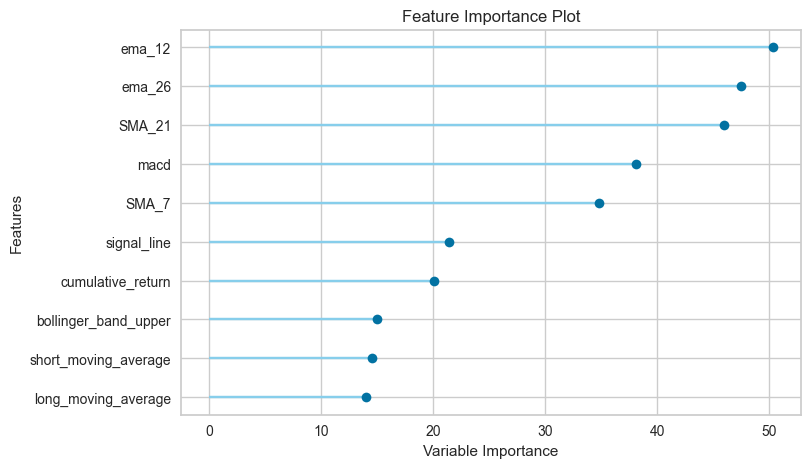

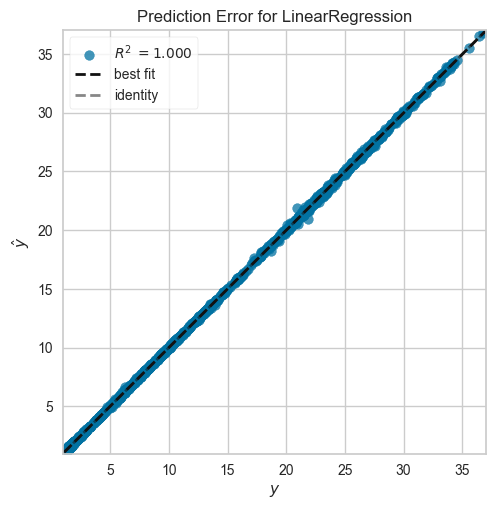

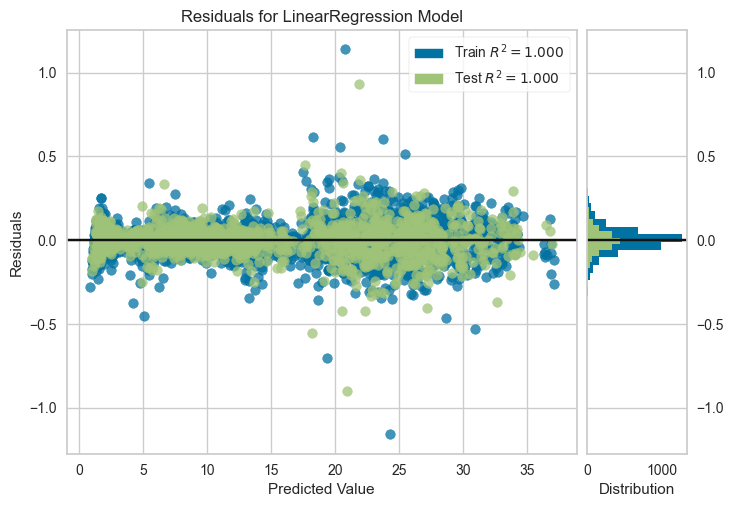

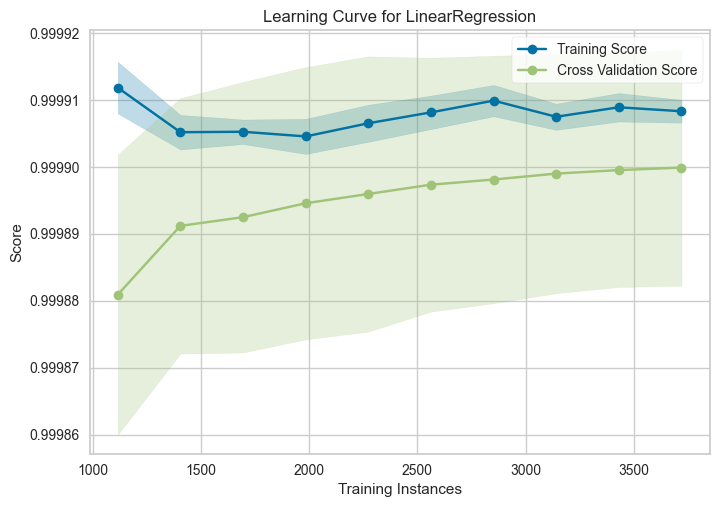

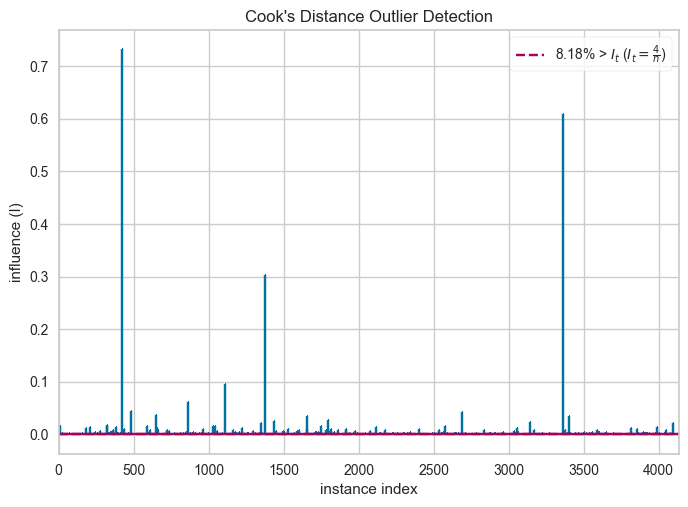

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [125]:
# Importância das Features
plot_model(final_model, plot='feature')

# Erro de Previsão
plot_model(final_model, plot='error')

# Residuals
plot_model(final_model, plot='residuals')

# Curva de Aprendizado
plot_model(final_model, plot='learning')

# Ganhos Cumulativos
# plot_model(final_model, plot='cumulative')

# Resíduos vs Leverage
# plot_model(final_model, plot='residuals_vs_leverage')

# Distância de Cook
plot_model(final_model, plot='cooks')

# Avaliação completa do modelo
evaluate_model(final_model)

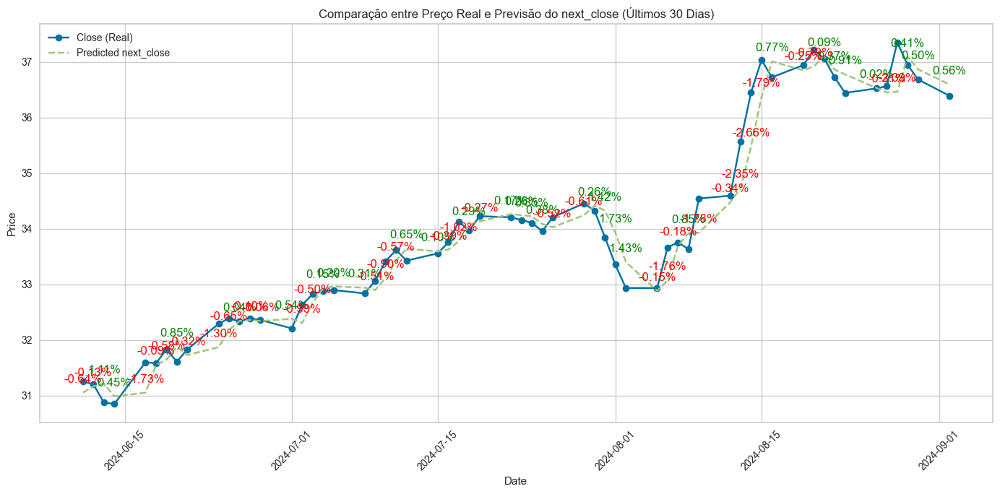

In [126]:
import matplotlib.pyplot as plt

# Seleciona os últimos 30 dias do dataframe original
last_30_days = df.iloc[-61:-1].copy()

# Adiciona a coluna de previsão no dataframe
last_30_days['predicted_next_close'] = np.nan

# Realiza a previsão para cada dia e adiciona no dataframe
for i in range(59, -1, -1):
    X_new = df_filtrd.drop(['next_close'], axis=1).iloc[-(i+2)].values.reshape(1, -2)
    X_new_df = pd.DataFrame(X_new, columns=df_filtrd.drop(['next_close'], axis=1).columns)
    prediction_result = predict_model(final_model, data=X_new_df)
    predicted_price_normalized = prediction_result.iloc[0]['prediction_label']
    
    predicted_price = predicted_price_normalized
    
    # Armazena a previsão na linha correta
    last_30_days.iloc[-(i+1), last_30_days.columns.get_loc('predicted_next_close')] = predicted_price.flatten()[0]

# Calcula a diferença percentual entre o Close e o Predicted next_close
last_30_days['percentage_difference'] = (last_30_days['predicted_next_close'] - last_30_days['Close']) / last_30_days['Close'] * 100

# Plotando o gráfico
plt.figure(figsize=(14, 7))
plt.plot(last_30_days['Date'], last_30_days['Close'], label='Close (Real)', marker='o')
plt.plot(last_30_days['Date'], last_30_days['predicted_next_close'], label='Predicted next_close', marker='x', linestyle='--')

# Adiciona anotações de porcentagem de diferença
for i in range(len(last_30_days)):
    diff = last_30_days.iloc[i]['percentage_difference']
    color = 'green' if diff > 0 else 'red'
    plt.annotate(f'{diff:.2f}%', 
                 (last_30_days.iloc[i]['Date'], last_30_days.iloc[i]['predicted_next_close']),
                 textcoords="offset points", 
                 xytext=(0,10), 
                 ha='center',
                 color=color)

plt.title('Comparação entre Preço Real e Previsão do next_close (Últimos 30 Dias)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()

# Exibe o gráfico
plt.show()

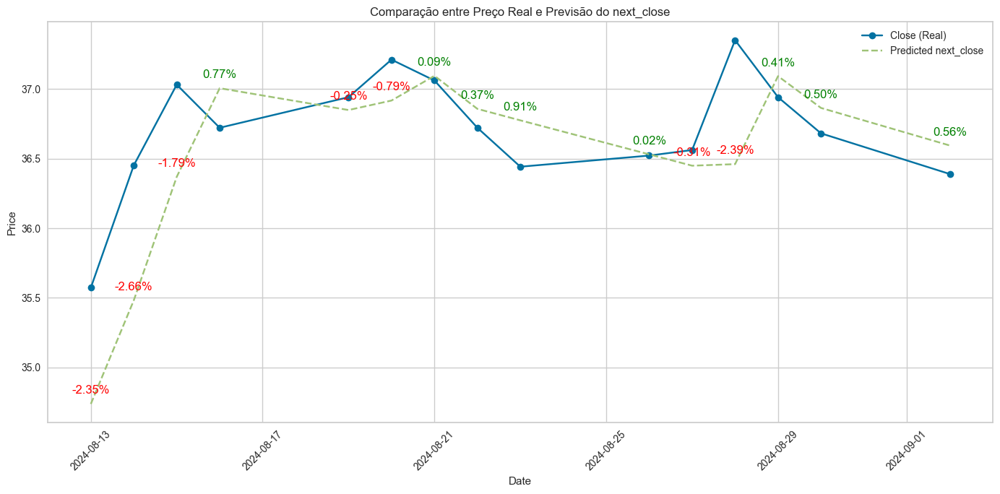

In [127]:
import matplotlib.pyplot as plt

# Seleciona os últimos 15 dias do dataframe original
last_15_days = df.iloc[-16:-1].copy()

# Adiciona a coluna de previsão no dataframe
last_15_days['predicted_next_close'] = np.nan

# Realiza a previsão para cada dia e adiciona no dataframe
for i in range(14, -1, -1):
    X_new = df_filtrd.drop(['next_close'], axis=1).iloc[-(i+2)].values.reshape(1, -2)
    X_new_df = pd.DataFrame(X_new, columns=df_filtrd.drop(['next_close'], axis=1).columns)
    prediction_result = predict_model(final_model, data=X_new_df)
    predicted_price_normalized = prediction_result.iloc[0]['prediction_label']
    
    predicted_price = predicted_price_normalized
    
    # Armazena a previsão na linha correta
    last_15_days.iloc[-(i+1), last_15_days.columns.get_loc('predicted_next_close')] = predicted_price.flatten()[0]

# Calcula a diferença percentual entre o Close e o Predicted next_close
last_15_days['percentage_difference'] = (last_15_days['predicted_next_close'] - last_15_days['Close']) / last_15_days['Close'] * 100

# Plotando o gráfico
plt.figure(figsize=(14, 7))
plt.plot(last_15_days['Date'], last_15_days['Close'], label='Close (Real)', marker='o')
plt.plot(last_15_days['Date'], last_15_days['predicted_next_close'], label='Predicted next_close', marker='x', linestyle='--')

# Adiciona anotações de porcentagem de diferença
for i in range(len(last_15_days)):
    diff = last_15_days.iloc[i]['percentage_difference']
    color = 'green' if diff > 0 else 'red'
    plt.annotate(f'{diff:.2f}%', 
                 (last_15_days.iloc[i]['Date'], last_15_days.iloc[i]['predicted_next_close']),
                 textcoords="offset points", 
                 xytext=(0,10), 
                 ha='center',
                 color=color)

plt.title('Comparação entre Preço Real e Previsão do next_close')
plt.xlabel('Date')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()

# Exibe o gráfico
plt.show()

In [128]:
import matplotlib.pyplot as plt
import pandas as pd

def analyze_daily_returns(model, df, df_filtrd, min_daily_return_percentage=5, days=60):
    # Seleciona os últimos 'days' dias do dataframe original
    history_days = df.iloc[-days:].copy()

    # Adiciona a coluna de previsão no dataframe
    history_days['predicted_close'] = np.nan

    # Realiza a previsão para cada dia e adiciona no dataframe
    for i in range(days-1, 0, -1):
        X_new = df_filtrd.drop(['next_close'], axis=1).iloc[-(i+1)].values.reshape(1, -1)
        X_new_df = pd.DataFrame(X_new, columns=df_filtrd.drop(['next_close'], axis=1).columns)
        prediction_result = predict_model(model, data=X_new_df)
        predicted_price_normalized = prediction_result.iloc[0]['prediction_label']

        predicted_price = predicted_price_normalized

        # Armazena a previsão na linha correta (previsão para o dia seguinte)
        history_days.iloc[-i, history_days.columns.get_loc('predicted_close')] = predicted_price

    # Calcula o retorno diário real entre Close e Open
    history_days['daily_return_percentage'] = (history_days['predicted_close'] - history_days['Open']) / history_days['Open'] * 100

    # Calcula a diferença entre Close e Next Close previsto
    history_days['close_nextclose_diff'] = history_days['predicted_close'] - history_days['Close']

    # Filtra os dias com retorno diário maior que a porcentagem mínima definida
    filtered_days = history_days[history_days['daily_return_percentage'].abs() > min_daily_return_percentage]

    # Plotando o gráfico
    plt.figure(figsize=(14, 7))
    plt.plot(history_days['Date'], history_days['Close'], label='Close (Real)', marker='o')
    plt.plot(history_days['Date'], history_days['predicted_close'], label='Predicted Next Close (Previous Day)', marker='x', linestyle='--')

    # Adiciona anotações de retorno, diferença entre Close e Next Close, e a data
    for i in range(len(filtered_days)):
        row = filtered_days.iloc[i]
        return_diff = row['daily_return_percentage']
        close_nextclose_diff = row['close_nextclose_diff']
        date = row['Date'].strftime('%Y-%m-%d')
        color = 'green' if return_diff > 0 else 'red'
        annotation_text = f'{date}\n{return_diff:.2f}%\nΔ: {close_nextclose_diff:.2f}'
        plt.annotate(annotation_text, 
                     (row['Date'], row['Close']),
                     textcoords="offset points", 
                     xytext=(0,10), 
                     ha='center',
                     color=color)

    plt.title(f'Comparação entre Fechamento Real e Previsão do Fechamento Anterior (Últimos {days} Dias)\nRetornos Diários Maiores que {min_daily_return_percentage}%')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()

    # Exibe o gráfico
    plt.show()

    return history_days, filtered_days

In [157]:
import pandas as pd
import matplotlib.pyplot as plt

def simulate_investment_strategy(result_df, filtered_days, initial_investment=1000):
    # Inicializa variáveis
    investment_value = initial_investment
    strategy_performance = []

    # Cria listas para armazenar os resultados da simulação
    dates = []
    opens = []
    closes = []
    predicted_closes = []
    investment_values = []
    daily_returns = []

    # Simula a estratégia
    for i in range(len(filtered_days)):
        row = filtered_days.iloc[i]
        date = row['Date']
        open_price = row['Open']
        close_price = row['Close']

        # Calcula o retorno do investimento
        shares_bought = investment_value / open_price
        final_value = shares_bought * close_price
        daily_return = final_value - investment_value

        # Apenas atualiza o valor do investimento se houve ganho
        if daily_return > 0:
            investment_value = final_value

            # Armazena os resultados nas listas
            dates.append(date)
            opens.append(open_price)
            closes.append(close_price)
            predicted_closes.append(row['predicted_close'])
            investment_values.append(investment_value)
            daily_returns.append(daily_return)

            # Armazena o valor do investimento para o gráfico
            strategy_performance.append(investment_value)

    # Calcula o ganho ou perda total e a porcentagem
    total_gain_loss = investment_value - initial_investment
    gain_loss_percentage = (total_gain_loss / initial_investment) * 100
    gain_loss_text = "Ganho" if total_gain_loss > 0 else "Perda"

    # Cria um DataFrame a partir das listas
    simulation_df = pd.DataFrame({
        'Date': dates,
        'Open': opens,
        'Close': closes,
        'predicted_close': predicted_closes,
        'investment_value': investment_values,
        'daily_return': daily_returns
    })

    # Plotando o desempenho da estratégia
    plt.figure(figsize=(14, 7))
    plt.plot(simulation_df['Date'], simulation_df['investment_value'], label='Valor do Investimento', marker='o', linestyle='-')
    plt.title(f'Desempenho da Estratégia de Investimento (Apenas Dias com Ganho)\n{gain_loss_text}: R${total_gain_loss:.2f} ({gain_loss_percentage:.2f}%)')
    plt.xlabel('Date')
    plt.ylabel('Valor do Investimento (R$)')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    
    # Exibe o gráfico
    plt.show()

    return simulation_df

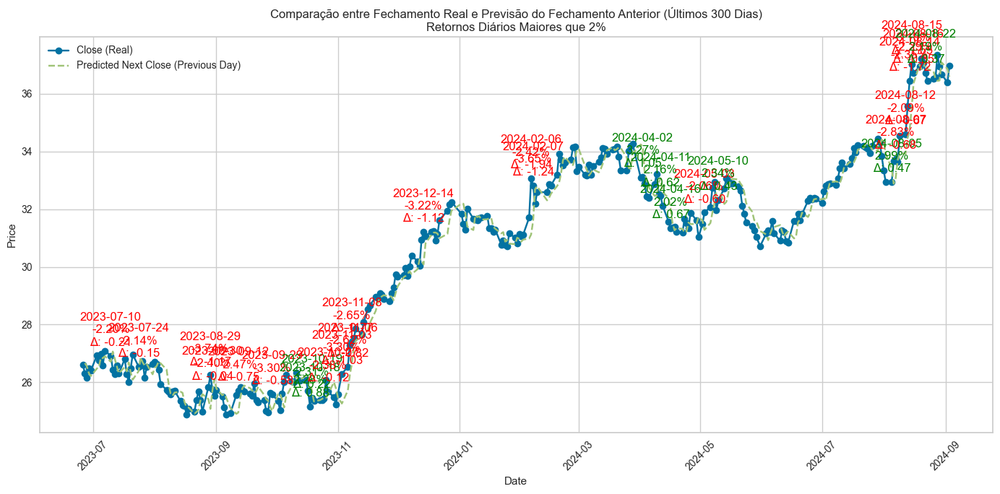

In [159]:
result_df, filtered_days = analyze_daily_returns(final_model, df, df_filtrd, min_daily_return_percentage=2, days=300)

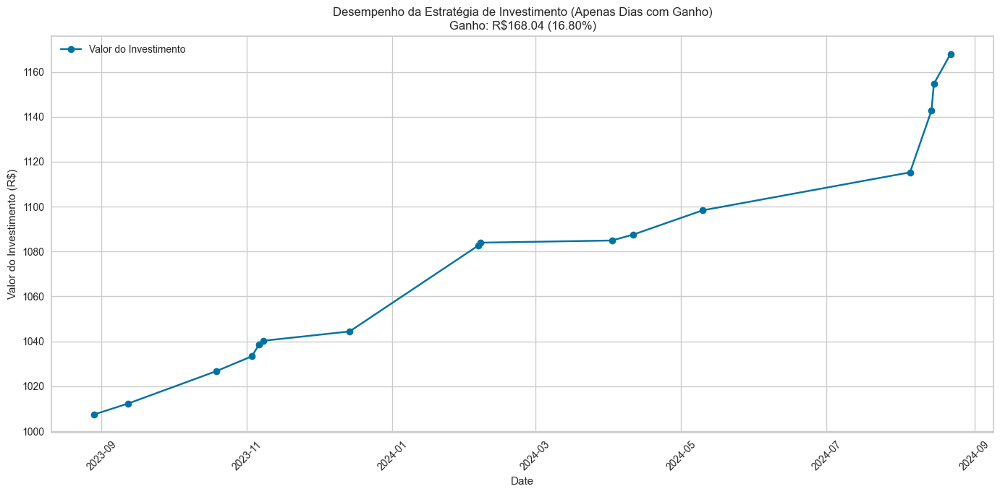

In [160]:
simulation_results =simulate_investment_strategy(result_df, filtered_days, initial_investment=1000)

[*********************100%%**********************]  1 of 1 completed


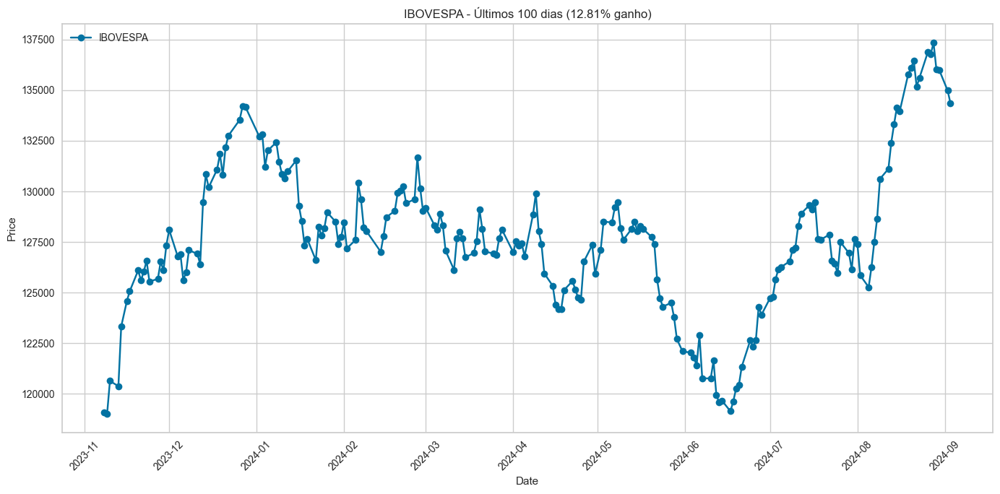

In [151]:
import yfinance as yf
import matplotlib.pyplot as plt
import datetime

# Define o período de 100 dias
end_date = datetime.datetime.now()
start_date = end_date - datetime.timedelta(days=300)

# Baixa os dados da IBOVESPA
ibovespa = yf.download('^BVSP', start=start_date, end=end_date)

# Verifica se os dados foram baixados corretamente
if not ibovespa.empty:
    # Calcula a variação percentual
    start_price = ibovespa['Close'].iloc[0]
    end_price = ibovespa['Close'].iloc[-1]
    percentage_change = ((end_price - start_price) / start_price) * 100
    
    # Plota o gráfico
    plt.figure(figsize=(14, 7))
    plt.plot(ibovespa.index, ibovespa['Close'], label='IBOVESPA', marker='o')
    
    # Adiciona o título com a porcentagem de ganho ou perda
    plt.title(f'IBOVESPA - Últimos 100 dias ({percentage_change:.2f}% {"ganho" if percentage_change > 0 else "perda"})')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    
    # Exibe o gráfico
    plt.show()
else:
    print("Não foi possível baixar os dados da IBOVESPA.")


In [148]:
import matplotlib.pyplot as plt
import pandas as pd

def analyze_daily_returns_real(df, min_daily_return_percentage=5, days=60):
    # Seleciona os últimos 'days' dias do dataframe original
    history_days = df.iloc[-days:].copy()

    # Calcula o retorno diário real entre Close e Open
    history_days['daily_return_percentage'] = (history_days['Close'] - history_days['Open']) / history_days['Open'] * 100

    # Filtra os dias com retorno diário maior que a porcentagem mínima definida e somente positivos
    filtered_days = history_days[(history_days['daily_return_percentage'] > min_daily_return_percentage)]

    # Plotando o gráfico
    plt.figure(figsize=(14, 7))
    plt.plot(history_days['Date'], history_days['Close'], label='Close (Real)', marker='o')

    # Adiciona anotações de retorno e a data
    for i in range(len(filtered_days)):
        row = filtered_days.iloc[i]
        return_diff = row['daily_return_percentage']
        date = row['Date'].strftime('%Y-%m-%d')
        annotation_text = f'{date}\n{return_diff:.2f}%'
        plt.annotate(annotation_text, 
                     (row['Date'], row['Close']),
                     textcoords="offset points", 
                     xytext=(0,10), 
                     ha='center',
                     color='green')

    plt.title(f'Dias com Retorno Diário Positivo Maior que {min_daily_return_percentage}% (Últimos {days} Dias)')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()

    # Exibe o gráfico
    plt.show()

    return history_days, filtered_days

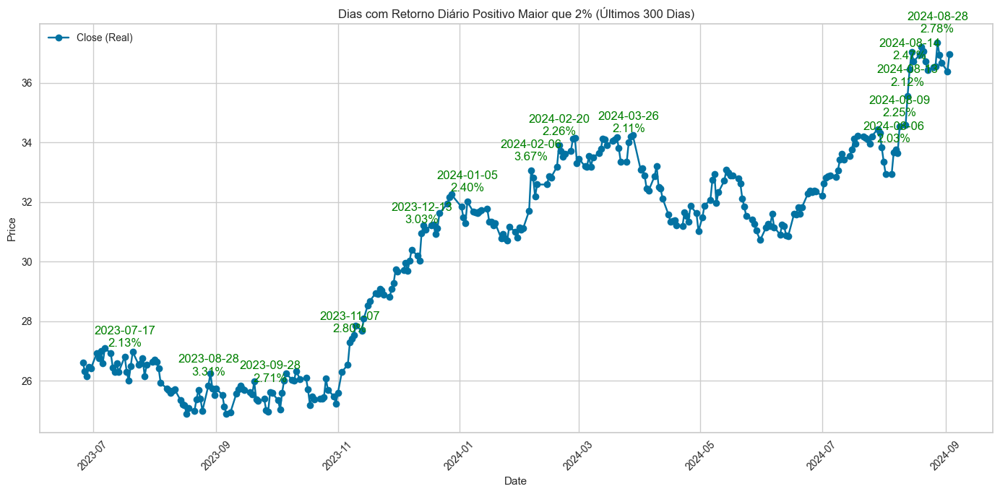

In [161]:
history_days_real, filtered_days_real = analyze_daily_returns_real(df, min_daily_return_percentage=2, days=300)

In [146]:
import pandas as pd
import matplotlib.pyplot as plt

def simulate_investment_strategy_real(df, filtered_days, initial_investment=1000):
    # Inicializa variáveis
    investment_value = initial_investment
    strategy_performance = []

    # Cria listas para armazenar os resultados da simulação
    dates = []
    opens = []
    closes = []
    investment_values = []
    daily_returns = []

    # Simula a estratégia
    for i in range(len(filtered_days)):
        row = filtered_days.iloc[i]
        date = row['Date']
        open_price = row['Open']
        close_price = row['Close']

        # Calcula o retorno do investimento
        shares_bought = investment_value / open_price
        final_value = shares_bought * close_price
        daily_return = final_value - investment_value

        # Atualiza o valor do investimento
        investment_value = final_value

        # Armazena os resultados nas listas
        dates.append(date)
        opens.append(open_price)
        closes.append(close_price)
        investment_values.append(investment_value)
        daily_returns.append(daily_return)

        # Armazena o valor do investimento para o gráfico
        strategy_performance.append(investment_value)

    # Calcula o lucro ou perda total
    total_gain_or_loss = investment_value - initial_investment
    total_gain_or_loss_percentage = (total_gain_or_loss / initial_investment) * 100

    # Cria um DataFrame a partir das listas
    simulation_df = pd.DataFrame({
        'Date': dates,
        'Open': opens,
        'Close': closes,
        'investment_value': investment_values,
        'daily_return': daily_returns
    })

    # Plotando o desempenho da estratégia
    plt.figure(figsize=(14, 7))
    plt.plot(simulation_df['Date'], simulation_df['investment_value'], label='Valor do Investimento', marker='o', linestyle='-')
    plt.title(f'Desempenho da Estratégia de Investimento - Lucro/Perda: {total_gain_or_loss:.2f} R$ ({total_gain_or_loss_percentage:.2f}%)')
    plt.xlabel('Date')
    plt.ylabel('Valor do Investimento (R$)')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    
    # Exibe o gráfico
    plt.show()

    return simulation_df

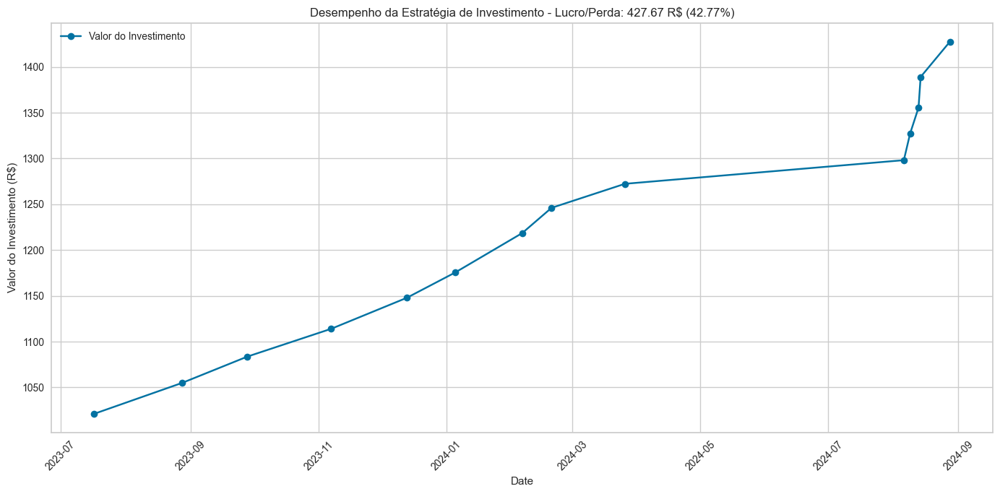

In [162]:
simulation_results_real = simulate_investment_strategy_real(history_days_real, filtered_days_real, initial_investment=1000)

# Conclusão

Para a ação escolhida foi simulado o ganho tanto usando o modelo para indicar os dias de compra e venda, quanto uma simulação com os dados reais. Usando o target de 3% os dados reais tiveram um ganho de %10.35 para o periodo de 300 dias, usando o modelo o ganho foi de %3.07 e a IBOVESPA para o mesmo periodo foi de %12.81. Em um segundo teste, agora com o target em 2% o resulto já foi bem melhor, o modelo teve lucro para o periodo de %16.8, o real teve um lucro de %42.77.  como resultado de só uma ação o retorno foi bem menor que o esperado com target de %3, mas ainda obteve lucro, aumentando o numero de ações assistidas o retorno poderia ser maior que a IBOVESPA. Um ponto de atenção foi no caso da ação ITUB4 o melhor modelo foi a regressão linear, algo que se mostra com para ações que tem ganhos constantes no periodo, mesmo que inferiores ao %3. para ações mais volateis esse modelo não mostrou ser o melhor, podendo os outros modelos terem um desenpenho maior. Como próximos passos fica a ideia de em vez de uma unica ação tentar fazer o modelo para 5 ou mais, e juntar os resultados para superar a IBOVESPA. Com o target de 2% o modelo superou o ganho da IBOVESPA e mesmo não tendo %100 de acertividade com relação ao valor de fechamento da ação não errou a ponto de gerar lucro, mostrando ser uma boa estrategia, um ponto de atenção sobre usar um target menor é olhar o custo das transações na B3 para não ter risco usar todo o lucro com taxas.